<a href="https://colab.research.google.com/github/fluderm/hangman/blob/main/Policy_Gradient.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import json
import requests
import random
import string
import secrets
import time
import re
import collections
try:
    from urllib.parse import parse_qs, urlencode, urlparse
except ImportError:
    from urlparse import parse_qs, urlparse
    from urllib import urlencode
    
    
#myimports:

import pandas as pd
import numpy as np
import random

# Create Training and Test Data

In [ ]:
text_file = open('words_250000_train.txt',"r")
full_dictionary = text_file.read().splitlines()
text_file.close()

In [ ]:
alt_dict=pd.read_csv('words_pos.csv')
alt_dict_words=alt_dict['word'].to_numpy()
alt_dict_words.sort()

train_words=full_dictionary
train_words.sort()



In [ ]:
test_words1=[]

foundprev=0
for count,altword in enumerate(alt_dict_words):
    j=0
    while train_words[foundprev+j]<altword: j+=1
        
    if train_words[foundprev+j]==altword: foundprev=foundprev+j
    else: test_words1.append(altword)
    
#    if count%(len(alt_dict_words)/10)==0 and count>0:
#        print(count/len(alt_dict_words),' done', end = "\r")

#test_wordsnp=np.array(test_words1)

In [ ]:
with open("test_words.txt", 'w') as file:
    for row in test_words1:
        s = "".join(map(str, row))
        file.write(s+'\n')

# Auxiliary stuff

In [ ]:
letthsh={chr(i+97):0 for i in range(0,26)}

for word in full_dictionary:
    for letter in set(word):
        letthsh[letter]+=1
        
totletts=sum(letthsh[letter] for letter in letthsh)

for letter in letthsh:
    letthsh[letter]/=totletts

sorted_overall=[(letter,letthsh[letter]) for letter in letthsh]
sorted_overall.sort(key=lambda x:x[1],reverse=True)

alphabet={chr(i+97) for i in range(0,26)}

# Create Hangman Environment

In [ ]:
class Hangman(object) :
    def __init__(self , 
                 word_src, 
                 max_lives = 6 , 
                 win_reward = 10,
                 correct_reward = 1,
                 repeated_guessing_penalty = -100,
                 lose_reward = -10, 
                 false_reward = -1,
                 verbose = False,
                 alpha = .6) :
        if type(word_src) == list :
            self.words = word_src
        else :
            with open(word_src, 'r') as f :
                self.words = f.read().splitlines()
        self.max_lives = max_lives
        self.win_reward = win_reward
        self.correct_reward = correct_reward
        self.lose_reward = lose_reward
        self.false_reward = false_reward
        self.verbose = verbose
        self.repeated_guessing_penalty = repeated_guessing_penalty
        self.current_dictionary = []
        self.alt_dict=False
        self.score_hash={chr(i+97):0 for i in range(0,26)}
        self.alpha=alpha
        self.c_past=[]
        self.false_guesses_p=[]
        
    def pick_random(self) :
        self.guess_word = np.random.choice(self.words)
        
    def reset(self) :
        self.curr_live = self.max_lives
        self.pick_random()
        self.guessing_board = ['_' for i in range(len(self.guess_word))]
        self.correct_guess = 0
        self.guessed = []
        self.done = False
        self.alt_dict = False
        if self.verbose :
            print('Game Starting')
            print(f'Current live : {self.curr_live: .2f}')
        return self.show_gameboard()
        

    def show_gameboard(self) :
        board = ''.join(self.guessing_board)
        if self.verbose:
            print(board)
            print()
        return board
        
    def step(self, letter) :
        if not(letter.isalpha()) :
            raise TypeError('Can only accept alphabet')
        letter = letter.lower()

        if letter not in self.guessed :
            self.guessed.append(letter)
        else :
            if self.verbose :
                print('Letter already used')
            return self.show_gameboard(), self.repeated_guessing_penalty, self.done, {}


        if letter in self.guess_word :
            for i in range(len(self.guess_word)) :
                if letter == self.guess_word[i] :
                    self.guessing_board[i] = letter
                    self.correct_guess += 1
            if self.correct_guess == len(self.guess_word) :
                self.done = True
                if self.verbose :
                    print('You Win')
                    print('Word is', self.guess_word)
                return self.guess_word, self.win_reward, self.done, {'ans' : self.guess_word}
            else :                
                return self.show_gameboard(), self.correct_reward, self.done, {}
        else :
            self.curr_live -= 1
            if self.curr_live == 0 :
                self.done = True
                if self.verbose :
                    print('You Lose')
                    print('Word is', self.guess_word)
                return self.show_gameboard(), self.lose_reward, self.done, {'ans_missed' : self.guess_word}
            else :
                if self.verbose :
                    print('Current lives :', self.curr_live)
                return self.show_gameboard(), self.false_reward, self.done, {}

    #------------------------------------------------------------------------------------------
    # "hardcoded" guessing (pattern-matching approach based on train dictionary):
    # Acheive ~60% success rate on test dictionary.

    def guess(self,word):
        
        false_guesses=''
        for letter in self.guessed:
            if letter in set(word): continue
            else: false_guesses=''.join([false_guesses,letter])

        if false_guesses=='':
            false_guesses_re='.'
        else:
            false_guesses_re='[^'+false_guesses+']'
        
        word_list=list(word)
        first_non_u=0
        for lett in word_list:
            if lett=='_': first_non_u+=1
            else: break
                
        last_non_u=len(word_list)-1
        for i in range(last_non_u,first_non_u,-1):
            if lett=='_': last_non_u-=1
            else: break
        
        clean_word = word[first_non_u:last_non_u+1:1].replace("_",false_guesses_re)
        clean_word = '^.*?'+clean_word
        
        len_word = len(word[::1])
        
        if len(self.guessed)==0:
            self.current_dictionary = full_dictionary
            self.score_hash= {item:letthsh[item] for item in letthsh}  #{chr(i+97):0. for i in range(0,26)}
            return 'e'

        new_dictionary = []
        new_dictionary_set=[]

        def intersection_length(l1, l2):
            return sum(1 if item in l2 else 0 for item in l1)
        
        def find_in_dict(lst,dic,max_length):
            random.shuffle(lst)
            for patt in lst:
                new_clean_word = '^.*?'+patt.replace("_",false_guesses_re)
                for word in dic:
                    if re.match(new_clean_word,word):
                        new_dictionary.append(word)
                        new_dictionary_set.append("".join(set(word)))
                if len(new_dictionary)>max_length:
                        return
                        
        if len(self.current_dictionary)<1000: self.alt_dict=True                
        
        perc_missing=intersection_length(word, '_'*len(word))/len(word)
        
        all_clean_words=[]
        
        if self.alt_dict:
            length_of_pattern=(last_non_u+1)-first_non_u
            while len(new_dictionary)<100:
                word0='_'+word[first_non_u:last_non_u+1:1]+'_'
                len_word0=len(word0)
                clean_words=[]
                
                for i in range(len_word0-length_of_pattern):
                    if intersection_length(word0[i:i+length_of_pattern],'_'*length_of_pattern)<=length_of_pattern//2:
                        clean_words.append(word0[i:i+length_of_pattern])
                
                all_clean_words.append(clean_words)
                
                dictionary0=self.current_dictionary if self.false_guesses_p!=false_guesses else full_dictionary
                
                find_in_dict(clean_words,dictionary0,max_length=perc_missing*500)
#                print(all_clean_words)
                length_of_pattern=length_of_pattern-1
        else:
            for wrd in self.current_dictionary:
                if re.match(clean_word,wrd):
                    new_dictionary.append(wrd)
                    new_dictionary_set.append("".join(set(wrd)))
        
        self.false_guesses_p=false_guesses
        
#       can we exploit pre/mid/post pattern frequency of letters:
#       find densest pattern of length >=3:

        def list_of_tup_to_string(listoftup):
            tot=''
            for x in listoftup:
                for y in x:
                    tot+=y
            return tot
            
        length_pattern=4
        all_patt=[]
        
        for i in range(len_word-length_pattern+1):
            is_len=intersection_length(word[i:i+length_pattern],"_"*length_pattern)
            if is_len<=length_pattern/4 and is_len>0:
                xpat=(word[max(i-1,0):min(i+length_pattern+1,len_word)].replace('__','_'))
                k=0
                while k+4<=len(xpat):
                    all_patt.append(xpat[k:k+4].replace("_",'(.?)'))
                    k+=1
#                print(all_patt)

        if all_patt!=[]:
            all_patt=set(all_patt)
            pattern_letters=[]
#            print('allpats:',all_patt)
            dict0=new_dictionary

        #full_dictionary if intersection_length(word, '_'*len_word)<=1 else new_dictionary
            for wrd in dict0:
                for patt in all_patt:
                    pattern_letters+=list_of_tup_to_string(re.findall(patt,wrd))

            c_patt=collections.Counter(pattern_letters)
            sorted_patt_count = c_patt.most_common()
#            print('sorted pattern count',sorted_patt_count)
            
        self.current_dictionary = new_dictionary

        curr_dict_len=len(self.current_dictionary)
#        print('length of current dictionary:',curr_dict_len)
        
#       naive count:
        
        full_dict_string = "".join(new_dictionary_set)
        c = collections.Counter(full_dict_string)
        sorted_letter_count = c.most_common()
        
#        print('collectionscounter:',sorted_letter_count)
        
#         for letter in self.guessed:
#             self.score_hash[letter]=0
#         eps=1/10**8
#         ctot=sum((c[item] if item in c else 0) for item in alphabet)
#         ctot=ctot if ctot>0 else eps
#         cmean=1/len(alphabet)*sum(c[item]/ctot for item in c)
#         var=1/10**8#1/(ctot-1)*sum((c[item]/ctot-cmean)**2 for item in c)
#         sigma=np.sqrt(var)
#         likelihoodN={item:np.random.normal(loc=c[item]/ctot, scale=sigma, size=None) for item in alphabet}
        
#         norm=sum(likelihoodN[item]*self.score_hash[item] for item in alphabet)
        
#         for i in alphabet:
#             self.score_hash[i]=((likelihoodN[i]*self.score_hash[i]/norm))
                
#        totcheck=sum(self.score_hash[letter] for letter in self.score_hash)        
#        print(totcheck)
#        sorted_letter_count = c.most_common()     
    
        def counter_mult(ctr,nmbr):
            for lttr in ctr.keys():
                ctr[lttr]=ctr[lttr]*nmbr
            return ctr

        guess_letter = '!'
#        for letter,instance_count in sorted_letter_count:
#            if letter not in self.guessed:
#                guess_letter = letter
#                break

        if all_patt!=[]:
            c_joint=(c_patt+counter_mult(c,perc_missing))
            sorted_c_joint=c_joint.most_common()
#            print('patt_sort:',sorted_patt_count)
#            print('c_sort:',sorted_letter_count)
#            print('current_dic:',self.current_dictionary)
            for letter,instance_count in sorted_c_joint:
                if letter not in self.guessed:
                    guess_letter = letter
                    break

        if guess_letter == '!':        
            for letter,instance_count in sorted_letter_count:
                if letter not in self.guessed:
                    guess_letter = letter
                    break
        
        if guess_letter == '!':
#            print(self.guess_word)
#            print('sorted_pattern_count:',sorted_patt_count)
#            print('current_dic:',self.current_dictionary)
            for letter,instance_count in self.c_past:
                if letter not in self.guessed:
                    guess_letter = letter
                    break    
                    
        if guess_letter == '!':    
            for letter,instance_count in sorted_overall:
                if letter not in self.guessed:
                    guess_letter = letter
                    break     

        
        self.c_past=(sorted_letter_count if all_patt==[] else sorted_c_joint)

#            lsthsh=[]
#            for letter in self.score_hash:
#                lsthsh.append((letter,self.score_hash[letter]))

#            lsthsh.sort(key = lambda x: x[1],reverse=True) 
#            for letter,score in lsthsh:
#                if letter not in self.guessed:
#                    guess_letter = letter
#                    break
                    
        return guess_letter

# Reinforcement Learning

In [ ]:
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. CNNs can be very slow without a GPU.")
    
# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
#np.random.seed(42)
#tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

## Preprocess Input

In [ ]:
max_len=0
for word in full_dictionary:
    if len(word)>max_len:
        max_len=len(word)
for word in test_words1:
    if len(word)>max_len:
        max_len=len(word)

In [ ]:
#NB: - Cutting off the end pieces of very long words -- maybe there is a better way of dealing with this
#    - We are assuming the input is alphabetical except for the _. Maybe account for other input too.

def state_to_input(stat,max_length=max_len):
    inp=[ord(i.lower())-96 if i.isalpha() else 27 for i in stat]
    while len(inp)<max_length:
        inp.append(0)
    return inp[:min(len(inp),max_length)]

In [ ]:
letters=[chr(i+ord('a')) for i in range(26)]

In [ ]:
def guess_to_input(guess):
    return [1 if i in guess else 0 for i in letters]

## Setup the Neural Network

In [ ]:
keras.backend.clear_session()
#np.random.seed(42)
#tf.random.set_seed(42)

In [ ]:
# Guessed_input layers

guessed_inputs = keras.Input(shape=(26,))
guessed_feature = keras.layers.Dense(60, activation='elu',name='guess1')(guessed_inputs)
guessed_feature = keras.layers.Dense(60, activation='tanh',name='animmal')(guessed_feature)

guessed_model = keras.Model(guessed_inputs, guessed_feature, name='guessed')

# State_input layers

max_length=max_len

state_inputs = keras.Input(shape=(max_length,))
state_feature = keras.layers.Embedding(max_length,128, mask_zero = True)(state_inputs)
state_feature = keras.layers.Bidirectional(keras.layers.LSTM(128 , return_sequences=True))(state_feature)
state_feature = keras.layers.Bidirectional(keras.layers.LSTM(128 , return_sequences=True))(state_feature)
state_feature = keras.layers.GlobalAveragePooling1D()(state_feature)
state_feature = keras.layers.Dense(100, activation = 'tanh', name='final')(state_feature)

state_model = keras.Model(state_inputs,state_feature , name = 'state')

# Final Layers

inputs = keras.layers.Concatenate()([state_model.output, guessed_model.output])
feature = keras.layers.Dense(100, activation = 'elu')(inputs)
feature = keras.layers.Dense(26, activation = 'softmax')(feature)

# Full Model

full_model = keras.Model([state_model.input, guessed_model.input], feature, name = 'fullmodel')
full_model.compile(loss = 'categorical_crossentropy', optimizer = keras.optimizers.Adam(1e-3, clipnorm=1))

In [ ]:
full_model.summary()

Model: "fullmodel"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 31)]         0           []                               
                                                                                                  
 embedding (Embedding)          (None, 31, 128)      3968        ['input_2[0][0]']                
                                                                                                  
 bidirectional (Bidirectional)  (None, 31, 256)      263168      ['embedding[0][0]']              
                                                                                                  
 bidirectional_1 (Bidirectional  (None, 31, 256)     394240      ['bidirectional[0][0]']          
 )                                                                                        

## Setup The Agent

In [ ]:
alphabet = [chr(i+97) for i in range(0,26)]

In [ ]:
def play_one_step(env, obs, guessed_letters, correct_answer, full_model, loss_fn,policy='greedy'):
    with tf.GradientTape() as tape:

        inp1=np.array([state_to_input(obs)])
        inp2=np.array([guess_to_input(guessed_letters)])

        action_proba = full_model([inp1,inp2]) #already normalized
        action_proba /= np.array(action_proba).sum()

        if policy=='greedy':
            sorted_proba=np.argsort(-np.array(action_proba))[0]

            # pick non-guessed letters only: (could teach agent this)
            for it in sorted_proba:
                if alphabet[it] not in guessed_letters:
                    action_guess=alphabet[it]
                    break
        else:
            action = np.random.choice(np.arange(1,action_proba.shape[1]+1), p = np.array(action_proba)[0])
            action_guess=chr(96+action)

        all_correct = np.array([[1 if x in correct_answer else 0 for x in alphabet]])
        all_correct_not_guessed = all_correct*(1.-inp2)
        all_correct_not_guessed/= np.array(all_correct_not_guessed).sum()

        # We only consider "standard" gradient as it performed better than policy gradient.
        loss = tf.reduce_mean(loss_fn(all_correct_not_guessed, action_proba))

    grads = tape.gradient(loss, full_model.trainable_variables)

    obs, rwd , done , wrd = env.step(action_guess)

    return obs, rwd, done, grads, loss

In [ ]:
def play_multiple_episodes(env, n_episodes,n_max_steps, full_model, loss_fn):
    all_rewards,all_grads,all_losses = [],[],[]

    for episode in range(n_episodes):
        current_rewards,current_grads,losses = [],[],[]

        obs = env.reset()
        for step in range(n_max_steps):

            obs, reward, done, grads, loss = play_one_step(env, obs, env.guessed,\
                                                     env.guess_word, full_model, loss_fn)
            current_rewards.append(reward)
            current_grads.append(grads)
            losses.append(loss)

            if done:
                break

        all_rewards.append(current_rewards)
        all_grads.append(current_grads)
        all_losses.append(tf.reduce_mean(losses))
        
    return all_rewards, all_grads, all_losses

## Introduce Discount (later guesses more important)

---



In [ ]:
def discount_rewards(rewards, discount_rate):
    discounted = np.array(rewards)
    for step in range(len(rewards) - 2, -1, -1):
        discounted[step] += discounted[step + 1] * discount_rate
    return discounted

def discount_and_normalize_rewards(all_rewards, discount_rate):
    all_discounted_rewards = [discount_rewards(rewards, discount_rate)
                              for rewards in all_rewards]
    flat_rewards = np.concatenate(all_discounted_rewards)
    reward_mean = flat_rewards.mean()
    reward_std = flat_rewards.std()
    return [(discounted_rewards - reward_mean) / reward_std
            for discounted_rewards in all_discounted_rewards]

# Train Agent

In [ ]:
from matplotlib import pyplot as plt

from sklearn.linear_model import LinearRegression

In [ ]:
loss_fn = keras.losses.categorical_crossentropy
optimizer = keras.optimizers.Adam(learning_rate=0.002) #0.01)

In [ ]:
#  win_reward = 10,
#  correct_reward = 1,
#  repeated_guessing_penalty = -100,
#  lose_reward = -10, 
#  false_reward = -1

In [ ]:
n_iterations = 50000
n_episodes_per_update = 5
n_max_steps = 30
discount_rate = 0.95
save_episode=200

In [ ]:
#full_model.save('./drive/MyDrive/Hangman_PG.h5', include_optimizer=True)

#full_model.load_weights('./drive/MyDrive/Hangman_PG.h5')

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Iter: 0, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: nan
Iter: 1, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 2, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 2.2
Iter: 3, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 1.3
Iter: 4, curr rwd: 5.2, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 5, curr rwd: -10.6, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 6, curr rwd: 3.6, current losses: 2.7, mean rwd over last 100 trials: -1.2
Iter: 7, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 8, curr rwd: -3.2, current losses: 2.6, mean rwd over last 100 trials: -1.1
Iter: 9, curr rwd: -11.2, current losses: 2.9, mean rwd over last 100 trials: -1.4
Iter: 10, curr rwd: 13.4, current losses: 2.3, mean rwd over last 100 trials: -2.3
Iter: 11, curr rwd: -4.6, current losses: 2.8, mean rwd over last 100 trials: -0.9
Iter: 12, curr rwd:

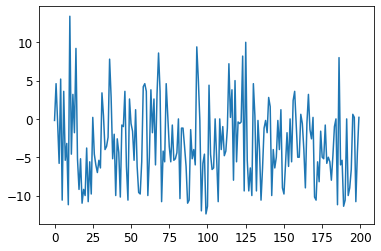

Iter: 201, curr rwd: 1.2, current losses: 2.5, mean rwd over last 100 trials: -3.4
Iter: 202, curr rwd: -8.4, current losses: 2.7, mean rwd over last 100 trials: -3.4
Iter: 203, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: -3.4
Iter: 204, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: -3.3
Iter: 205, curr rwd: -4.2, current losses: 2.5, mean rwd over last 100 trials: -3.3
Iter: 206, curr rwd: -7.2, current losses: 2.9, mean rwd over last 100 trials: -3.3
Iter: 207, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: -3.3
Iter: 208, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -3.3
Iter: 209, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: -3.3
Iter: 210, curr rwd: -11.4, current losses: 3.0, mean rwd over last 100 trials: -3.3
Iter: 211, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: -3.4
Iter: 212, curr rwd: -5.6, current losses: 2.9, mean rwd over last 100 trials

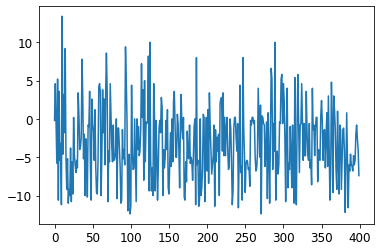

Iter: 401, curr rwd: -9.6, current losses: 2.7, mean rwd over last 100 trials: -3.5
Iter: 402, curr rwd: -8.6, current losses: 2.9, mean rwd over last 100 trials: -3.6
Iter: 403, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: -3.7
Iter: 404, curr rwd: -9.6, current losses: 2.7, mean rwd over last 100 trials: -3.6
Iter: 405, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -3.7
Iter: 406, curr rwd: -4.0, current losses: 2.8, mean rwd over last 100 trials: -3.8
Iter: 407, curr rwd: -9.4, current losses: 2.8, mean rwd over last 100 trials: -3.7
Iter: 408, curr rwd: 4.0, current losses: 2.8, mean rwd over last 100 trials: -3.8
Iter: 409, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: -3.6
Iter: 410, curr rwd: -6.2, current losses: 2.9, mean rwd over last 100 trials: -3.7
Iter: 411, curr rwd: -2.6, current losses: 2.7, mean rwd over last 100 trials: -3.7
Iter: 412, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials:

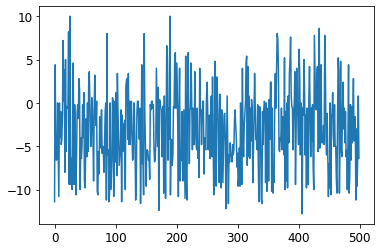

Iter: 601, curr rwd: -4.2, current losses: 2.9, mean rwd over last 100 trials: -2.6
Iter: 602, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -2.7
Iter: 603, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: -2.8
Iter: 604, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -2.7
Iter: 605, curr rwd: 5.4, current losses: 2.5, mean rwd over last 100 trials: -2.7
Iter: 606, curr rwd: -11.8, current losses: 3.0, mean rwd over last 100 trials: -2.7
Iter: 607, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: -2.6
Iter: 608, curr rwd: -8.6, current losses: 2.8, mean rwd over last 100 trials: -2.7
Iter: 609, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: -2.8
Iter: 610, curr rwd: 0.4, current losses: 2.8, mean rwd over last 100 trials: -2.9
Iter: 611, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: -2.9
Iter: 612, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 

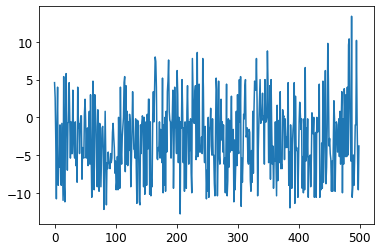

Iter: 801, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: -2.9
Iter: 802, curr rwd: 10.4, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 803, curr rwd: -6.6, current losses: 2.8, mean rwd over last 100 trials: -2.8
Iter: 804, curr rwd: 0.6, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 805, curr rwd: -9.0, current losses: 2.8, mean rwd over last 100 trials: -2.9
Iter: 806, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 807, curr rwd: -9.0, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 808, curr rwd: -9.8, current losses: 3.0, mean rwd over last 100 trials: -2.9
Iter: 809, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 810, curr rwd: 1.0, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 811, curr rwd: -7.8, current losses: 3.0, mean rwd over last 100 trials: -2.8
Iter: 812, curr rwd: -10.0, current losses: 2.9, mean rwd over last 100 trials:

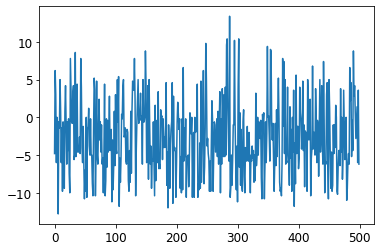

Iter: 1001, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: -2.2
Iter: 1002, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: -2.2
Iter: 1003, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: -2.2
Iter: 1004, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: -2.3
Iter: 1005, curr rwd: -8.6, current losses: 2.9, mean rwd over last 100 trials: -2.3
Iter: 1006, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: -2.3
Iter: 1007, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: -2.3
Iter: 1008, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: -2.3
Iter: 1009, curr rwd: 0.4, current losses: 2.9, mean rwd over last 100 trials: -2.3
Iter: 1010, curr rwd: 5.4, current losses: 2.6, mean rwd over last 100 trials: -2.3
Iter: 1011, curr rwd: -5.6, current losses: 2.6, mean rwd over last 100 trials: -2.1
Iter: 1012, curr rwd: -5.2, current losses: 2.8, mean rwd over last 

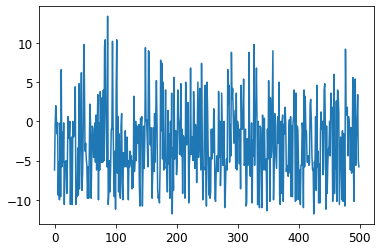

Iter: 1201, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: -3.1
Iter: 1202, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: -3.0
Iter: 1203, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 1204, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: -2.8
Iter: 1205, curr rwd: -2.4, current losses: 2.8, mean rwd over last 100 trials: -2.8
Iter: 1206, curr rwd: -5.8, current losses: 2.5, mean rwd over last 100 trials: -2.8
Iter: 1207, curr rwd: -9.8, current losses: 3.1, mean rwd over last 100 trials: -2.8
Iter: 1208, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 1209, curr rwd: 5.6, current losses: 2.6, mean rwd over last 100 trials: -2.8
Iter: 1210, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: -2.7
Iter: 1211, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -2.7
Iter: 1212, curr rwd: -4.6, current losses: 2.7, mean rwd over last 1

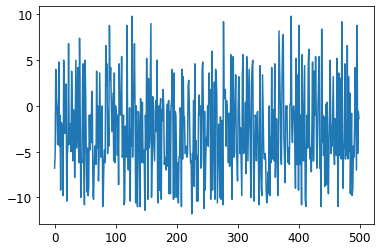

Iter: 1401, curr rwd: -11.0, current losses: 3.0, mean rwd over last 100 trials: -2.5
Iter: 1402, curr rwd: 1.0, current losses: 2.7, mean rwd over last 100 trials: -2.7
Iter: 1403, curr rwd: 1.0, current losses: 2.4, mean rwd over last 100 trials: -2.6
Iter: 1404, curr rwd: 1.0, current losses: 2.7, mean rwd over last 100 trials: -2.6
Iter: 1405, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: -2.5
Iter: 1406, curr rwd: -6.4, current losses: 2.9, mean rwd over last 100 trials: -2.4
Iter: 1407, curr rwd: -11.0, current losses: 2.7, mean rwd over last 100 trials: -2.5
Iter: 1408, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: -2.6
Iter: 1409, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: -2.6
Iter: 1410, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: -2.6
Iter: 1411, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: -2.6
Iter: 1412, curr rwd: 3.6, current losses: 2.6, mean rwd over last 1

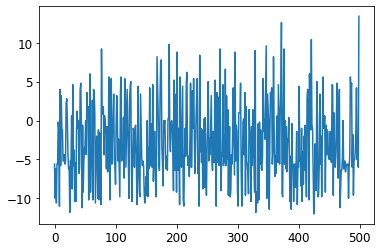

Iter: 1601, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: -3.0
Iter: 1602, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: -3.1
Iter: 1603, curr rwd: -11.2, current losses: 2.8, mean rwd over last 100 trials: -3.0
Iter: 1604, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: -3.1
Iter: 1605, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: -3.0
Iter: 1606, curr rwd: -2.6, current losses: 2.7, mean rwd over last 100 trials: -3.0
Iter: 1607, curr rwd: -2.0, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 1608, curr rwd: 2.6, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 1609, curr rwd: -4.4, current losses: 2.6, mean rwd over last 100 trials: -2.8
Iter: 1610, curr rwd: -6.2, current losses: 2.7, mean rwd over last 100 trials: -2.8
Iter: 1611, curr rwd: -0.8, current losses: 3.0, mean rwd over last 100 trials: -2.8
Iter: 1612, curr rwd: 0.8, current losses: 2.6, mean rwd over last 

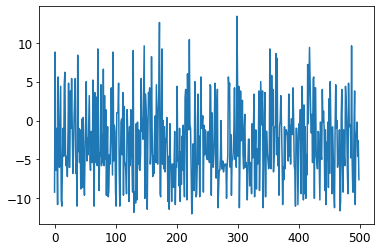

Iter: 1801, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: -2.5
Iter: 1802, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: -2.5
Iter: 1803, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: -2.6
Iter: 1804, curr rwd: 7.0, current losses: 2.5, mean rwd over last 100 trials: -2.6
Iter: 1805, curr rwd: -4.6, current losses: 2.9, mean rwd over last 100 trials: -2.5
Iter: 1806, curr rwd: -6.6, current losses: 2.8, mean rwd over last 100 trials: -2.5
Iter: 1807, curr rwd: -1.2, current losses: 2.8, mean rwd over last 100 trials: -2.6
Iter: 1808, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: -2.6
Iter: 1809, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: -2.6
Iter: 1810, curr rwd: -11.2, current losses: 2.9, mean rwd over last 100 trials: -2.6
Iter: 1811, curr rwd: -0.2, current losses: 2.8, mean rwd over last 100 trials: -2.6
Iter: 1812, curr rwd: -10.8, current losses: 3.0, mean rwd over l

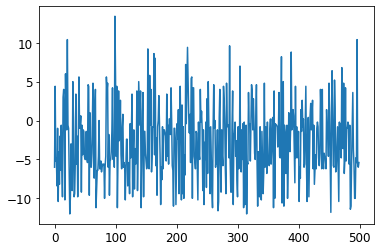

Iter: 2001, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 2002, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: -2.8
Iter: 2003, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -2.8
Iter: 2004, curr rwd: -10.2, current losses: 2.8, mean rwd over last 100 trials: -2.7
Iter: 2005, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 2006, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 2007, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 2008, curr rwd: -8.4, current losses: 3.0, mean rwd over last 100 trials: -2.9
Iter: 2009, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: -3.0
Iter: 2010, curr rwd: -10.6, current losses: 2.8, mean rwd over last 100 trials: -3.0
Iter: 2011, curr rwd: -1.2, current losses: 2.8, mean rwd over last 100 trials: -3.0
Iter: 2012, curr rwd: -10.0, current losses: 2.9, mean rwd over 

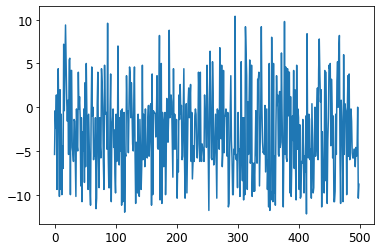

Iter: 2201, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: -3.3
Iter: 2202, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -3.2
Iter: 2203, curr rwd: -3.8, current losses: 2.5, mean rwd over last 100 trials: -3.2
Iter: 2204, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: -3.1
Iter: 2205, curr rwd: 5.4, current losses: 2.6, mean rwd over last 100 trials: -3.0
Iter: 2206, curr rwd: -6.0, current losses: 3.0, mean rwd over last 100 trials: -2.9
Iter: 2207, curr rwd: -4.6, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 2208, curr rwd: -4.8, current losses: 2.6, mean rwd over last 100 trials: -2.9
Iter: 2209, curr rwd: 3.4, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 2210, curr rwd: -5.0, current losses: 2.9, mean rwd over last 100 trials: -2.8
Iter: 2211, curr rwd: 0.2, current losses: 2.8, mean rwd over last 100 trials: -2.8
Iter: 2212, curr rwd: 1.0, current losses: 2.6, mean rwd over last 10

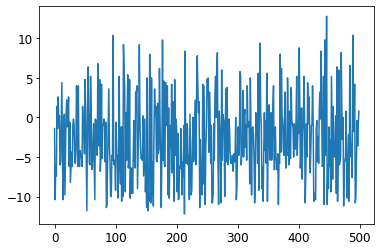

Iter: 2401, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: -2.6
Iter: 2402, curr rwd: -4.4, current losses: 2.6, mean rwd over last 100 trials: -2.6
Iter: 2403, curr rwd: -6.8, current losses: 2.9, mean rwd over last 100 trials: -2.7
Iter: 2404, curr rwd: -8.6, current losses: 2.7, mean rwd over last 100 trials: -2.7
Iter: 2405, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: -2.7
Iter: 2406, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: -2.7
Iter: 2407, curr rwd: -2.8, current losses: 2.8, mean rwd over last 100 trials: -2.6
Iter: 2408, curr rwd: -7.6, current losses: 3.0, mean rwd over last 100 trials: -2.6
Iter: 2409, curr rwd: -5.8, current losses: 2.6, mean rwd over last 100 trials: -2.7
Iter: 2410, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: -2.8
Iter: 2411, curr rwd: 8.0, current losses: 2.5, mean rwd over last 100 trials: -2.8
Iter: 2412, curr rwd: -1.2, current losses: 2.6, mean rwd over last 

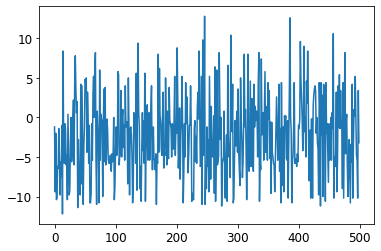

Iter: 2601, curr rwd: -6.6, current losses: 3.1, mean rwd over last 100 trials: -1.6
Iter: 2602, curr rwd: -4.8, current losses: 2.5, mean rwd over last 100 trials: -1.7
Iter: 2603, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 2604, curr rwd: -3.6, current losses: 2.6, mean rwd over last 100 trials: -1.8
Iter: 2605, curr rwd: -8.8, current losses: 2.8, mean rwd over last 100 trials: -1.9
Iter: 2606, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 2607, curr rwd: -5.0, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 2608, curr rwd: 2.0, current losses: 2.5, mean rwd over last 100 trials: -2.0
Iter: 2609, curr rwd: -2.4, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 2610, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: -2.1
Iter: 2611, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: -2.1
Iter: 2612, curr rwd: 0.2, current losses: 2.4, mean rwd over last 

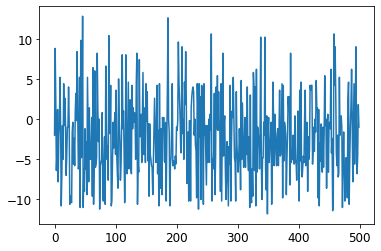

Iter: 2801, curr rwd: 5.2, current losses: 2.7, mean rwd over last 100 trials: -2.1
Iter: 2802, curr rwd: 4.2, current losses: 2.3, mean rwd over last 100 trials: -2.0
Iter: 2803, curr rwd: -6.6, current losses: 3.0, mean rwd over last 100 trials: -2.0
Iter: 2804, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 2805, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -2.1
Iter: 2806, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: -2.0
Iter: 2807, curr rwd: -5.4, current losses: 3.1, mean rwd over last 100 trials: -2.0
Iter: 2808, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 2809, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: -1.9
Iter: 2810, curr rwd: 4.4, current losses: 2.9, mean rwd over last 100 trials: -1.9
Iter: 2811, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: -1.9
Iter: 2812, curr rwd: -6.2, current losses: 2.5, mean rwd over last 1

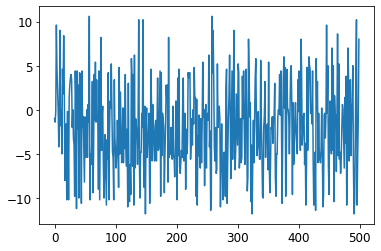

Iter: 3001, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 3002, curr rwd: -9.8, current losses: 2.8, mean rwd over last 100 trials: -1.8
Iter: 3003, curr rwd: -1.4, current losses: 2.9, mean rwd over last 100 trials: -1.9
Iter: 3004, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -1.9
Iter: 3005, curr rwd: -11.0, current losses: 2.9, mean rwd over last 100 trials: -2.0
Iter: 3006, curr rwd: -4.2, current losses: 2.9, mean rwd over last 100 trials: -2.1
Iter: 3007, curr rwd: -6.2, current losses: 2.9, mean rwd over last 100 trials: -2.1
Iter: 3008, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: -2.2
Iter: 3009, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: -2.1
Iter: 3010, curr rwd: -10.0, current losses: 3.0, mean rwd over last 100 trials: -2.1
Iter: 3011, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: -2.1
Iter: 3012, curr rwd: -0.4, current losses: 2.7, mean rwd over las

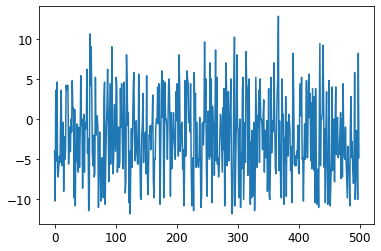

Iter: 3201, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: -2.9
Iter: 3202, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: -2.8
Iter: 3203, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: -2.9
Iter: 3204, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 3205, curr rwd: -9.6, current losses: 2.8, mean rwd over last 100 trials: -2.9
Iter: 3206, curr rwd: 0.8, current losses: 2.8, mean rwd over last 100 trials: -3.1
Iter: 3207, curr rwd: -6.0, current losses: 2.9, mean rwd over last 100 trials: -3.0
Iter: 3208, curr rwd: 0.4, current losses: 2.4, mean rwd over last 100 trials: -3.0
Iter: 3209, curr rwd: -0.2, current losses: 2.8, mean rwd over last 100 trials: -2.9
Iter: 3210, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: -2.9
Iter: 3211, curr rwd: -9.4, current losses: 2.7, mean rwd over last 100 trials: -2.9
Iter: 3212, curr rwd: 10.0, current losses: 2.4, mean rwd over last

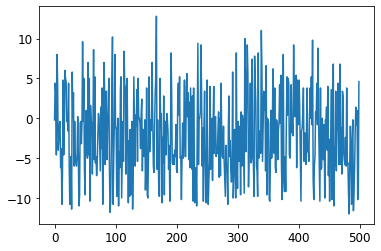

Iter: 3401, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: -2.7
Iter: 3402, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: -2.7
Iter: 3403, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: -2.7
Iter: 3404, curr rwd: -5.4, current losses: 2.9, mean rwd over last 100 trials: -2.6
Iter: 3405, curr rwd: -6.6, current losses: 2.8, mean rwd over last 100 trials: -2.6
Iter: 3406, curr rwd: 0.0, current losses: 2.9, mean rwd over last 100 trials: -2.6
Iter: 3407, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: -2.6
Iter: 3408, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: -2.7
Iter: 3409, curr rwd: -6.0, current losses: 2.9, mean rwd over last 100 trials: -2.7
Iter: 3410, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: -2.7
Iter: 3411, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: -2.7
Iter: 3412, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 

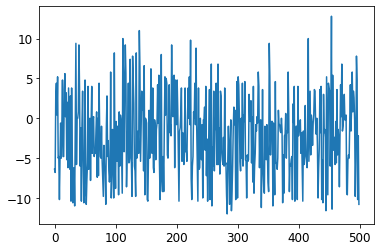

Iter: 3601, curr rwd: -6.0, current losses: 3.0, mean rwd over last 100 trials: -1.8
Iter: 3602, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: -1.9
Iter: 3603, curr rwd: -2.6, current losses: 2.8, mean rwd over last 100 trials: -1.8
Iter: 3604, curr rwd: -4.2, current losses: 2.5, mean rwd over last 100 trials: -1.9
Iter: 3605, curr rwd: -11.2, current losses: 2.8, mean rwd over last 100 trials: -1.9
Iter: 3606, curr rwd: 1.0, current losses: 2.5, mean rwd over last 100 trials: -1.9
Iter: 3607, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -1.9
Iter: 3608, curr rwd: 9.4, current losses: 2.3, mean rwd over last 100 trials: -1.8
Iter: 3609, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 3610, curr rwd: -10.0, current losses: 2.9, mean rwd over last 100 trials: -1.7
Iter: 3611, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: -1.7
Iter: 3612, curr rwd: -9.6, current losses: 2.7, mean rwd over last 

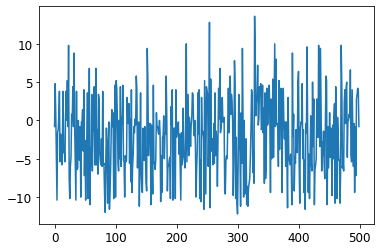

Iter: 3801, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 3802, curr rwd: -4.2, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 3803, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 3804, curr rwd: -4.6, current losses: 2.9, mean rwd over last 100 trials: -1.9
Iter: 3805, curr rwd: 0.2, current losses: 2.9, mean rwd over last 100 trials: -2.0
Iter: 3806, curr rwd: -6.0, current losses: 2.9, mean rwd over last 100 trials: -2.0
Iter: 3807, curr rwd: 4.2, current losses: 2.4, mean rwd over last 100 trials: -2.1
Iter: 3808, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: -2.0
Iter: 3809, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 3810, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: -1.9
Iter: 3811, curr rwd: 11.2, current losses: 2.4, mean rwd over last 100 trials: -1.8
Iter: 3812, curr rwd: -0.8, current losses: 2.6, mean rwd over last 

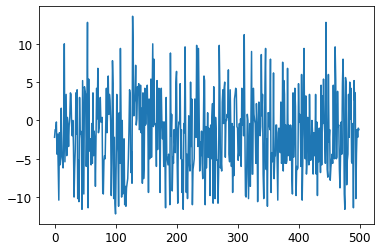

Iter: 4001, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 4002, curr rwd: -1.8, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 4003, curr rwd: -5.8, current losses: 3.0, mean rwd over last 100 trials: -1.6
Iter: 4004, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: -1.7
Iter: 4005, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 4006, curr rwd: -3.4, current losses: 2.7, mean rwd over last 100 trials: -1.7
Iter: 4007, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: -1.6
Iter: 4008, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 4009, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: -1.7
Iter: 4010, curr rwd: 13.6, current losses: 2.3, mean rwd over last 100 trials: -1.8
Iter: 4011, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: -1.7
Iter: 4012, curr rwd: -0.4, current losses: 2.6, mean rwd over las

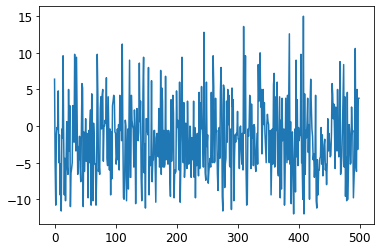

Iter: 4201, curr rwd: -9.8, current losses: 2.8, mean rwd over last 100 trials: -1.9
Iter: 4202, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 4203, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 4204, curr rwd: 3.0, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 4205, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: -2.1
Iter: 4206, curr rwd: -2.4, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 4207, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 4208, curr rwd: -0.8, current losses: 2.9, mean rwd over last 100 trials: -1.9
Iter: 4209, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 4210, curr rwd: -9.8, current losses: 2.9, mean rwd over last 100 trials: -1.9
Iter: 4211, curr rwd: 0.0, current losses: 2.8, mean rwd over last 100 trials: -2.1
Iter: 4212, curr rwd: -9.4, current losses: 3.0, mean rwd over last 10

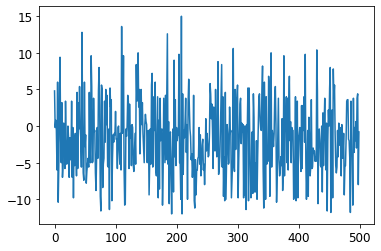

Iter: 4401, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: -2.1
Iter: 4402, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 4403, curr rwd: -6.2, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 4404, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 4405, curr rwd: 5.4, current losses: 2.4, mean rwd over last 100 trials: -1.9
Iter: 4406, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -1.9
Iter: 4407, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: -1.9
Iter: 4408, curr rwd: -10.6, current losses: 2.8, mean rwd over last 100 trials: -1.9
Iter: 4409, curr rwd: -2.4, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 4410, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: -2.1
Iter: 4411, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: -2.1
Iter: 4412, curr rwd: -2.8, current losses: 2.5, mean rwd over last 10

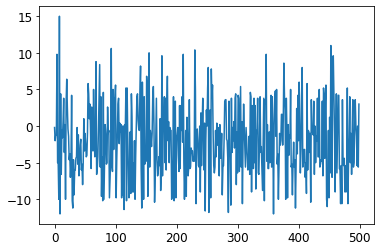

Iter: 4601, curr rwd: -6.6, current losses: 3.2, mean rwd over last 100 trials: -2.0
Iter: 4602, curr rwd: -6.2, current losses: 2.7, mean rwd over last 100 trials: -2.1
Iter: 4603, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: -2.1
Iter: 4604, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: -2.1
Iter: 4605, curr rwd: 0.0, current losses: 2.4, mean rwd over last 100 trials: -2.1
Iter: 4606, curr rwd: 9.0, current losses: 2.5, mean rwd over last 100 trials: -2.1
Iter: 4607, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: -2.1
Iter: 4608, curr rwd: 0.6, current losses: 2.5, mean rwd over last 100 trials: -2.0
Iter: 4609, curr rwd: -10.8, current losses: 2.9, mean rwd over last 100 trials: -2.0
Iter: 4610, curr rwd: -2.4, current losses: 2.5, mean rwd over last 100 trials: -2.1
Iter: 4611, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 4612, curr rwd: 2.6, current losses: 2.5, mean rwd over last 100

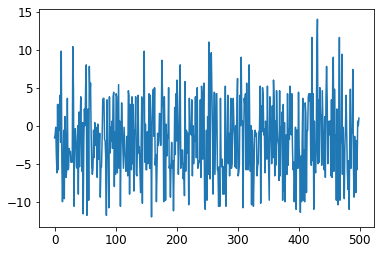

Iter: 4801, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 4802, curr rwd: -9.4, current losses: 2.8, mean rwd over last 100 trials: -1.5
Iter: 4803, curr rwd: 3.2, current losses: 2.4, mean rwd over last 100 trials: -1.5
Iter: 4804, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: -1.4
Iter: 4805, curr rwd: -1.8, current losses: 2.8, mean rwd over last 100 trials: -1.3
Iter: 4806, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -1.2
Iter: 4807, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: -1.2
Iter: 4808, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: -1.2
Iter: 4809, curr rwd: -6.2, current losses: 2.8, mean rwd over last 100 trials: -1.1
Iter: 4810, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -1.1
Iter: 4811, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: -1.0
Iter: 4812, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100

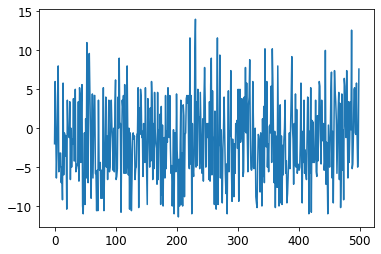

Iter: 5001, curr rwd: 5.0, current losses: 2.7, mean rwd over last 100 trials: -1.1
Iter: 5002, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 5003, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 5004, curr rwd: -5.2, current losses: 2.9, mean rwd over last 100 trials: -0.9
Iter: 5005, curr rwd: -5.8, current losses: 2.9, mean rwd over last 100 trials: -1.0
Iter: 5006, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: -1.0
Iter: 5007, curr rwd: -0.8, current losses: 2.8, mean rwd over last 100 trials: -0.9
Iter: 5008, curr rwd: -6.8, current losses: 3.0, mean rwd over last 100 trials: -0.9
Iter: 5009, curr rwd: 5.8, current losses: 2.4, mean rwd over last 100 trials: -1.0
Iter: 5010, curr rwd: -1.6, current losses: 2.8, mean rwd over last 100 trials: -0.9
Iter: 5011, curr rwd: -4.6, current losses: 2.9, mean rwd over last 100 trials: -0.9
Iter: 5012, curr rwd: 3.0, current losses: 2.4, mean rwd over last 

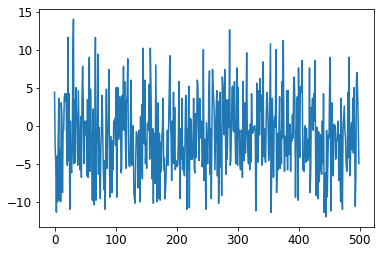

Iter: 5201, curr rwd: -9.6, current losses: 2.8, mean rwd over last 100 trials: -2.1
Iter: 5202, curr rwd: -10.0, current losses: 2.8, mean rwd over last 100 trials: -2.2
Iter: 5203, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: -2.2
Iter: 5204, curr rwd: 0.4, current losses: 2.4, mean rwd over last 100 trials: -2.3
Iter: 5205, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: -2.3
Iter: 5206, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: -2.3
Iter: 5207, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -2.4
Iter: 5208, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: -2.4
Iter: 5209, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: -2.3
Iter: 5210, curr rwd: -4.6, current losses: 2.9, mean rwd over last 100 trials: -2.3
Iter: 5211, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: -2.4
Iter: 5212, curr rwd: 6.0, current losses: 2.5, mean rwd over last 

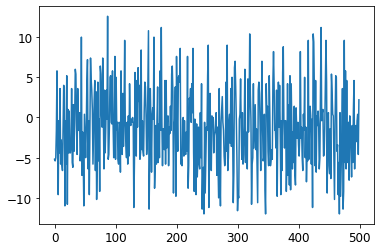

Iter: 5401, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 5402, curr rwd: -5.0, current losses: 2.9, mean rwd over last 100 trials: -1.5
Iter: 5403, curr rwd: -4.2, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 5404, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 5405, curr rwd: -4.2, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 5406, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: -1.6
Iter: 5407, curr rwd: -4.2, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 5408, curr rwd: -11.8, current losses: 2.9, mean rwd over last 100 trials: -1.6
Iter: 5409, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 5410, curr rwd: -3.2, current losses: 2.8, mean rwd over last 100 trials: -1.7
Iter: 5411, curr rwd: 2.2, current losses: 2.5, mean rwd over last 100 trials: -1.7
Iter: 5412, curr rwd: 2.8, current losses: 2.6, mean rwd over last 1

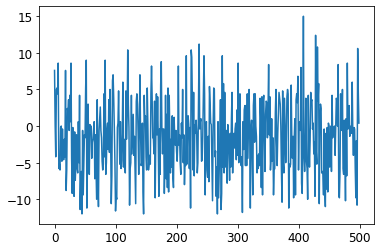

Iter: 5601, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: -1.5
Iter: 5602, curr rwd: 5.4, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 5603, curr rwd: -4.0, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 5604, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -1.5
Iter: 5605, curr rwd: -9.8, current losses: 2.9, mean rwd over last 100 trials: -1.6
Iter: 5606, curr rwd: -1.8, current losses: 2.9, mean rwd over last 100 trials: -1.6
Iter: 5607, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: -1.5
Iter: 5608, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: -1.5
Iter: 5609, curr rwd: -7.2, current losses: 2.8, mean rwd over last 100 trials: -1.6
Iter: 5610, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 5611, curr rwd: -0.8, current losses: 2.8, mean rwd over last 100 trials: -1.6
Iter: 5612, curr rwd: -5.0, current losses: 2.7, mean rwd over last 

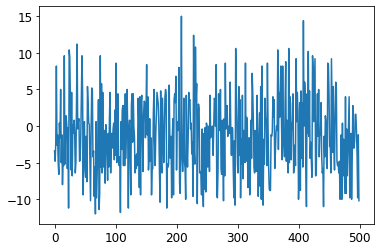

Iter: 5801, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: -1.5
Iter: 5802, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: -1.5
Iter: 5803, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 5804, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 5805, curr rwd: 1.0, current losses: 2.8, mean rwd over last 100 trials: -1.7
Iter: 5806, curr rwd: 10.0, current losses: 2.4, mean rwd over last 100 trials: -1.6
Iter: 5807, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 5808, curr rwd: -10.6, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 5809, curr rwd: 5.8, current losses: 2.7, mean rwd over last 100 trials: -1.7
Iter: 5810, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: -1.7
Iter: 5811, curr rwd: -3.8, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 5812, curr rwd: -5.4, current losses: 2.6, mean rwd over last 

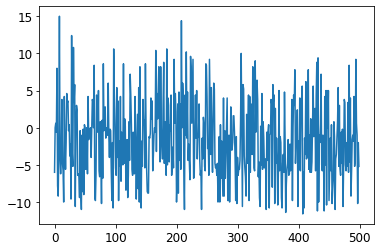

Iter: 6001, curr rwd: 1.4, current losses: 2.5, mean rwd over last 100 trials: -2.0
Iter: 6002, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: -1.9
Iter: 6003, curr rwd: -7.2, current losses: 2.9, mean rwd over last 100 trials: -2.0
Iter: 6004, curr rwd: -6.2, current losses: 2.8, mean rwd over last 100 trials: -2.0
Iter: 6005, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: -2.1
Iter: 6006, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -2.1
Iter: 6007, curr rwd: 3.8, current losses: 2.7, mean rwd over last 100 trials: -2.2
Iter: 6008, curr rwd: 1.0, current losses: 2.9, mean rwd over last 100 trials: -2.1
Iter: 6009, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 6010, curr rwd: -2.0, current losses: 2.9, mean rwd over last 100 trials: -2.0
Iter: 6011, curr rwd: -6.4, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 6012, curr rwd: -1.8, current losses: 3.0, mean rwd over last 

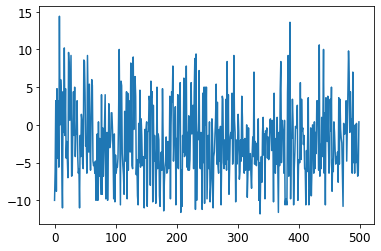

Iter: 6201, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: -2.0
Iter: 6202, curr rwd: -10.0, current losses: 2.6, mean rwd over last 100 trials: -1.9
Iter: 6203, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 6204, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: -2.1
Iter: 6205, curr rwd: -0.8, current losses: 3.0, mean rwd over last 100 trials: -2.0
Iter: 6206, curr rwd: -2.2, current losses: 2.7, mean rwd over last 100 trials: -2.1
Iter: 6207, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -2.1
Iter: 6208, curr rwd: 4.8, current losses: 2.4, mean rwd over last 100 trials: -2.1
Iter: 6209, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: -2.0
Iter: 6210, curr rwd: 8.8, current losses: 2.6, mean rwd over last 100 trials: -2.0
Iter: 6211, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: -1.9
Iter: 6212, curr rwd: 0.8, current losses: 2.6, mean rwd over last 10

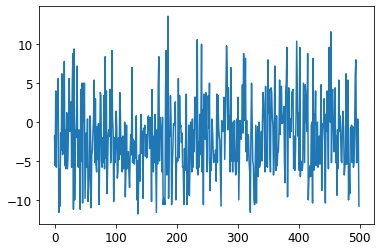

Iter: 6401, curr rwd: 5.2, current losses: 2.4, mean rwd over last 100 trials: -1.7
Iter: 6402, curr rwd: 0.8, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 6403, curr rwd: -1.2, current losses: 2.9, mean rwd over last 100 trials: -1.7
Iter: 6404, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 6405, curr rwd: -4.2, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 6406, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 6407, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 6408, curr rwd: 5.2, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 6409, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 6410, curr rwd: -2.4, current losses: 2.8, mean rwd over last 100 trials: -1.4
Iter: 6411, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -1.4
Iter: 6412, curr rwd: 0.8, current losses: 2.7, mean rwd over last 10

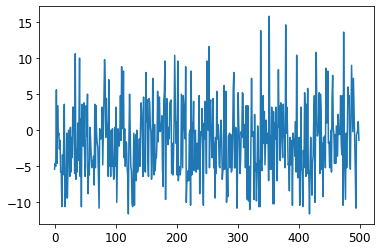

Iter: 6601, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: -1.1
Iter: 6602, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: -1.1
Iter: 6603, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -1.0
Iter: 6604, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -1.0
Iter: 6605, curr rwd: 5.0, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 6606, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 6607, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 6608, curr rwd: -4.8, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 6609, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 6610, curr rwd: 0.4, current losses: 2.8, mean rwd over last 100 trials: -0.8
Iter: 6611, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: -0.8
Iter: 6612, curr rwd: 4.0, current losses: 2.5, mean rwd over last 1

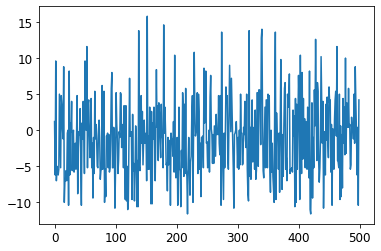

Iter: 6801, curr rwd: -1.2, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 6802, curr rwd: -10.6, current losses: 2.9, mean rwd over last 100 trials: -0.4
Iter: 6803, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 6804, curr rwd: -10.4, current losses: 2.9, mean rwd over last 100 trials: -0.5
Iter: 6805, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -0.6
Iter: 6806, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: -0.6
Iter: 6807, curr rwd: -10.4, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 6808, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 6809, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 6810, curr rwd: -2.8, current losses: 2.6, mean rwd over last 100 trials: -0.8
Iter: 6811, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 6812, curr rwd: 3.6, current losses: 2.6, mean rwd over last

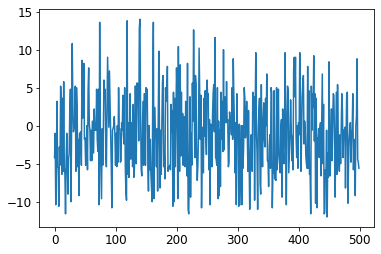

Iter: 7001, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: -1.4
Iter: 7002, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: -1.5
Iter: 7003, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 7004, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 7005, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 7006, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 7007, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: -1.5
Iter: 7008, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: -1.6
Iter: 7009, curr rwd: -3.4, current losses: 2.7, mean rwd over last 100 trials: -1.7
Iter: 7010, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: -1.7
Iter: 7011, curr rwd: -4.2, current losses: 3.0, mean rwd over last 100 trials: -1.7
Iter: 7012, curr rwd: -7.2, current losses: 2.7, mean rwd over last 1

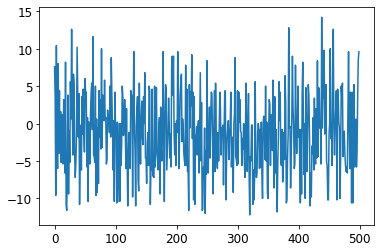

Iter: 7201, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 7202, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: -0.7
Iter: 7203, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -0.6
Iter: 7204, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 7205, curr rwd: -9.4, current losses: 3.2, mean rwd over last 100 trials: -0.5
Iter: 7206, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 7207, curr rwd: -1.4, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 7208, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 7209, curr rwd: 1.6, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 7210, curr rwd: 3.0, current losses: 2.5, mean rwd over last 100 trials: -0.6
Iter: 7211, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 7212, curr rwd: -1.4, current losses: 2.6, mean rwd over last 10

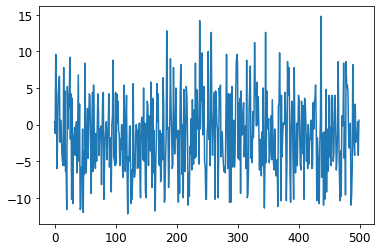

Iter: 7401, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: -1.6
Iter: 7402, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: -1.7
Iter: 7403, curr rwd: 5.6, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 7404, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 7405, curr rwd: -4.2, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 7406, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 7407, curr rwd: 3.0, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 7408, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 7409, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: -1.6
Iter: 7410, curr rwd: -5.6, current losses: 2.9, mean rwd over last 100 trials: -1.6
Iter: 7411, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -1.7
Iter: 7412, curr rwd: 3.6, current losses: 2.5, mean rwd over last 10

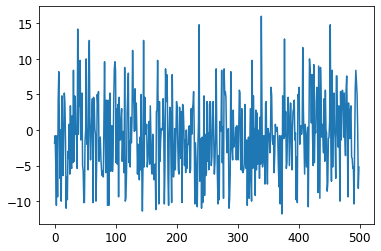

Iter: 7601, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 7602, curr rwd: -9.0, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 7603, curr rwd: 5.2, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 7604, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 7605, curr rwd: -6.6, current losses: 3.0, mean rwd over last 100 trials: 0.4
Iter: 7606, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 0.4
Iter: 7607, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 7608, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 7609, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 7610, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 7611, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 7612, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: 0.

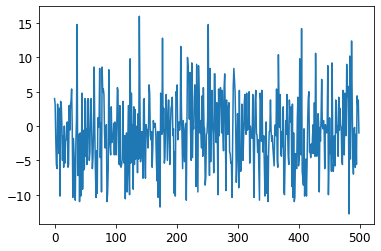

Iter: 7801, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 7802, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: -0.8
Iter: 7803, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: -0.9
Iter: 7804, curr rwd: 4.8, current losses: 2.7, mean rwd over last 100 trials: -0.9
Iter: 7805, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 7806, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 7807, curr rwd: -2.6, current losses: 3.1, mean rwd over last 100 trials: -0.8
Iter: 7808, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 7809, curr rwd: -6.8, current losses: 2.9, mean rwd over last 100 trials: -0.8
Iter: 7810, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 7811, curr rwd: -0.8, current losses: 3.1, mean rwd over last 100 trials: -0.7
Iter: 7812, curr rwd: -8.4, current losses: 2.8, mean rwd over last 1

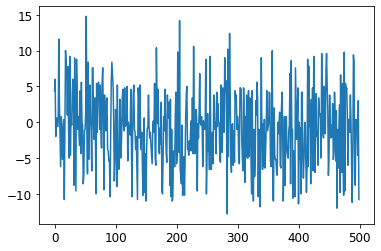

Iter: 8001, curr rwd: 9.0, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 8002, curr rwd: -2.2, current losses: 2.7, mean rwd over last 100 trials: -0.9
Iter: 8003, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 8004, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 8005, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: -0.8
Iter: 8006, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 8007, curr rwd: -3.4, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 8008, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 8009, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 8010, curr rwd: -0.4, current losses: 2.8, mean rwd over last 100 trials: -0.8
Iter: 8011, curr rwd: 7.2, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 8012, curr rwd: -6.0, current losses: 2.9, mean rwd over last 

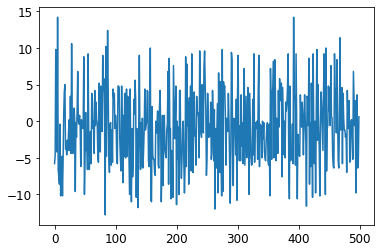

Iter: 8201, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 8202, curr rwd: -5.6, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 8203, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 8204, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 8205, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 8206, curr rwd: 5.6, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 8207, curr rwd: 13.8, current losses: 2.4, mean rwd over last 100 trials: -0.2
Iter: 8208, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 8209, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -0.1
Iter: 8210, curr rwd: 6.8, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 8211, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 8212, curr rwd: -0.2, current losses: 2.4, mean rwd over last 

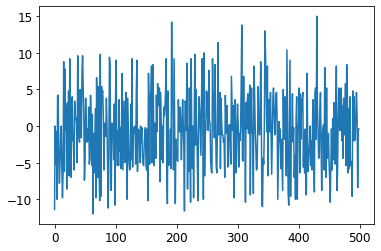

Iter: 8401, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 8402, curr rwd: -3.4, current losses: 2.9, mean rwd over last 100 trials: -1.1
Iter: 8403, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -1.1
Iter: 8404, curr rwd: 2.8, current losses: 2.6, mean rwd over last 100 trials: -1.2
Iter: 8405, curr rwd: 7.6, current losses: 2.5, mean rwd over last 100 trials: -1.1
Iter: 8406, curr rwd: 3.2, current losses: 2.4, mean rwd over last 100 trials: -1.1
Iter: 8407, curr rwd: -8.4, current losses: 2.7, mean rwd over last 100 trials: -1.1
Iter: 8408, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: -1.2
Iter: 8409, curr rwd: -4.0, current losses: 2.8, mean rwd over last 100 trials: -1.2
Iter: 8410, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: -1.2
Iter: 8411, curr rwd: -9.2, current losses: 2.7, mean rwd over last 100 trials: -1.2
Iter: 8412, curr rwd: -0.6, current losses: 2.8, mean rwd over last 1

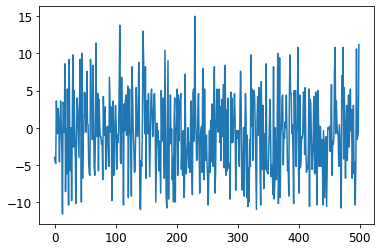

Iter: 8601, curr rwd: -0.4, current losses: 2.8, mean rwd over last 100 trials: -1.0
Iter: 8602, curr rwd: -11.2, current losses: 2.8, mean rwd over last 100 trials: -0.9
Iter: 8603, curr rwd: -9.2, current losses: 2.7, mean rwd over last 100 trials: -1.1
Iter: 8604, curr rwd: 0.2, current losses: 2.8, mean rwd over last 100 trials: -1.1
Iter: 8605, curr rwd: -6.2, current losses: 2.5, mean rwd over last 100 trials: -1.1
Iter: 8606, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: -1.1
Iter: 8607, curr rwd: -5.0, current losses: 2.7, mean rwd over last 100 trials: -1.1
Iter: 8608, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: -1.1
Iter: 8609, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: -1.1
Iter: 8610, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: -1.2
Iter: 8611, curr rwd: -4.6, current losses: 2.9, mean rwd over last 100 trials: -1.2
Iter: 8612, curr rwd: -6.2, current losses: 2.8, mean rwd over last 

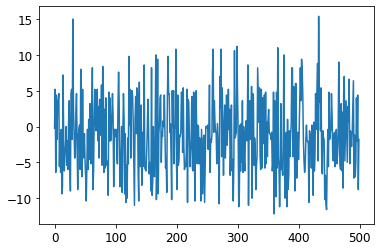

Iter: 8801, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 8802, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: -1.1
Iter: 8803, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: -1.1
Iter: 8804, curr rwd: -4.8, current losses: 2.5, mean rwd over last 100 trials: -1.2
Iter: 8805, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -1.3
Iter: 8806, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: -1.5
Iter: 8807, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 8808, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 8809, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: -1.7
Iter: 8810, curr rwd: -1.6, current losses: 2.8, mean rwd over last 100 trials: -1.7
Iter: 8811, curr rwd: 1.0, current losses: 2.5, mean rwd over last 100 trials: -1.7
Iter: 8812, curr rwd: 2.0, current losses: 2.5, mean rwd over last

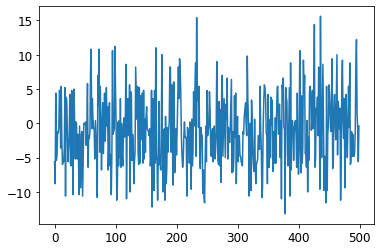

Iter: 9001, curr rwd: -4.8, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 9002, curr rwd: -3.6, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 9003, curr rwd: -6.2, current losses: 3.0, mean rwd over last 100 trials: 0.0
Iter: 9004, curr rwd: -1.0, current losses: 2.9, mean rwd over last 100 trials: -0.0
Iter: 9005, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 9006, curr rwd: -11.4, current losses: 2.9, mean rwd over last 100 trials: 0.0
Iter: 9007, curr rwd: -10.6, current losses: 2.9, mean rwd over last 100 trials: -0.0
Iter: 9008, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: -0.1
Iter: 9009, curr rwd: -9.4, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 9010, curr rwd: 9.0, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 9011, curr rwd: 2.2, current losses: 2.7, mean rwd over last 100 trials: -0.4
Iter: 9012, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 

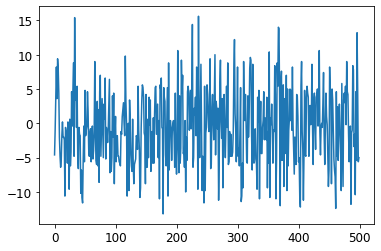

Iter: 9201, curr rwd: -6.8, current losses: 2.9, mean rwd over last 100 trials: -0.3
Iter: 9202, curr rwd: -5.8, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 9203, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 9204, curr rwd: 5.8, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 9205, curr rwd: 7.6, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 9206, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 9207, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 9208, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 9209, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 9210, curr rwd: 8.2, current losses: 2.4, mean rwd over last 100 trials: -0.1
Iter: 9211, curr rwd: 9.2, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 9212, curr rwd: -2.2, current losses: 2.8, mean rwd over last 1

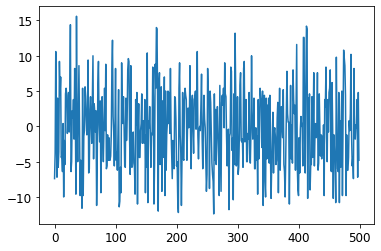

Iter: 9401, curr rwd: 5.0, current losses: 2.4, mean rwd over last 100 trials: -0.3
Iter: 9402, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 9403, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 9404, curr rwd: -6.8, current losses: 3.0, mean rwd over last 100 trials: -0.1
Iter: 9405, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 9406, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 9407, curr rwd: 1.8, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 9408, curr rwd: 8.4, current losses: 2.4, mean rwd over last 100 trials: -0.1
Iter: 9409, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 9410, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 9411, curr rwd: -6.2, current losses: 2.9, mean rwd over last 100 trials: -0.3
Iter: 9412, curr rwd: -10.4, current losses: 2.8, mean rwd over last 1

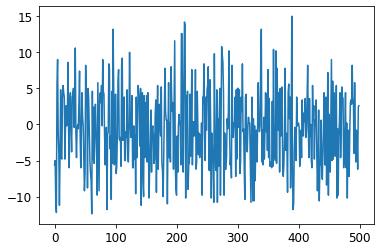

Iter: 9601, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -0.9
Iter: 9602, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 9603, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: -0.9
Iter: 9604, curr rwd: -2.0, current losses: 2.9, mean rwd over last 100 trials: -0.9
Iter: 9605, curr rwd: -1.6, current losses: 2.9, mean rwd over last 100 trials: -0.9
Iter: 9606, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 9607, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 9608, curr rwd: 4.6, current losses: 2.4, mean rwd over last 100 trials: -0.8
Iter: 9609, curr rwd: 2.8, current losses: 2.8, mean rwd over last 100 trials: -0.7
Iter: 9610, curr rwd: -9.8, current losses: 2.9, mean rwd over last 100 trials: -0.7
Iter: 9611, curr rwd: 4.8, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 9612, curr rwd: -5.2, current losses: 2.7, mean rwd over last 10

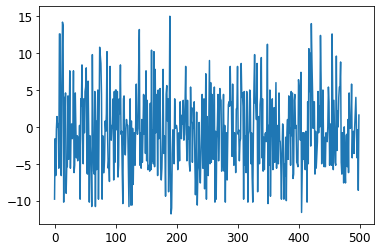

Iter: 9801, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 9802, curr rwd: 2.4, current losses: 2.8, mean rwd over last 100 trials: 0.0
Iter: 9803, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 0.0
Iter: 9804, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 0.0
Iter: 9805, curr rwd: 0.6, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 9806, curr rwd: -0.2, current losses: 3.0, mean rwd over last 100 trials: 0.1
Iter: 9807, curr rwd: 1.2, current losses: 3.0, mean rwd over last 100 trials: 0.1
Iter: 9808, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 9809, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 9810, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 9811, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 9812, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 0

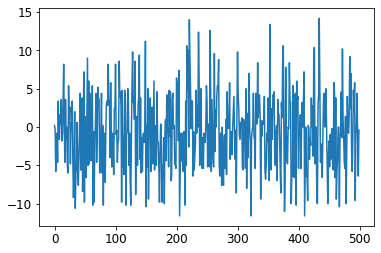

Iter: 10001, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 10002, curr rwd: -6.6, current losses: 2.6, mean rwd over last 100 trials: -0.8
Iter: 10003, curr rwd: 7.6, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 10004, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 10005, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 10006, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: -0.7
Iter: 10007, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 10008, curr rwd: -10.2, current losses: 2.9, mean rwd over last 100 trials: -0.8
Iter: 10009, curr rwd: 2.0, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 10010, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 10011, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 10012, curr rwd: -0.8, current losses: 2.7, mean rwd 

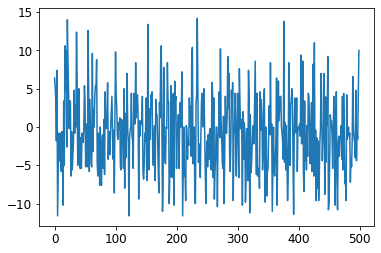

Iter: 10201, curr rwd: -10.4, current losses: 2.9, mean rwd over last 100 trials: -1.3
Iter: 10202, curr rwd: -6.0, current losses: 3.0, mean rwd over last 100 trials: -1.4
Iter: 10203, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: -1.4
Iter: 10204, curr rwd: -4.0, current losses: 2.7, mean rwd over last 100 trials: -1.4
Iter: 10205, curr rwd: -3.2, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 10206, curr rwd: -9.4, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 10207, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: -1.6
Iter: 10208, curr rwd: 9.0, current losses: 2.3, mean rwd over last 100 trials: -1.8
Iter: 10209, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: -1.6
Iter: 10210, curr rwd: -3.8, current losses: 2.7, mean rwd over last 100 trials: -1.6
Iter: 10211, curr rwd: 0.6, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 10212, curr rwd: -1.0, current losses: 2.7, mean r

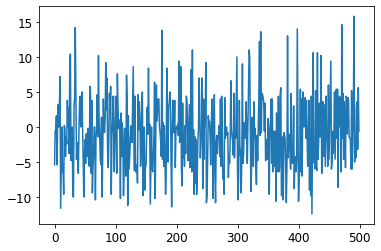

Iter: 10401, curr rwd: 0.0, current losses: 2.8, mean rwd over last 100 trials: -0.2
Iter: 10402, curr rwd: 7.4, current losses: 2.4, mean rwd over last 100 trials: -0.1
Iter: 10403, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 10404, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: -0.0
Iter: 10405, curr rwd: -9.8, current losses: 2.9, mean rwd over last 100 trials: -0.0
Iter: 10406, curr rwd: 4.2, current losses: 2.3, mean rwd over last 100 trials: -0.2
Iter: 10407, curr rwd: -1.0, current losses: 2.8, mean rwd over last 100 trials: -0.1
Iter: 10408, curr rwd: -0.8, current losses: 2.9, mean rwd over last 100 trials: -0.1
Iter: 10409, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 10410, curr rwd: -0.2, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 10411, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 10412, curr rwd: -0.6, current losses: 2.5, mean rwd 

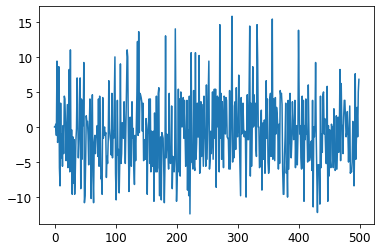

Iter: 10601, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -1.4
Iter: 10602, curr rwd: 6.4, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 10603, curr rwd: -4.8, current losses: 2.5, mean rwd over last 100 trials: -1.5
Iter: 10604, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 10605, curr rwd: -7.0, current losses: 3.0, mean rwd over last 100 trials: -1.5
Iter: 10606, curr rwd: 5.0, current losses: 2.4, mean rwd over last 100 trials: -1.5
Iter: 10607, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: -1.5
Iter: 10608, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 trials: -1.4
Iter: 10609, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 10610, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: -1.4
Iter: 10611, curr rwd: 9.6, current losses: 2.4, mean rwd over last 100 trials: -1.4
Iter: 10612, curr rwd: -3.4, current losses: 2.7, mean rwd

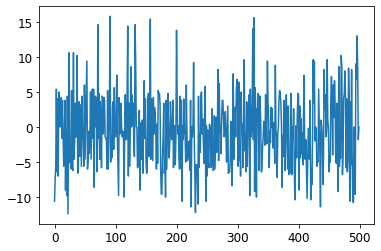

Iter: 10801, curr rwd: -4.8, current losses: 2.9, mean rwd over last 100 trials: -0.6
Iter: 10802, curr rwd: 1.8, current losses: 2.5, mean rwd over last 100 trials: -0.6
Iter: 10803, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -0.6
Iter: 10804, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 10805, curr rwd: 5.2, current losses: 2.4, mean rwd over last 100 trials: -0.7
Iter: 10806, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: -0.6
Iter: 10807, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 10808, curr rwd: 4.6, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 10809, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 10810, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 10811, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 10812, curr rwd: -6.2, current losses: 2.5, mean rwd o

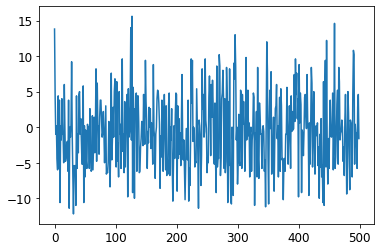

Iter: 11001, curr rwd: 9.4, current losses: 2.4, mean rwd over last 100 trials: -0.4
Iter: 11002, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 11003, curr rwd: 0.4, current losses: 2.9, mean rwd over last 100 trials: -0.4
Iter: 11004, curr rwd: -2.4, current losses: 2.7, mean rwd over last 100 trials: -0.4
Iter: 11005, curr rwd: -10.8, current losses: 2.9, mean rwd over last 100 trials: -0.5
Iter: 11006, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 11007, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 11008, curr rwd: -4.4, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 11009, curr rwd: -6.2, current losses: 2.9, mean rwd over last 100 trials: -0.4
Iter: 11010, curr rwd: 5.6, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 11011, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 11012, curr rwd: 6.6, current losses: 2.4, mean rwd o

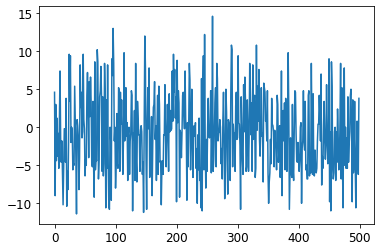

Iter: 11201, curr rwd: -0.2, current losses: 2.4, mean rwd over last 100 trials: -1.8
Iter: 11202, curr rwd: 8.0, current losses: 2.5, mean rwd over last 100 trials: -1.7
Iter: 11203, curr rwd: 8.0, current losses: 2.5, mean rwd over last 100 trials: -1.6
Iter: 11204, curr rwd: -0.6, current losses: 3.1, mean rwd over last 100 trials: -1.5
Iter: 11205, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: -1.5
Iter: 11206, curr rwd: 3.4, current losses: 2.4, mean rwd over last 100 trials: -1.5
Iter: 11207, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: -1.4
Iter: 11208, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: -1.4
Iter: 11209, curr rwd: 2.6, current losses: 2.6, mean rwd over last 100 trials: -1.4
Iter: 11210, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: -1.4
Iter: 11211, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: -1.4
Iter: 11212, curr rwd: -2.6, current losses: 3.0, mean rwd 

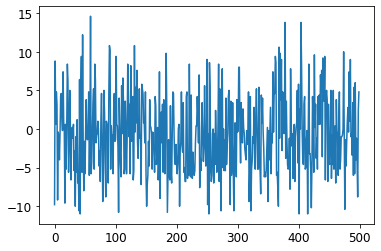

Iter: 11401, curr rwd: -3.8, current losses: 2.7, mean rwd over last 100 trials: -0.0
Iter: 11402, curr rwd: 3.0, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 11403, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 11404, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 11405, curr rwd: 6.4, current losses: 2.4, mean rwd over last 100 trials: -0.1
Iter: 11406, curr rwd: -10.0, current losses: 2.9, mean rwd over last 100 trials: -0.1
Iter: 11407, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -0.2
Iter: 11408, curr rwd: 7.8, current losses: 2.4, mean rwd over last 100 trials: -0.2
Iter: 11409, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 11410, curr rwd: 4.6, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 11411, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 11412, curr rwd: -9.4, current losses: 2.6, mean rwd ove

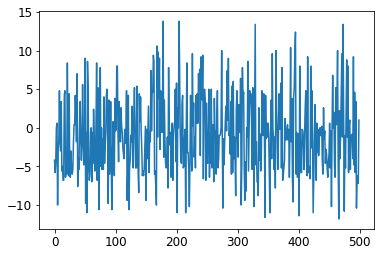

Iter: 11601, curr rwd: 12.4, current losses: 2.6, mean rwd over last 100 trials: -1.3
Iter: 11602, curr rwd: -4.4, current losses: 2.5, mean rwd over last 100 trials: -1.1
Iter: 11603, curr rwd: -1.0, current losses: 2.9, mean rwd over last 100 trials: -1.2
Iter: 11604, curr rwd: 11.6, current losses: 2.4, mean rwd over last 100 trials: -1.2
Iter: 11605, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: -1.0
Iter: 11606, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 11607, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 11608, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 11609, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: -0.9
Iter: 11610, curr rwd: -6.4, current losses: 3.0, mean rwd over last 100 trials: -1.0
Iter: 11611, curr rwd: -11.4, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 11612, curr rwd: -1.2, current losses: 2.8, mean 

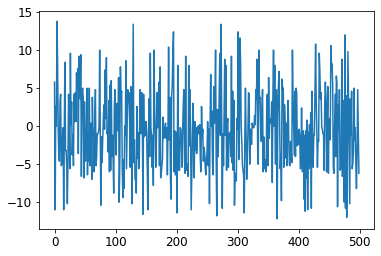

Iter: 11801, curr rwd: -5.8, current losses: 3.0, mean rwd over last 100 trials: -0.8
Iter: 11802, curr rwd: 6.0, current losses: 2.6, mean rwd over last 100 trials: -0.8
Iter: 11803, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: -0.8
Iter: 11804, curr rwd: -11.0, current losses: 3.2, mean rwd over last 100 trials: -0.7
Iter: 11805, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 11806, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 11807, curr rwd: -7.2, current losses: 2.9, mean rwd over last 100 trials: -0.8
Iter: 11808, curr rwd: 2.6, current losses: 2.6, mean rwd over last 100 trials: -0.8
Iter: 11809, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 11810, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 11811, curr rwd: 5.8, current losses: 2.4, mean rwd over last 100 trials: -0.7
Iter: 11812, curr rwd: -10.4, current losses: 2.9, mean rw

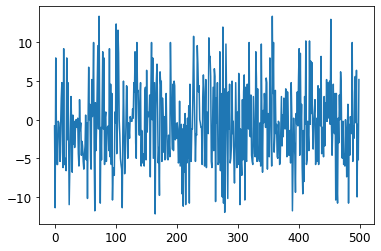

Iter: 12001, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 12002, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 12003, curr rwd: 7.8, current losses: 2.4, mean rwd over last 100 trials: -0.3
Iter: 12004, curr rwd: -2.4, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 12005, curr rwd: -9.4, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 12006, curr rwd: -1.8, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 12007, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 12008, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 12009, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 12010, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 12011, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 12012, curr rwd: -2.6, current losses: 2.6, mean rwd o

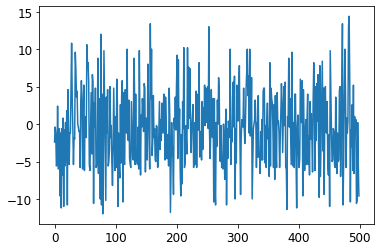

Iter: 12201, curr rwd: 12.8, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 12202, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 12203, curr rwd: -11.0, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 12204, curr rwd: -10.8, current losses: 2.9, mean rwd over last 100 trials: -0.7
Iter: 12205, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 12206, curr rwd: 4.8, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 12207, curr rwd: -0.2, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 12208, curr rwd: 5.4, current losses: 3.4, mean rwd over last 100 trials: -0.7
Iter: 12209, curr rwd: -8.6, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 12210, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: -0.8
Iter: 12211, curr rwd: 4.0, current losses: 2.7, mean rwd over last 100 trials: -0.6
Iter: 12212, curr rwd: 8.4, current losses: 2.4, mean rwd

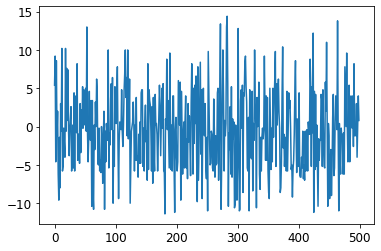

Iter: 12401, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -0.9
Iter: 12402, curr rwd: 5.6, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 12403, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: -0.9
Iter: 12404, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 12405, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 12406, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 12407, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 12408, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 12409, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 12410, curr rwd: -10.2, current losses: 2.8, mean rwd over last 100 trials: -0.6
Iter: 12411, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 12412, curr rwd: -3.4, current losses: 2.8, mean rw

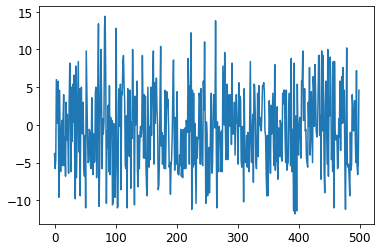

Iter: 12601, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 12602, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 12603, curr rwd: -1.6, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 12604, curr rwd: -0.6, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 12605, curr rwd: 2.6, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 12606, curr rwd: -6.4, current losses: 2.9, mean rwd over last 100 trials: 0.3
Iter: 12607, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 12608, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 12609, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 12610, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 12611, curr rwd: 15.4, current losses: 2.4, mean rwd over last 100 trials: -0.0
Iter: 12612, curr rwd: -7.6, current losses: 2.7, mean rwd over last

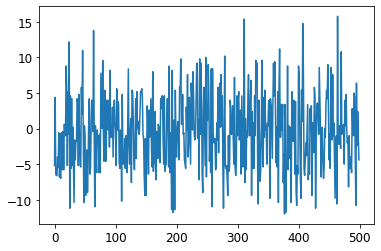

Iter: 12801, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 12802, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: -0.6
Iter: 12803, curr rwd: 9.6, current losses: 2.4, mean rwd over last 100 trials: -0.6
Iter: 12804, curr rwd: -4.6, current losses: 2.8, mean rwd over last 100 trials: -0.4
Iter: 12805, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 12806, curr rwd: -3.2, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 12807, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 12808, curr rwd: -7.8, current losses: 2.9, mean rwd over last 100 trials: -0.5
Iter: 12809, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: -0.7
Iter: 12810, curr rwd: 9.4, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 12811, curr rwd: 3.4, current losses: 2.4, mean rwd over last 100 trials: -0.4
Iter: 12812, curr rwd: 4.6, current losses: 2.7, mean rwd ove

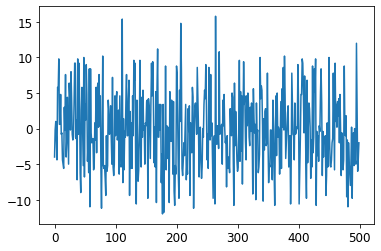

Iter: 13001, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 13002, curr rwd: -10.2, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 13003, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 13004, curr rwd: -1.6, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 13005, curr rwd: -9.2, current losses: 2.8, mean rwd over last 100 trials: -0.8
Iter: 13006, curr rwd: -0.2, current losses: 2.8, mean rwd over last 100 trials: -0.9
Iter: 13007, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: -1.0
Iter: 13008, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: -1.1
Iter: 13009, curr rwd: -6.8, current losses: 2.5, mean rwd over last 100 trials: -1.2
Iter: 13010, curr rwd: 2.6, current losses: 2.4, mean rwd over last 100 trials: -1.2
Iter: 13011, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: -1.3
Iter: 13012, curr rwd: -4.6, current losses: 2.8, mean r

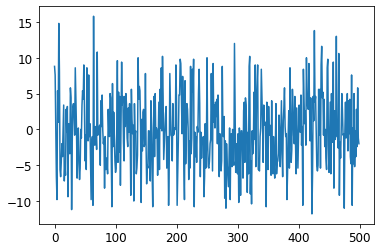

Iter: 13201, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 13202, curr rwd: -1.6, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 13203, curr rwd: 2.6, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 13204, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 13205, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 13206, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 13207, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 13208, curr rwd: 0.8, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 13209, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 13210, curr rwd: -9.0, current losses: 2.9, mean rwd over last 100 trials: 0.6
Iter: 13211, curr rwd: -6.2, current losses: 2.9, mean rwd over last 100 trials: 0.5
Iter: 13212, curr rwd: 0.6, current losses: 2.6, mean rwd over last 10

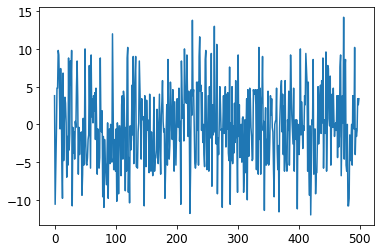

Iter: 13401, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 13402, curr rwd: 1.6, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 13403, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 13404, curr rwd: 9.2, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 13405, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 13406, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 13407, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 13408, curr rwd: -8.2, current losses: 2.9, mean rwd over last 100 trials: 0.2
Iter: 13409, curr rwd: -10.0, current losses: 3.0, mean rwd over last 100 trials: 0.1
Iter: 13410, curr rwd: 5.4, current losses: 2.4, mean rwd over last 100 trials: 0.0
Iter: 13411, curr rwd: 13.8, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 13412, curr rwd: -1.0, current losses: 2.8, mean rwd over last 

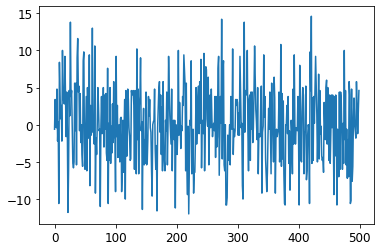

Iter: 13601, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 13602, curr rwd: -2.2, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 13603, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 13604, curr rwd: -0.4, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 13605, curr rwd: 10.0, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 13606, curr rwd: -12.0, current losses: 2.8, mean rwd over last 100 trials: -0.1
Iter: 13607, curr rwd: 5.4, current losses: 2.4, mean rwd over last 100 trials: -0.3
Iter: 13608, curr rwd: -10.6, current losses: 3.0, mean rwd over last 100 trials: -0.3
Iter: 13609, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 13610, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 13611, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 13612, curr rwd: -0.4, current losses: 2.5, mean r

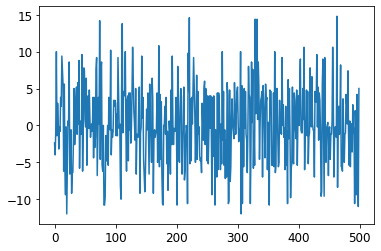

Iter: 13801, curr rwd: 2.8, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 13802, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 13803, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 13804, curr rwd: -3.6, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 13805, curr rwd: -9.0, current losses: 2.8, mean rwd over last 100 trials: -0.2
Iter: 13806, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 13807, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 13808, curr rwd: -5.0, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 13809, curr rwd: -10.2, current losses: 2.9, mean rwd over last 100 trials: -0.3
Iter: 13810, curr rwd: -7.4, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 13811, curr rwd: 7.6, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 13812, curr rwd: -1.8, current losses: 2.7, mean rwd 

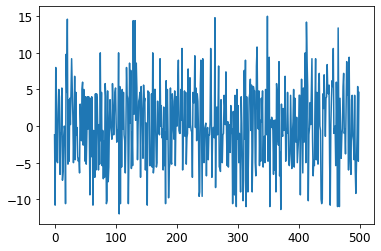

Iter: 14001, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 14002, curr rwd: -1.0, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 14003, curr rwd: 4.8, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 14004, curr rwd: -2.0, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 14005, curr rwd: 2.8, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 14006, curr rwd: 3.0, current losses: 2.9, mean rwd over last 100 trials: 0.6
Iter: 14007, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 14008, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 14009, curr rwd: -1.4, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 14010, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 14011, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 14012, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100

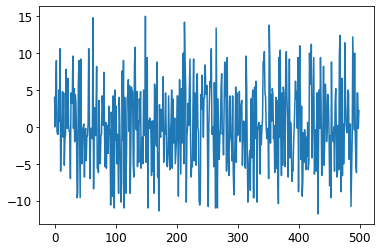

Iter: 14201, curr rwd: -3.6, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 14202, curr rwd: 5.0, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 14203, curr rwd: -5.0, current losses: 2.9, mean rwd over last 100 trials: 0.0
Iter: 14204, curr rwd: 7.4, current losses: 2.5, mean rwd over last 100 trials: -0.0
Iter: 14205, curr rwd: -0.2, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 14206, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 14207, curr rwd: 1.6, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 14208, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 14209, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 14210, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 14211, curr rwd: -6.0, current losses: 2.9, mean rwd over last 100 trials: 0.2
Iter: 14212, curr rwd: 4.2, current losses: 2.5, mean rwd over last 

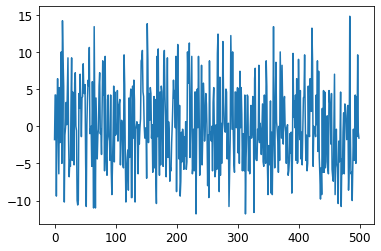

Iter: 14401, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: -1.0
Iter: 14402, curr rwd: 1.0, current losses: 2.4, mean rwd over last 100 trials: -1.1
Iter: 14403, curr rwd: -1.0, current losses: 2.8, mean rwd over last 100 trials: -1.0
Iter: 14404, curr rwd: 5.0, current losses: 2.4, mean rwd over last 100 trials: -1.1
Iter: 14405, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: -1.0
Iter: 14406, curr rwd: 2.4, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 14407, curr rwd: -6.4, current losses: 2.9, mean rwd over last 100 trials: -0.9
Iter: 14408, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 14409, curr rwd: -9.6, current losses: 2.5, mean rwd over last 100 trials: -1.1
Iter: 14410, curr rwd: 0.4, current losses: 2.8, mean rwd over last 100 trials: -1.2
Iter: 14411, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: -1.3
Iter: 14412, curr rwd: -0.4, current losses: 2.6, mean rwd 

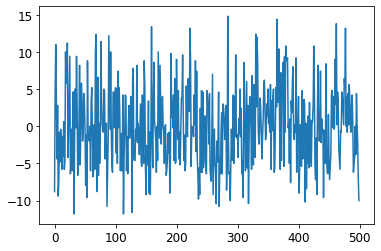

Iter: 14601, curr rwd: 2.2, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 14602, curr rwd: 2.4, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 14603, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 14604, curr rwd: 1.4, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 14605, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 14606, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 14607, curr rwd: 0.0, current losses: 2.8, mean rwd over last 100 trials: -0.0
Iter: 14608, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 0.0
Iter: 14609, curr rwd: -4.4, current losses: 2.9, mean rwd over last 100 trials: -0.0
Iter: 14610, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 14611, curr rwd: -1.2, current losses: 2.8, mean rwd over last 100 trials: -0.2
Iter: 14612, curr rwd: 0.0, current losses: 2.7, mean rwd ove

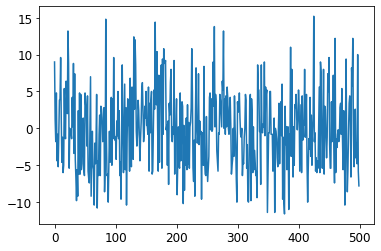

Iter: 14801, curr rwd: 2.8, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 14802, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 14803, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 14804, curr rwd: 0.2, current losses: 2.8, mean rwd over last 100 trials: -0.0
Iter: 14805, curr rwd: -6.2, current losses: 2.8, mean rwd over last 100 trials: -0.1
Iter: 14806, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 14807, curr rwd: -5.6, current losses: 3.0, mean rwd over last 100 trials: -0.1
Iter: 14808, curr rwd: -1.2, current losses: 2.8, mean rwd over last 100 trials: -0.2
Iter: 14809, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 14810, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 14811, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 14812, curr rwd: 1.0, current losses: 2.5, mean rwd o

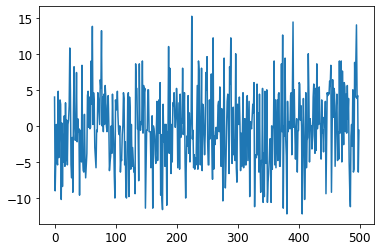

Iter: 15001, curr rwd: -1.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 15002, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 15003, curr rwd: 4.8, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 15004, curr rwd: -1.8, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 15005, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 15006, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 15007, curr rwd: 3.6, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 15008, curr rwd: 0.6, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 15009, curr rwd: -6.6, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 15010, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 15011, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 15012, curr rwd: 2.8, current losses: 2.8, mean rwd over last 100

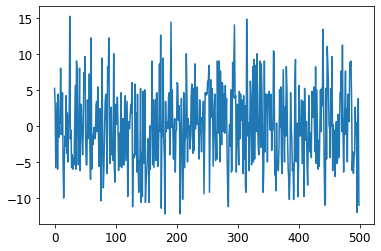

Iter: 15201, curr rwd: -4.8, current losses: 3.0, mean rwd over last 100 trials: -0.0
Iter: 15202, curr rwd: 0.4, current losses: 2.4, mean rwd over last 100 trials: -0.1
Iter: 15203, curr rwd: 1.6, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 15204, curr rwd: -5.0, current losses: 2.9, mean rwd over last 100 trials: -0.1
Iter: 15205, curr rwd: -0.2, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 15206, curr rwd: -9.4, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 15207, curr rwd: 8.6, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 15208, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 15209, curr rwd: -4.2, current losses: 2.9, mean rwd over last 100 trials: -0.1
Iter: 15210, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 15211, curr rwd: -7.6, current losses: 3.0, mean rwd over last 100 trials: -0.1
Iter: 15212, curr rwd: 8.4, current losses: 2.5, mean rwd o

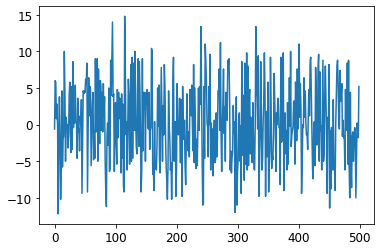

Iter: 15401, curr rwd: -6.2, current losses: 2.7, mean rwd over last 100 trials: -0.0
Iter: 15402, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 15403, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 15404, curr rwd: 8.4, current losses: 2.4, mean rwd over last 100 trials: -0.3
Iter: 15405, curr rwd: -6.2, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 15406, curr rwd: -11.4, current losses: 3.2, mean rwd over last 100 trials: -0.2
Iter: 15407, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 15408, curr rwd: -3.4, current losses: 2.8, mean rwd over last 100 trials: -0.2
Iter: 15409, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: -0.3
Iter: 15410, curr rwd: 9.6, current losses: 2.4, mean rwd over last 100 trials: -0.3
Iter: 15411, curr rwd: 0.4, current losses: 2.9, mean rwd over last 100 trials: -0.2
Iter: 15412, curr rwd: 4.8, current losses: 2.4, mean rwd

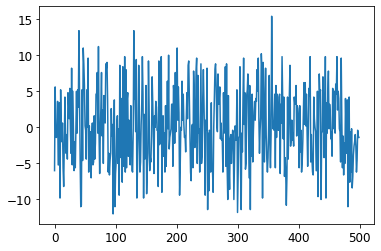

Iter: 15601, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 15602, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 15603, curr rwd: -7.0, current losses: 2.9, mean rwd over last 100 trials: -0.4
Iter: 15604, curr rwd: 5.0, current losses: 2.4, mean rwd over last 100 trials: -0.4
Iter: 15605, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 15606, curr rwd: -7.2, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 15607, curr rwd: -9.4, current losses: 2.9, mean rwd over last 100 trials: -0.3
Iter: 15608, curr rwd: -5.6, current losses: 2.9, mean rwd over last 100 trials: -0.4
Iter: 15609, curr rwd: -0.4, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 15610, curr rwd: 4.6, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 15611, curr rwd: 8.4, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 15612, curr rwd: -0.8, current losses: 2.5, mean rwd

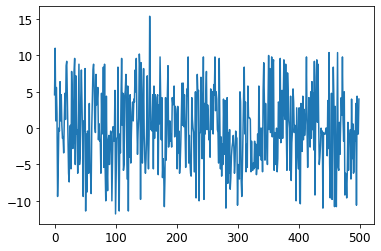

Iter: 15801, curr rwd: -3.8, current losses: 2.6, mean rwd over last 100 trials: -0.7
Iter: 15802, curr rwd: -9.8, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 15803, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: -0.7
Iter: 15804, curr rwd: -8.2, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 15805, curr rwd: -6.8, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 15806, curr rwd: -10.6, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 15807, curr rwd: 5.8, current losses: 2.4, mean rwd over last 100 trials: -0.9
Iter: 15808, curr rwd: -4.0, current losses: 2.7, mean rwd over last 100 trials: -0.9
Iter: 15809, curr rwd: -0.2, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 15810, curr rwd: -5.0, current losses: 2.5, mean rwd over last 100 trials: -0.9
Iter: 15811, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: -1.0
Iter: 15812, curr rwd: -5.2, current losses: 2.9, mean

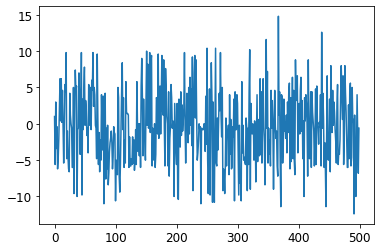

Iter: 16001, curr rwd: -3.8, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 16002, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 16003, curr rwd: -9.8, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 16004, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 16005, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 16006, curr rwd: -3.4, current losses: 2.8, mean rwd over last 100 trials: -0.8
Iter: 16007, curr rwd: 6.4, current losses: 2.7, mean rwd over last 100 trials: -0.8
Iter: 16008, curr rwd: 9.4, current losses: 2.4, mean rwd over last 100 trials: -0.7
Iter: 16009, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: -0.6
Iter: 16010, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 16011, curr rwd: -0.4, current losses: 2.8, mean rwd over last 100 trials: -0.6
Iter: 16012, curr rwd: -0.8, current losses: 2.5, mean rwd

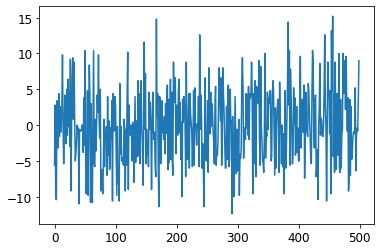

Iter: 16201, curr rwd: 9.2, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 16202, curr rwd: -2.4, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 16203, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 16204, curr rwd: 4.2, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 16205, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 16206, curr rwd: -2.6, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 16207, curr rwd: -4.6, current losses: 2.9, mean rwd over last 100 trials: 0.6
Iter: 16208, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 16209, curr rwd: 3.4, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 16210, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 16211, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 16212, curr rwd: -4.0, current losses: 2.6, mean rwd over last 

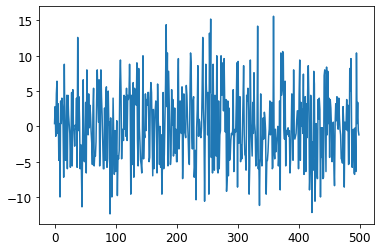

Iter: 16401, curr rwd: -6.8, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 16402, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: -0.4
Iter: 16403, curr rwd: -5.6, current losses: 3.0, mean rwd over last 100 trials: -0.5
Iter: 16404, curr rwd: -9.8, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 16405, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: -0.6
Iter: 16406, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 16407, curr rwd: -4.0, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 16408, curr rwd: -1.6, current losses: 2.9, mean rwd over last 100 trials: -0.6
Iter: 16409, curr rwd: -10.4, current losses: 2.6, mean rwd over last 100 trials: -0.7
Iter: 16410, curr rwd: 10.4, current losses: 2.4, mean rwd over last 100 trials: -0.7
Iter: 16411, curr rwd: 3.8, current losses: 2.4, mean rwd over last 100 trials: -0.6
Iter: 16412, curr rwd: 6.0, current losses: 2.4, mean rw

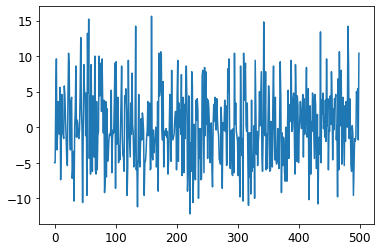

Iter: 16601, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 16602, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 16603, curr rwd: 3.6, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 16604, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 16605, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 16606, curr rwd: -6.4, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 16607, curr rwd: 7.2, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 16608, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 16609, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 16610, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 16611, curr rwd: 0.4, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 16612, curr rwd: -4.0, current losses: 2.9, mean rwd over last 1

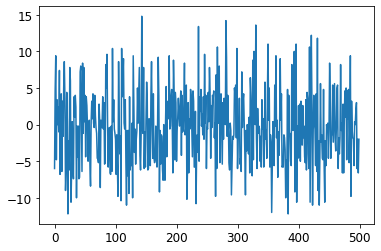

Iter: 16801, curr rwd: -11.0, current losses: 2.8, mean rwd over last 100 trials: -0.8
Iter: 16802, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: -0.8
Iter: 16803, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 16804, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 16805, curr rwd: 9.0, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 16806, curr rwd: -4.6, current losses: 3.0, mean rwd over last 100 trials: -0.7
Iter: 16807, curr rwd: 0.8, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 16808, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 16809, curr rwd: 15.0, current losses: 2.4, mean rwd over last 100 trials: -0.6
Iter: 16810, curr rwd: -9.0, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 16811, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 16812, curr rwd: -5.4, current losses: 2.9, mean rwd

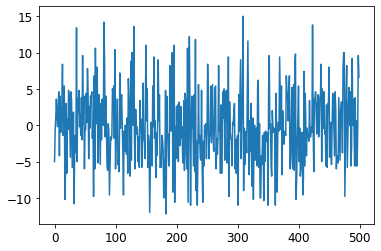

Iter: 17001, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 17002, curr rwd: 9.8, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 17003, curr rwd: -6.6, current losses: 2.8, mean rwd over last 100 trials: 0.4
Iter: 17004, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 17005, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 17006, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 17007, curr rwd: 2.8, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 17008, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 17009, curr rwd: 15.8, current losses: 2.3, mean rwd over last 100 trials: 0.7
Iter: 17010, curr rwd: 5.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 17011, curr rwd: -1.0, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 17012, curr rwd: 5.6, current losses: 2.6, mean rwd over last 10

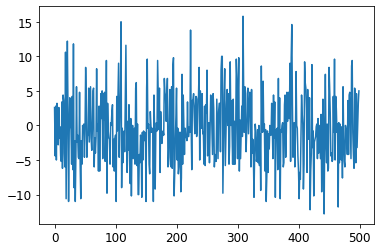

Iter: 17201, curr rwd: 8.6, current losses: 2.4, mean rwd over last 100 trials: -1.0
Iter: 17202, curr rwd: 1.0, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 17203, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 17204, curr rwd: -6.2, current losses: 3.2, mean rwd over last 100 trials: -0.5
Iter: 17205, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 17206, curr rwd: -2.2, current losses: 2.7, mean rwd over last 100 trials: -0.6
Iter: 17207, curr rwd: 4.0, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 17208, curr rwd: -1.6, current losses: 2.8, mean rwd over last 100 trials: -0.6
Iter: 17209, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 17210, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 17211, curr rwd: -2.2, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 17212, curr rwd: -0.4, current losses: 2.7, mean rwd o

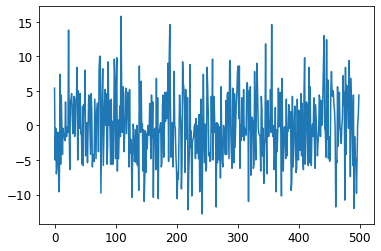

Iter: 17401, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 17402, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 17403, curr rwd: 1.4, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 17404, curr rwd: 9.6, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 17405, curr rwd: -1.6, current losses: 2.8, mean rwd over last 100 trials: 0.4
Iter: 17406, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 17407, curr rwd: -10.8, current losses: 2.9, mean rwd over last 100 trials: 0.4
Iter: 17408, curr rwd: 1.0, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 17409, curr rwd: 11.4, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 17410, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 17411, curr rwd: -4.8, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 17412, curr rwd: -4.2, current losses: 2.6, mean rwd over last

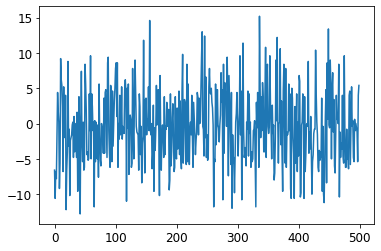

Iter: 17601, curr rwd: 14.6, current losses: 2.4, mean rwd over last 100 trials: -0.9
Iter: 17602, curr rwd: -1.2, current losses: 2.4, mean rwd over last 100 trials: -0.8
Iter: 17603, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: -0.9
Iter: 17604, curr rwd: 5.4, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 17605, curr rwd: 10.4, current losses: 2.4, mean rwd over last 100 trials: -0.6
Iter: 17606, curr rwd: -5.6, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 17607, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 17608, curr rwd: -9.6, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 17609, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 17610, curr rwd: 7.6, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 17611, curr rwd: 1.0, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 17612, curr rwd: -0.2, current losses: 2.7, mean rwd o

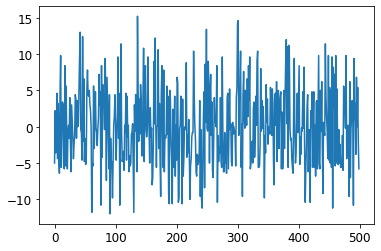

Iter: 17801, curr rwd: -1.4, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 17802, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 17803, curr rwd: 6.2, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 17804, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 17805, curr rwd: 3.4, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 17806, curr rwd: -5.0, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 17807, curr rwd: -3.0, current losses: 2.9, mean rwd over last 100 trials: -0.3
Iter: 17808, curr rwd: 9.6, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 17809, curr rwd: 13.6, current losses: 2.3, mean rwd over last 100 trials: -0.3
Iter: 17810, curr rwd: -2.4, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 17811, curr rwd: 4.2, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 17812, curr rwd: 3.0, current losses: 2.6, mean rwd 

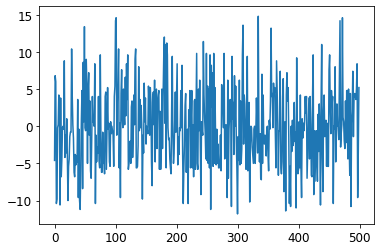

Iter: 18001, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 18002, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 18003, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 18004, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 18005, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 18006, curr rwd: 7.8, current losses: 2.3, mean rwd over last 100 trials: 0.2
Iter: 18007, curr rwd: -6.0, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 18008, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 18009, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 18010, curr rwd: 8.6, current losses: 2.3, mean rwd over last 100 trials: 0.3
Iter: 18011, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 18012, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100

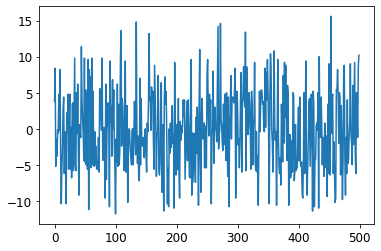

Iter: 18201, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 18202, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: -0.6
Iter: 18203, curr rwd: -6.6, current losses: 2.8, mean rwd over last 100 trials: -0.6
Iter: 18204, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 18205, curr rwd: 2.8, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 18206, curr rwd: 5.4, current losses: 2.3, mean rwd over last 100 trials: -0.5
Iter: 18207, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 18208, curr rwd: -6.4, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 18209, curr rwd: 10.0, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 18210, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 18211, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 18212, curr rwd: -6.2, current losses: 2.6, mean rwd 

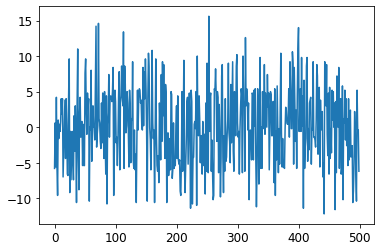

Iter: 18401, curr rwd: 4.0, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 18402, curr rwd: -4.6, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 18403, curr rwd: -7.0, current losses: 2.9, mean rwd over last 100 trials: -0.1
Iter: 18404, curr rwd: 1.6, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 18405, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 18406, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 18407, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 18408, curr rwd: -0.6, current losses: 2.4, mean rwd over last 100 trials: -0.4
Iter: 18409, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 18410, curr rwd: -3.6, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 18411, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 18412, curr rwd: -0.6, current losses: 2.7, mean rwd

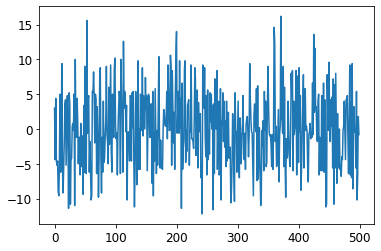

Iter: 18601, curr rwd: 9.0, current losses: 2.3, mean rwd over last 100 trials: -0.2
Iter: 18602, curr rwd: -5.4, current losses: 2.9, mean rwd over last 100 trials: -0.2
Iter: 18603, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 18604, curr rwd: 4.4, current losses: 2.3, mean rwd over last 100 trials: -0.3
Iter: 18605, curr rwd: -10.8, current losses: 2.9, mean rwd over last 100 trials: -0.2
Iter: 18606, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 18607, curr rwd: 2.6, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 18608, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 18609, curr rwd: -8.6, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 18610, curr rwd: -6.6, current losses: 3.1, mean rwd over last 100 trials: -0.3
Iter: 18611, curr rwd: -11.2, current losses: 3.2, mean rwd over last 100 trials: -0.4
Iter: 18612, curr rwd: -10.4, current losses: 2.8, mean 

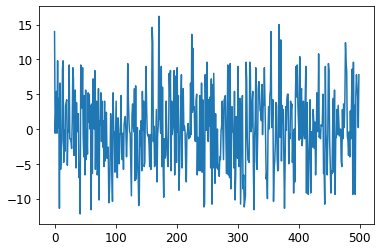

Iter: 18801, curr rwd: -5.6, current losses: 2.9, mean rwd over last 100 trials: 0.4
Iter: 18802, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 18803, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 18804, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 18805, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 18806, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 18807, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 18808, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 18809, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 18810, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 18811, curr rwd: -6.6, current losses: 2.8, mean rwd over last 100 trials: 0.2
Iter: 18812, curr rwd: 8.4, current losses: 2.4, mean rwd over last 1

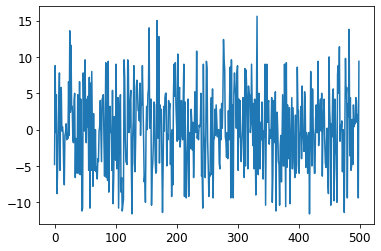

Iter: 19001, curr rwd: 8.6, current losses: 2.4, mean rwd over last 100 trials: -0.0
Iter: 19002, curr rwd: 12.0, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 19003, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 19004, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 19005, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 19006, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 19007, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 19008, curr rwd: 7.6, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 19009, curr rwd: 0.4, current losses: 2.8, mean rwd over last 100 trials: 0.2
Iter: 19010, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 19011, curr rwd: -4.4, current losses: 2.9, mean rwd over last 100 trials: 0.1
Iter: 19012, curr rwd: -4.6, current losses: 2.9, mean rwd over last

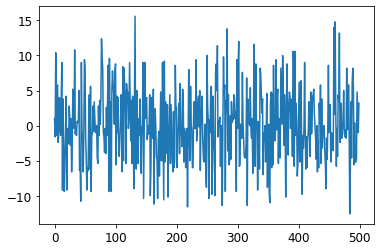

Iter: 19201, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 19202, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 19203, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 19204, curr rwd: -3.2, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 19205, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 19206, curr rwd: -1.2, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 19207, curr rwd: -1.8, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 19208, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 19209, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 19210, curr rwd: 6.4, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 19211, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 19212, curr rwd: -1.4, current losses: 2.7, mean rwd over last 

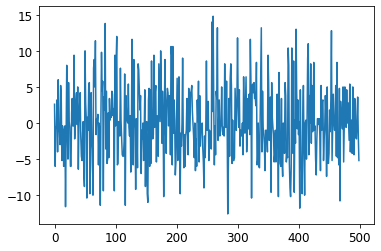

Iter: 19401, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: -0.2
Iter: 19402, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 19403, curr rwd: -9.4, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 19404, curr rwd: -5.4, current losses: 3.0, mean rwd over last 100 trials: -0.2
Iter: 19405, curr rwd: -2.4, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 19406, curr rwd: -2.4, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 19407, curr rwd: 12.8, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 19408, curr rwd: -5.4, current losses: 2.5, mean rwd over last 100 trials: -0.0
Iter: 19409, curr rwd: -1.0, current losses: 2.8, mean rwd over last 100 trials: -0.1
Iter: 19410, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: -0.1
Iter: 19411, curr rwd: 5.4, current losses: 2.5, mean rwd over last 100 trials: -0.0
Iter: 19412, curr rwd: -4.4, current losses: 2.7, mean r

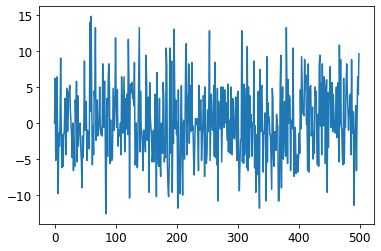

Iter: 19601, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 19602, curr rwd: 3.8, current losses: 2.8, mean rwd over last 100 trials: 1.5
Iter: 19603, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 19604, curr rwd: 7.4, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 19605, curr rwd: 9.6, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 19606, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 19607, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 19608, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 19609, curr rwd: -9.2, current losses: 2.8, mean rwd over last 100 trials: 1.5
Iter: 19610, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 19611, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 19612, curr rwd: 10.0, current losses: 2.5, mean rwd over last 10

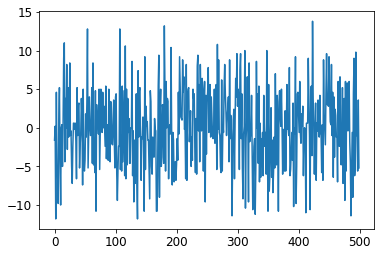

Iter: 19801, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 19802, curr rwd: -8.6, current losses: 3.1, mean rwd over last 100 trials: 0.3
Iter: 19803, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 19804, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 19805, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 19806, curr rwd: 3.8, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 19807, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 19808, curr rwd: 8.4, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 19809, curr rwd: -4.6, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 19810, curr rwd: -1.4, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 19811, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 19812, curr rwd: 0.0, current losses: 2.7, mean rwd over last 10

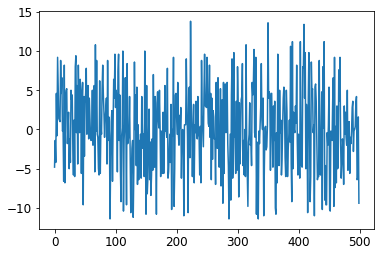

Iter: 20001, curr rwd: -5.0, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 20002, curr rwd: -4.6, current losses: 2.8, mean rwd over last 100 trials: -0.5
Iter: 20003, curr rwd: 3.4, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 20004, curr rwd: 4.6, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 20005, curr rwd: -6.8, current losses: 2.9, mean rwd over last 100 trials: -0.5
Iter: 20006, curr rwd: 1.0, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 20007, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 20008, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 20009, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: -0.6
Iter: 20010, curr rwd: -10.0, current losses: 2.7, mean rwd over last 100 trials: -0.6
Iter: 20011, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 20012, curr rwd: -10.2, current losses: 2.4, mean rwd

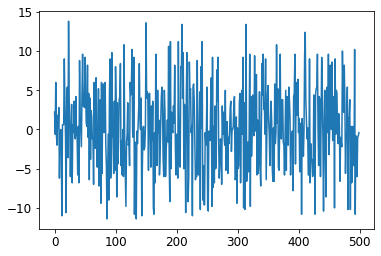

Iter: 20201, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 20202, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 20203, curr rwd: 1.2, current losses: 2.7, mean rwd over last 100 trials: 0.0
Iter: 20204, curr rwd: 13.4, current losses: 2.2, mean rwd over last 100 trials: 0.0
Iter: 20205, curr rwd: 6.0, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 20206, curr rwd: -6.4, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 20207, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 20208, curr rwd: 8.0, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 20209, curr rwd: -10.2, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 20210, curr rwd: -4.8, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 20211, curr rwd: -11.0, current losses: 2.9, mean rwd over last 100 trials: 0.0
Iter: 20212, curr rwd: 3.6, current losses: 2.6, mean rwd over last

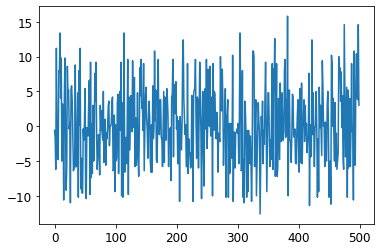

Iter: 20401, curr rwd: 5.8, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 20402, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 20403, curr rwd: 8.2, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 20404, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 20405, curr rwd: -8.8, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 20406, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 20407, curr rwd: 2.6, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 20408, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 20409, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 20410, curr rwd: -7.6, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 20411, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 20412, curr rwd: -1.6, current losses: 2.6, mean rwd over last 1

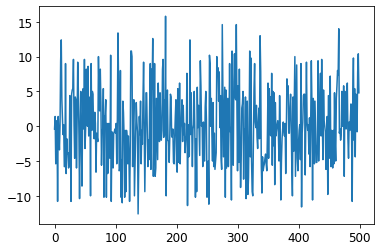

Iter: 20601, curr rwd: 9.0, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 20602, curr rwd: -2.4, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 20603, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 20604, curr rwd: -0.4, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 20605, curr rwd: -0.6, current losses: 2.9, mean rwd over last 100 trials: 0.6
Iter: 20606, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 20607, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 20608, curr rwd: 0.4, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 20609, curr rwd: -4.6, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 20610, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 20611, curr rwd: 7.2, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 20612, curr rwd: 8.2, current losses: 2.4, mean rwd over last 1

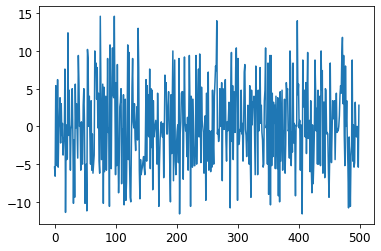

Iter: 20801, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 20802, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 20803, curr rwd: -5.0, current losses: 3.0, mean rwd over last 100 trials: -0.0
Iter: 20804, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 20805, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 20806, curr rwd: 10.6, current losses: 2.3, mean rwd over last 100 trials: -0.0
Iter: 20807, curr rwd: 8.0, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 20808, curr rwd: 13.8, current losses: 2.3, mean rwd over last 100 trials: 0.2
Iter: 20809, curr rwd: 5.6, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 20810, curr rwd: 0.8, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 20811, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 20812, curr rwd: -0.8, current losses: 2.6, mean rwd over l

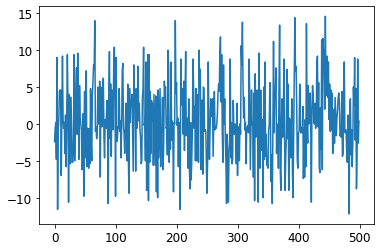

Iter: 21001, curr rwd: -11.0, current losses: 3.0, mean rwd over last 100 trials: 1.1
Iter: 21002, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 21003, curr rwd: 5.4, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 21004, curr rwd: -2.8, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 21005, curr rwd: -11.6, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 21006, curr rwd: 3.2, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 21007, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 21008, curr rwd: 5.2, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 21009, curr rwd: -1.6, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 21010, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 21011, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 21012, curr rwd: -1.2, current losses: 2.7, mean rwd over las

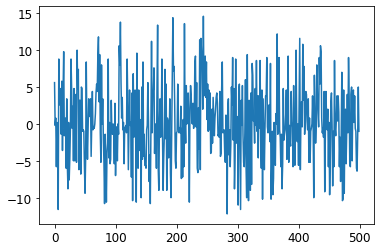

Iter: 21201, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 21202, curr rwd: -5.4, current losses: 3.0, mean rwd over last 100 trials: 0.3
Iter: 21203, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 21204, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 21205, curr rwd: -9.0, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 21206, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 21207, curr rwd: -8.4, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 21208, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 21209, curr rwd: -5.0, current losses: 3.0, mean rwd over last 100 trials: -0.2
Iter: 21210, curr rwd: 9.0, current losses: 2.3, mean rwd over last 100 trials: -0.3
Iter: 21211, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 21212, curr rwd: -2.0, current losses: 2.6, mean rwd over 

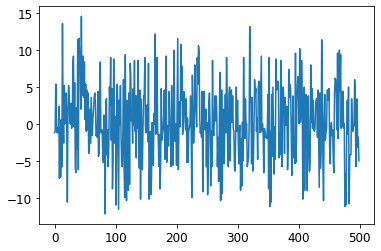

Iter: 21401, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: -0.0
Iter: 21402, curr rwd: 0.4, current losses: 2.9, mean rwd over last 100 trials: -0.1
Iter: 21403, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 21404, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 21405, curr rwd: -9.4, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 21406, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: -0.4
Iter: 21407, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 21408, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 21409, curr rwd: 1.4, current losses: 2.7, mean rwd over last 100 trials: -0.4
Iter: 21410, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 21411, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 21412, curr rwd: -6.2, current losses: 2.7, mean rwd

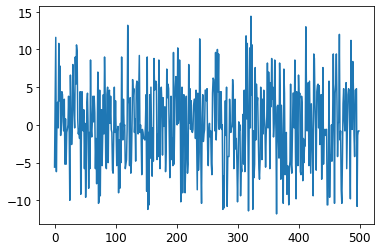

Iter: 21601, curr rwd: 2.4, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 21602, curr rwd: 2.4, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 21603, curr rwd: -5.8, current losses: 3.0, mean rwd over last 100 trials: 0.1
Iter: 21604, curr rwd: 8.6, current losses: 2.3, mean rwd over last 100 trials: 0.1
Iter: 21605, curr rwd: 9.2, current losses: 2.3, mean rwd over last 100 trials: 0.3
Iter: 21606, curr rwd: 4.8, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 21607, curr rwd: 0.4, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 21608, curr rwd: -1.0, current losses: 3.0, mean rwd over last 100 trials: 0.4
Iter: 21609, curr rwd: 3.4, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 21610, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 21611, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 21612, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100

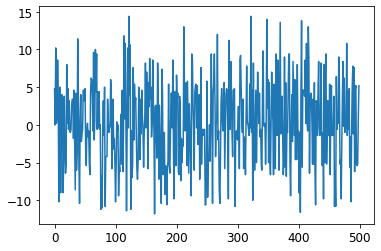

Iter: 21801, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 21802, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 21803, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 21804, curr rwd: -6.0, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 21805, curr rwd: -2.0, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 21806, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 21807, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 21808, curr rwd: 6.2, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 21809, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 21810, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 21811, curr rwd: 8.8, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 21812, curr rwd: -5.4, current losses: 2.6, mean rwd over last 1

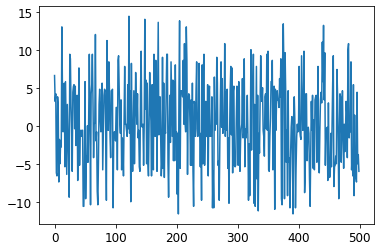

Iter: 22001, curr rwd: 3.2, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 22002, curr rwd: -2.6, current losses: 2.8, mean rwd over last 100 trials: -0.2
Iter: 22003, curr rwd: -10.0, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 22004, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 22005, curr rwd: -9.0, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 22006, curr rwd: 10.8, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 22007, curr rwd: 10.2, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 22008, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 22009, curr rwd: -3.2, current losses: 2.7, mean rwd over last 100 trials: -0.4
Iter: 22010, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 22011, curr rwd: 8.0, current losses: 2.3, mean rwd over last 100 trials: -0.4
Iter: 22012, curr rwd: -4.8, current losses: 2.6, mean r

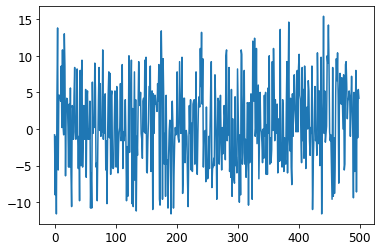

Iter: 22201, curr rwd: -6.4, current losses: 2.6, mean rwd over last 100 trials: 1.9
Iter: 22202, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 22203, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 22204, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 22205, curr rwd: 4.4, current losses: 2.3, mean rwd over last 100 trials: 1.7
Iter: 22206, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 1.8
Iter: 22207, curr rwd: -5.0, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 22208, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 22209, curr rwd: 9.0, current losses: 2.3, mean rwd over last 100 trials: 1.6
Iter: 22210, curr rwd: 3.0, current losses: 2.5, mean rwd over last 100 trials: 1.8
Iter: 22211, curr rwd: 2.8, current losses: 2.4, mean rwd over last 100 trials: 1.7
Iter: 22212, curr rwd: 0.2, current losses: 2.4, mean rwd over last 100 

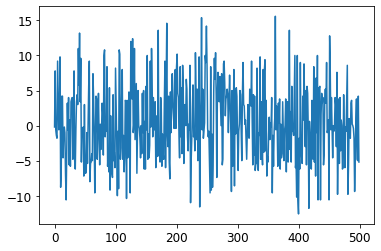

Iter: 22401, curr rwd: 9.8, current losses: 2.4, mean rwd over last 100 trials: -0.1
Iter: 22402, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: -0.0
Iter: 22403, curr rwd: 7.8, current losses: 2.3, mean rwd over last 100 trials: 0.0
Iter: 22404, curr rwd: 2.8, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 22405, curr rwd: 0.6, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 22406, curr rwd: 8.8, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 22407, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 22408, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 22409, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 22410, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 22411, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 22412, curr rwd: 4.8, current losses: 2.3, mean rwd over last 100

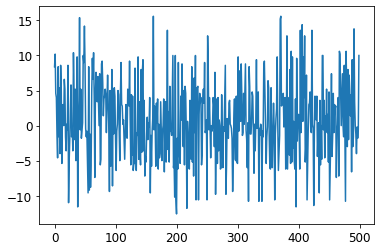

Iter: 22601, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: 1.3
Iter: 22602, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 22603, curr rwd: 1.0, current losses: 2.3, mean rwd over last 100 trials: 1.3
Iter: 22604, curr rwd: -7.4, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 22605, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 22606, curr rwd: -8.4, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 22607, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 22608, curr rwd: 2.8, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 22609, curr rwd: 9.0, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 22610, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 22611, curr rwd: 5.4, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 22612, curr rwd: 8.0, current losses: 2.4, mean rwd over last 10

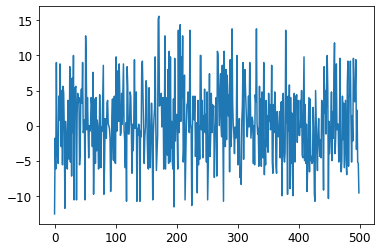

Iter: 22801, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: -0.3
Iter: 22802, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: -0.3
Iter: 22803, curr rwd: -6.6, current losses: 2.9, mean rwd over last 100 trials: -0.4
Iter: 22804, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 22805, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 22806, curr rwd: -4.4, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 22807, curr rwd: 2.8, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 22808, curr rwd: 4.2, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 22809, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 22810, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 22811, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: -0.5
Iter: 22812, curr rwd: -1.2, current losses: 2.7, mean rwd 

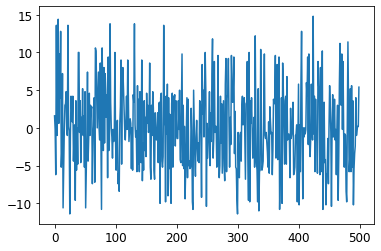

Iter: 23001, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 23002, curr rwd: -6.2, current losses: 2.7, mean rwd over last 100 trials: -0.0
Iter: 23003, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 23004, curr rwd: -2.0, current losses: 2.8, mean rwd over last 100 trials: -0.0
Iter: 23005, curr rwd: 9.4, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 23006, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 23007, curr rwd: -5.8, current losses: 2.9, mean rwd over last 100 trials: -0.1
Iter: 23008, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 23009, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 23010, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 23011, curr rwd: 9.0, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 23012, curr rwd: -5.4, current losses: 3.1, mean rwd 

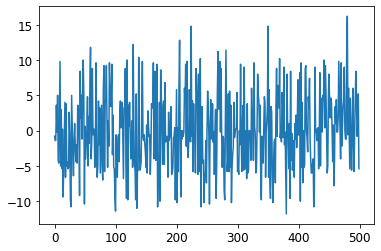

Iter: 23201, curr rwd: 8.6, current losses: 2.3, mean rwd over last 100 trials: 0.9
Iter: 23202, curr rwd: -6.2, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 23203, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 23204, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 23205, curr rwd: 4.4, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 23206, curr rwd: 9.4, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 23207, curr rwd: -4.0, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 23208, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 1.1
Iter: 23209, curr rwd: 9.6, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 23210, curr rwd: 2.4, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 23211, curr rwd: -6.8, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 23212, curr rwd: -4.8, current losses: 2.4, mean rwd over last 10

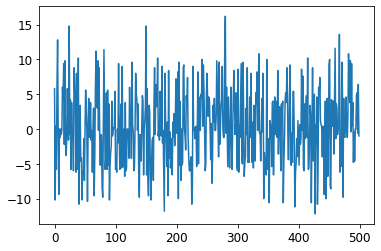

Iter: 23401, curr rwd: 6.4, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 23402, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 23403, curr rwd: 0.6, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 23404, curr rwd: 0.8, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 23405, curr rwd: 8.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 23406, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 23407, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 23408, curr rwd: 2.4, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 23409, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 23410, curr rwd: 10.6, current losses: 2.3, mean rwd over last 100 trials: 1.0
Iter: 23411, curr rwd: -1.8, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 23412, curr rwd: 3.0, current losses: 2.4, mean rwd over last 100 

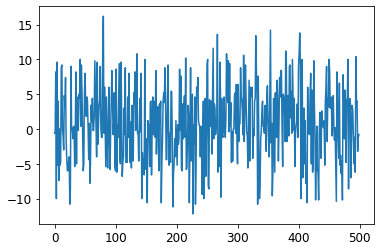

Iter: 23601, curr rwd: -2.2, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 23602, curr rwd: 2.8, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 23603, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 23604, curr rwd: -0.6, current losses: 2.4, mean rwd over last 100 trials: -0.0
Iter: 23605, curr rwd: -4.8, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 23606, curr rwd: -10.2, current losses: 3.1, mean rwd over last 100 trials: 0.0
Iter: 23607, curr rwd: -4.6, current losses: 2.5, mean rwd over last 100 trials: -0.2
Iter: 23608, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 23609, curr rwd: 5.2, current losses: 2.4, mean rwd over last 100 trials: -0.2
Iter: 23610, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: -0.2
Iter: 23611, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 23612, curr rwd: -5.4, current losses: 2.8, mean rwd ov

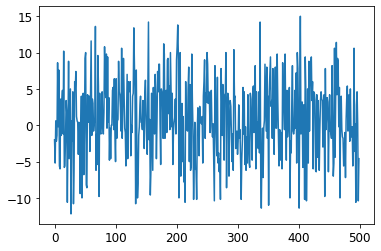

Iter: 23801, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 23802, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 23803, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 23804, curr rwd: 2.2, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 23805, curr rwd: 1.4, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 23806, curr rwd: 4.8, current losses: 2.3, mean rwd over last 100 trials: 0.5
Iter: 23807, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 23808, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 23809, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 23810, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 23811, curr rwd: -11.8, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 23812, curr rwd: 4.6, current losses: 2.5, mean rwd over last

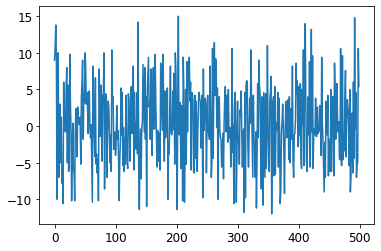

Iter: 24001, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 24002, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 24003, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 24004, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 24005, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 24006, curr rwd: -3.8, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 24007, curr rwd: 4.0, current losses: 2.9, mean rwd over last 100 trials: 0.5
Iter: 24008, curr rwd: 2.6, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 24009, curr rwd: 8.4, current losses: 2.3, mean rwd over last 100 trials: 0.4
Iter: 24010, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 24011, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 24012, curr rwd: 4.0, current losses: 2.7, mean rwd over last 100 t

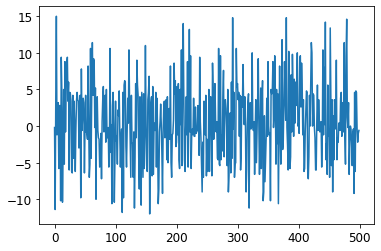

Iter: 24201, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 24202, curr rwd: -3.8, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 24203, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 24204, curr rwd: 3.6, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 24205, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 24206, curr rwd: -9.2, current losses: 3.0, mean rwd over last 100 trials: 0.6
Iter: 24207, curr rwd: 5.0, current losses: 2.3, mean rwd over last 100 trials: 0.5
Iter: 24208, curr rwd: 5.6, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 24209, curr rwd: -4.6, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 24210, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 24211, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 24212, curr rwd: -2.8, current losses: 2.6, mean rwd over last 10

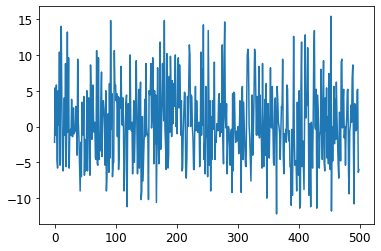

Iter: 24401, curr rwd: -5.0, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 24402, curr rwd: 2.6, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 24403, curr rwd: -1.2, current losses: 3.0, mean rwd over last 100 trials: 0.3
Iter: 24404, curr rwd: -11.0, current losses: 2.8, mean rwd over last 100 trials: 0.4
Iter: 24405, curr rwd: 13.6, current losses: 2.3, mean rwd over last 100 trials: 0.3
Iter: 24406, curr rwd: 2.6, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 24407, curr rwd: -10.2, current losses: 2.8, mean rwd over last 100 trials: 0.4
Iter: 24408, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 24409, curr rwd: -0.2, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 24410, curr rwd: 8.8, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 24411, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 24412, curr rwd: -10.0, current losses: 2.6, mean rwd over la

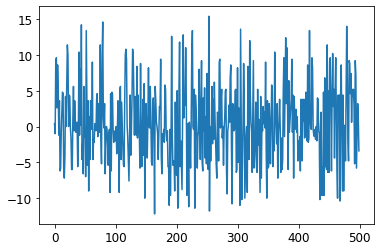

Iter: 24601, curr rwd: -4.2, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 24602, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 24603, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 24604, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 24605, curr rwd: 6.2, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 24606, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 24607, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 24608, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 24609, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 24610, curr rwd: 9.0, current losses: 2.3, mean rwd over last 100 trials: 0.8
Iter: 24611, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 24612, curr rwd: -0.4, current losses: 2.8, mean rwd over last 

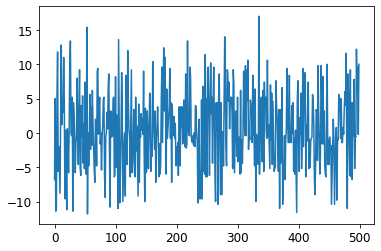

Iter: 24801, curr rwd: -0.2, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 24802, curr rwd: -7.4, current losses: 3.0, mean rwd over last 100 trials: 0.6
Iter: 24803, curr rwd: -2.0, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 24804, curr rwd: 5.2, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 24805, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 24806, curr rwd: 0.6, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 24807, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 24808, curr rwd: -1.4, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 24809, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 24810, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 24811, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 24812, curr rwd: 9.6, current losses: 2.5, mean rwd over last 100

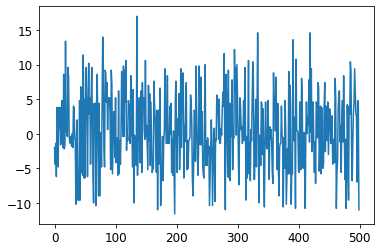

Iter: 25001, curr rwd: 3.4, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 25002, curr rwd: -1.4, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 25003, curr rwd: 4.4, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 25004, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 25005, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 25006, curr rwd: -2.0, current losses: 2.9, mean rwd over last 100 trials: 0.6
Iter: 25007, curr rwd: 5.2, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 25008, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 25009, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 25010, curr rwd: -1.6, current losses: 2.9, mean rwd over last 100 trials: 0.7
Iter: 25011, curr rwd: 6.6, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 25012, curr rwd: 7.8, current losses: 2.4, mean rwd over last 100 t

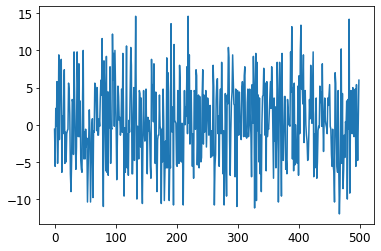

Iter: 25201, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 25202, curr rwd: 14.8, current losses: 2.2, mean rwd over last 100 trials: 0.3
Iter: 25203, curr rwd: -4.0, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 25204, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 25205, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 25206, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 25207, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 25208, curr rwd: 1.6, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 25209, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 25210, curr rwd: -5.6, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 25211, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: -0.1
Iter: 25212, curr rwd: -6.2, current losses: 3.0, mean rwd over las

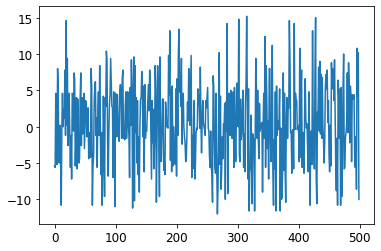

Iter: 25401, curr rwd: -1.4, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 25402, curr rwd: 9.2, current losses: 2.3, mean rwd over last 100 trials: 0.8
Iter: 25403, curr rwd: 5.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 25404, curr rwd: 11.6, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 25405, curr rwd: -3.8, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 25406, curr rwd: -4.2, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 25407, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 25408, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 25409, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 25410, curr rwd: 4.2, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 25411, curr rwd: 3.2, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 25412, curr rwd: -7.2, current losses: 2.9, mean rwd over last 10

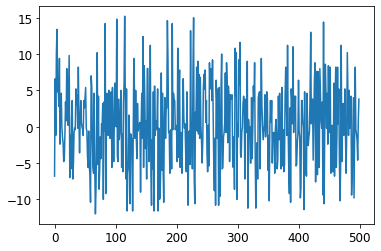

Iter: 25601, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 25602, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 25603, curr rwd: 2.8, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 25604, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 25605, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 25606, curr rwd: -1.4, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 25607, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 25608, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 25609, curr rwd: -5.0, current losses: 2.9, mean rwd over last 100 trials: 0.5
Iter: 25610, curr rwd: -9.6, current losses: 2.9, mean rwd over last 100 trials: 0.6
Iter: 25611, curr rwd: 10.4, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 25612, curr rwd: -6.0, current losses: 2.8, mean rwd over last 1

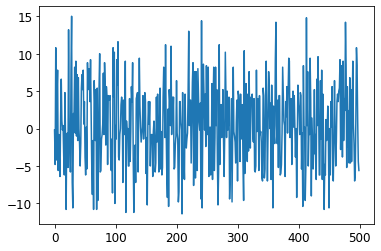

Iter: 25801, curr rwd: -2.4, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 25802, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 25803, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 25804, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 25805, curr rwd: -0.8, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 25806, curr rwd: 10.0, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 25807, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 25808, curr rwd: -11.8, current losses: 3.0, mean rwd over last 100 trials: 0.7
Iter: 25809, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 25810, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 25811, curr rwd: -4.0, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 25812, curr rwd: 7.6, current losses: 2.4, mean rwd over last

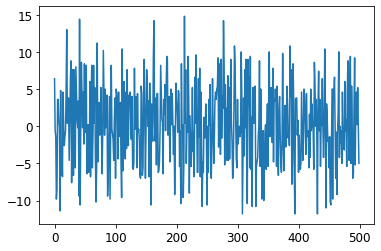

Iter: 26001, curr rwd: 0.2, current losses: 2.4, mean rwd over last 100 trials: -0.0
Iter: 26002, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: -0.0
Iter: 26003, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 26004, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 26005, curr rwd: 7.2, current losses: 2.4, mean rwd over last 100 trials: 0.0
Iter: 26006, curr rwd: 5.4, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 26007, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 26008, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 26009, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 26010, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.0
Iter: 26011, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: -0.0
Iter: 26012, curr rwd: -4.8, current losses: 2.8, mean rwd over 

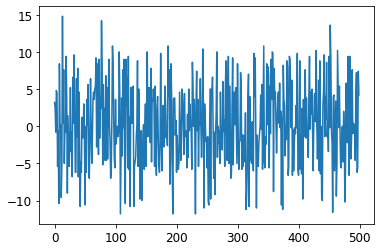

Iter: 26201, curr rwd: 1.0, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 26202, curr rwd: 1.2, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 26203, curr rwd: 7.6, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 26204, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 26205, curr rwd: 10.0, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 26206, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 26207, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 26208, curr rwd: 11.6, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 26209, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 26210, curr rwd: 0.2, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 26211, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 26212, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100

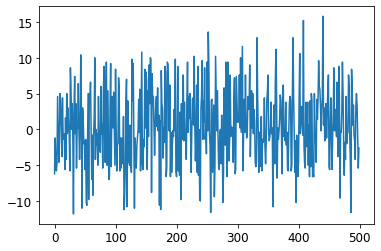

Iter: 26401, curr rwd: -4.6, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 26402, curr rwd: -5.0, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 26403, curr rwd: 9.6, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 26404, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 26405, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 26406, curr rwd: -6.8, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 26407, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 26408, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 26409, curr rwd: 9.6, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 26410, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 26411, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 26412, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 

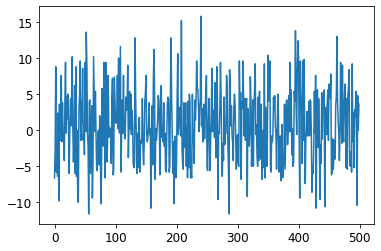

Iter: 26601, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 26602, curr rwd: 9.6, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 26603, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 26604, curr rwd: -9.6, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 26605, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 26606, curr rwd: -6.6, current losses: 2.9, mean rwd over last 100 trials: 0.7
Iter: 26607, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 26608, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 26609, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 26610, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 26611, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 26612, curr rwd: -6.0, current losses: 2.6, mean rwd over last 100 

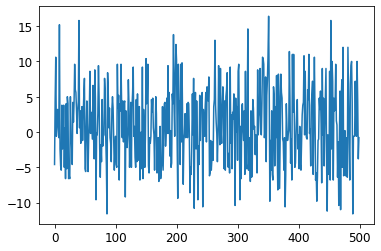

Iter: 26801, curr rwd: 5.4, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 26802, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 26803, curr rwd: -10.0, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 26804, curr rwd: 10.4, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 26805, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 26806, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 26807, curr rwd: 3.8, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 26808, curr rwd: 3.6, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 26809, curr rwd: -4.2, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 26810, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 26811, curr rwd: -9.4, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 26812, curr rwd: -0.4, current losses: 2.5, mean rwd over last 

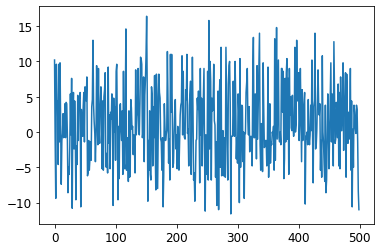

Iter: 27001, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 27002, curr rwd: 5.0, current losses: 2.3, mean rwd over last 100 trials: 1.1
Iter: 27003, curr rwd: 1.0, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 27004, curr rwd: 13.6, current losses: 2.3, mean rwd over last 100 trials: 1.1
Iter: 27005, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 27006, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 27007, curr rwd: -5.4, current losses: 3.0, mean rwd over last 100 trials: 1.2
Iter: 27008, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 27009, curr rwd: -1.2, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 27010, curr rwd: -2.6, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 27011, curr rwd: 0.6, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 27012, curr rwd: -6.0, current losses: 3.1, mean rwd over last 

In [ ]:
env = Hangman('words_250000_train.txt' , max_lives = 6, verbose = False)
#env.seed(42);
rwds_list=[]

for iteration in range(n_iterations):
    
    all_rewards, all_grads, all_losses = play_multiple_episodes(env, n_episodes_per_update, n_max_steps, full_model, loss_fn)

    total_rewards = sum(map(sum, all_rewards)) 
    mean_rewards=total_rewards / n_episodes_per_update
    rwds_list.append(mean_rewards)

    print("\rIter: {}, curr rwd: {:.1f}, current losses: {:.1f}, mean rwd over last 100 trials: {:.1f}".format(iteration,\
                                        mean_rewards, np.mean(all_losses),np.mean(rwds_list[-101:-1])))
    
    all_final_rewards = discount_and_normalize_rewards(all_rewards,discount_rate)
    
    all_mean_grads = []
    for var_index in range(len(full_model.trainable_variables)):

        # Standard gradient:
        mean_grads = tf.reduce_mean([tf.convert_to_tensor(all_grads[episode_index][step][var_index])
             for episode_index, final_rewards in enumerate(all_final_rewards)
                 for step, final_reward in enumerate(final_rewards)], axis=0)
        
        # Policy gradient:
        # mean_grads = tf.reduce_mean(
        #     [final_reward * all_grads[episode_index][step][var_index]
        #      for episode_index, final_rewards in enumerate(all_final_rewards)
        #          for step, final_reward in enumerate(final_rewards)], axis=0)

        all_mean_grads.append(mean_grads)
    optimizer.apply_gradients(zip(all_mean_grads, full_model.trainable_variables))
    if iteration>0 and iteration % save_episode == 0 :

#        full_model.save('Hangman_PG.h5',include_optimizer=True)

        xx=LinearRegression().fit(pd.DataFrame(np.arange(len(rwds_list))),pd.DataFrame(rwds_list))
        print('Overall mean reward after {} iterations: {:.1f}. Mean reward for last 500 instances: {:.1f},'\
              ' slope of LinReg: {:.10f}'.format(iteration, np.mean(rwds_list),\
                                                np.mean(rwds_list[-501:-1]),xx.coef_[0][0]))
        full_model.save('./drive/MyDrive/Hangman_PG.h5', include_optimizer=True)
        plt.plot(rwds_list[-501:-1])
        plt.show()

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Iter: 0, curr rwd: 1.4, current losses: 2.7, mean rwd over last 100 trials: nan
Iter: 1, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: 1.4
Iter: 2, curr rwd: 2.0, current losses: 2.6, mean rwd over last 100 trials: -1.7
Iter: 3, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: -0.5
Iter: 4, curr rwd: 0.8, current losses: 2.7, mean rwd over last 100 trials: -1.5
Iter: 5, curr rwd: 13.4, current losses: 2.5, mean rwd over last 100 trials: -1.0
Iter: 6, curr rwd: 8.4, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 7, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 2.4
Iter: 8, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 2.1
Iter: 9, curr rwd: -0.2, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 10, curr rwd: -7.0, current losses: 3.1, mean rwd over last 100 trials: 1.1
Iter: 11, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 12, curr rwd: 3.8, cu

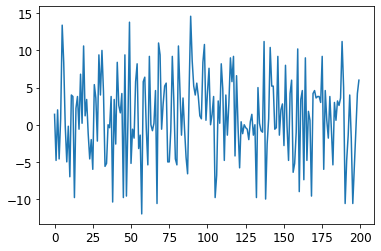

Iter: 201, curr rwd: -1.4, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 202, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 203, curr rwd: 8.2, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 204, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 205, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 206, curr rwd: -1.6, current losses: 2.9, mean rwd over last 100 trials: 0.8
Iter: 207, curr rwd: 7.4, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 208, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 209, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 210, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 211, curr rwd: -11.2, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 212, curr rwd: 13.0, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 2

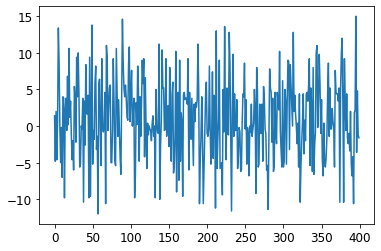

Iter: 401, curr rwd: -6.4, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 402, curr rwd: -10.0, current losses: 2.8, mean rwd over last 100 trials: 1.2
Iter: 403, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 404, curr rwd: -7.4, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 405, curr rwd: 8.6, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 406, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 407, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 408, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 409, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 410, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 411, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 412, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 

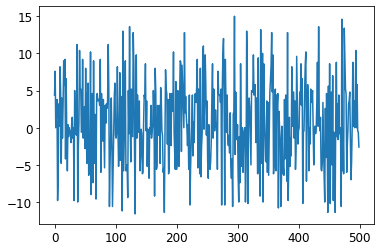

Iter: 601, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 602, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 603, curr rwd: -4.0, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 604, curr rwd: 6.2, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 605, curr rwd: 0.0, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 606, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 607, curr rwd: 4.8, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 608, curr rwd: 4.2, current losses: 2.3, mean rwd over last 100 trials: 0.6
Iter: 609, curr rwd: -5.2, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 610, curr rwd: 9.6, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 611, curr rwd: 8.8, current losses: 2.3, mean rwd over last 100 trials: 0.7
Iter: 612, curr rwd: 3.0, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 613, c

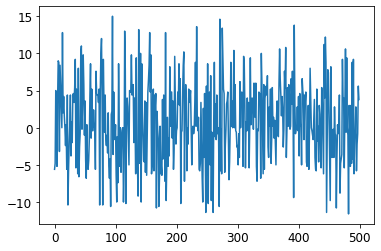

Iter: 801, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 802, curr rwd: -8.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 803, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 804, curr rwd: -3.8, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 805, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 806, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 807, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.0
Iter: 808, curr rwd: 0.8, current losses: 2.7, mean rwd over last 100 trials: -0.0
Iter: 809, curr rwd: -2.0, current losses: 2.8, mean rwd over last 100 trials: -0.0
Iter: 810, curr rwd: 5.4, current losses: 2.7, mean rwd over last 100 trials: -0.0
Iter: 811, curr rwd: 10.0, current losses: 2.4, mean rwd over last 100 trials: -0.0
Iter: 812, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter:

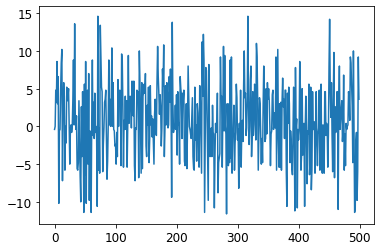

Iter: 1001, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 1002, curr rwd: 7.2, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 1003, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 1004, curr rwd: -7.0, current losses: 2.9, mean rwd over last 100 trials: 0.0
Iter: 1005, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: 0.0
Iter: 1006, curr rwd: 14.2, current losses: 2.3, mean rwd over last 100 trials: 0.0
Iter: 1007, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 1008, curr rwd: 8.6, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 1009, curr rwd: -11.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 1010, curr rwd: -5.6, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 1011, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 1012, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials:

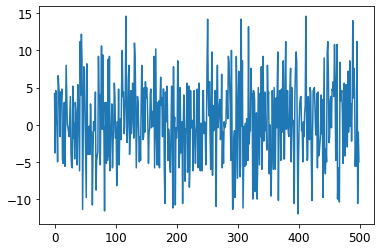

Iter: 1201, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 1202, curr rwd: 0.6, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 1203, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 1204, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 1205, curr rwd: 5.6, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 1206, curr rwd: 8.4, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 1207, curr rwd: 4.2, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 1208, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 1209, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 1210, curr rwd: -4.2, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 1211, curr rwd: -2.2, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 1212, curr rwd: 7.8, current losses: 2.6, mean rwd over last 100 trials: 0

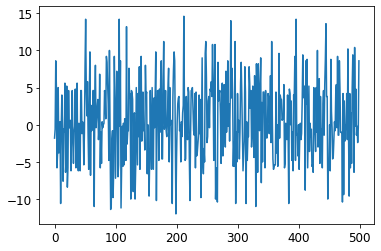

Iter: 1401, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 1402, curr rwd: 10.4, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 1403, curr rwd: -1.2, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 1404, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 1405, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 1406, curr rwd: -7.2, current losses: 3.0, mean rwd over last 100 trials: 0.9
Iter: 1407, curr rwd: -11.0, current losses: 2.9, mean rwd over last 100 trials: 0.8
Iter: 1408, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 1409, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 1410, curr rwd: -3.8, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 1411, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 1412, curr rwd: 4.2, current losses: 2.4, mean rwd over last 100 trials:

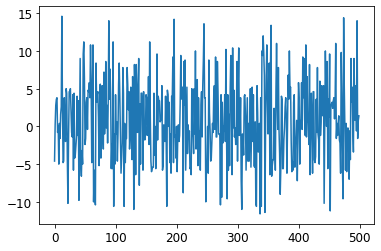

Iter: 1601, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 1602, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 1603, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 1604, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 1605, curr rwd: 9.6, current losses: 2.4, mean rwd over last 100 trials: 1.4
Iter: 1606, curr rwd: 10.2, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 1607, curr rwd: -2.4, current losses: 2.8, mean rwd over last 100 trials: 1.5
Iter: 1608, curr rwd: 0.8, current losses: 2.4, mean rwd over last 100 trials: 1.4
Iter: 1609, curr rwd: -2.4, current losses: 2.9, mean rwd over last 100 trials: 1.4
Iter: 1610, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 1611, curr rwd: 9.0, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 1612, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: 1

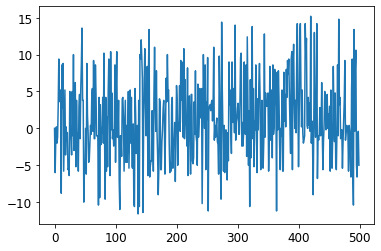

Iter: 1801, curr rwd: 2.2, current losses: 2.9, mean rwd over last 100 trials: 1.5
Iter: 1802, curr rwd: 13.4, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 1803, curr rwd: -0.8, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 1804, curr rwd: -10.2, current losses: 3.0, mean rwd over last 100 trials: 1.4
Iter: 1805, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 1806, curr rwd: 6.4, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 1807, curr rwd: -5.2, current losses: 2.9, mean rwd over last 100 trials: 1.3
Iter: 1808, curr rwd: 4.6, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 1809, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 1810, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 1811, curr rwd: -5.6, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 1812, curr rwd: 6.0, current losses: 2.7, mean rwd over last 100 trials:

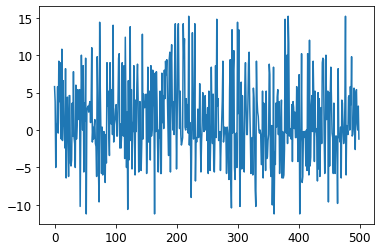

Iter: 2001, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 2002, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 2003, curr rwd: -5.2, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 2004, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 2005, curr rwd: -6.8, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 2006, curr rwd: -0.8, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 2007, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 2008, curr rwd: -3.8, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 2009, curr rwd: -4.0, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 2010, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 2011, curr rwd: 6.0, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 2012, curr rwd: 2.6, current losses: 2.6, mean rwd over last 100 trials: 0

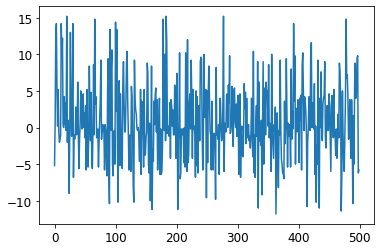

Iter: 2201, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 2202, curr rwd: 6.6, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 2203, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 2204, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: 1.2
Iter: 2205, curr rwd: -5.0, current losses: 2.9, mean rwd over last 100 trials: 1.2
Iter: 2206, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 2207, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 2208, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 2209, curr rwd: -3.6, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 2210, curr rwd: -8.4, current losses: 3.0, mean rwd over last 100 trials: 0.9
Iter: 2211, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 2212, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials:

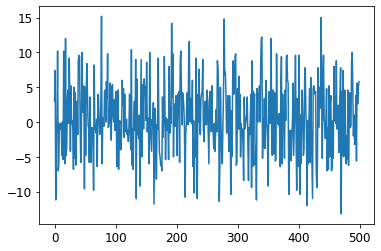

Iter: 2401, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 2402, curr rwd: -1.4, current losses: 2.9, mean rwd over last 100 trials: 0.3
Iter: 2403, curr rwd: 2.8, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 2404, curr rwd: 3.8, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 2405, curr rwd: 10.2, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 2406, curr rwd: 3.0, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 2407, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 2408, curr rwd: -9.0, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 2409, curr rwd: -1.2, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 2410, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 2411, curr rwd: -2.4, current losses: 2.8, mean rwd over last 100 trials: 0.4
Iter: 2412, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 

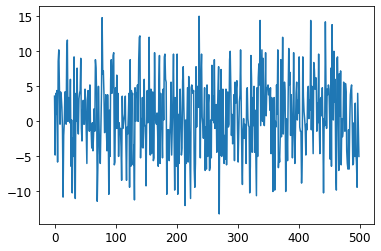

Iter: 2601, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 2602, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 2603, curr rwd: -5.0, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 2604, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 2605, curr rwd: -5.2, current losses: 3.0, mean rwd over last 100 trials: 1.0
Iter: 2606, curr rwd: -0.2, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 2607, curr rwd: 2.8, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 2608, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 2609, curr rwd: -6.8, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 2610, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 2611, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 2612, curr rwd: -4.4, current losses: 2.7, mean rwd over last 100 trials: 

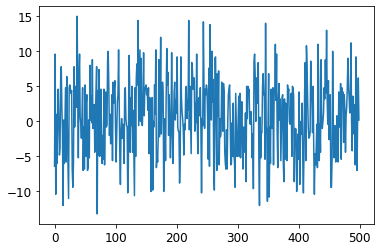

Iter: 2801, curr rwd: 3.2, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 2802, curr rwd: 8.4, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 2803, curr rwd: -7.4, current losses: 2.9, mean rwd over last 100 trials: 0.7
Iter: 2804, curr rwd: -3.2, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 2805, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 2806, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 2807, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 2808, curr rwd: -1.2, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 2809, curr rwd: 7.6, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 2810, curr rwd: -2.0, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 2811, curr rwd: 5.8, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 2812, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: 0.

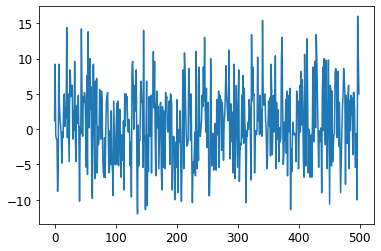

Iter: 3001, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 3002, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 3003, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 3004, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 1.8
Iter: 3005, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 3006, curr rwd: -4.8, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 3007, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 1.5
Iter: 3008, curr rwd: 8.2, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 3009, curr rwd: 8.4, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 3010, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 1.8
Iter: 3011, curr rwd: 6.6, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 3012, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 1.8


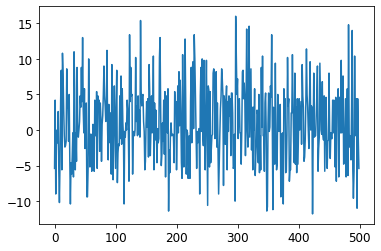

Iter: 3201, curr rwd: 3.0, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 3202, curr rwd: 4.6, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 3203, curr rwd: -10.2, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 3204, curr rwd: -6.6, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 3205, curr rwd: -1.6, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 3206, curr rwd: -0.4, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 3207, curr rwd: 10.0, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 3208, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 3209, curr rwd: 1.2, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 3210, curr rwd: -9.4, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 3211, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 3212, curr rwd: 2.2, current losses: 2.5, mean rwd over last 100 trials: 

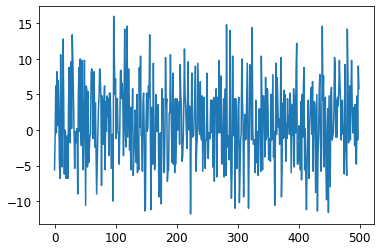

Iter: 3401, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 3402, curr rwd: 10.2, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 3403, curr rwd: 5.4, current losses: 2.4, mean rwd over last 100 trials: 1.3
Iter: 3404, curr rwd: 2.8, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 3405, curr rwd: -2.6, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 3406, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 3407, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 3408, curr rwd: -5.8, current losses: 3.0, mean rwd over last 100 trials: 1.4
Iter: 3409, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 3410, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 3411, curr rwd: -7.0, current losses: 2.9, mean rwd over last 100 trials: 1.2
Iter: 3412, curr rwd: 8.4, current losses: 2.4, mean rwd over last 100 trials: 1.

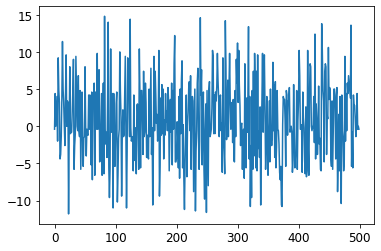

Iter: 3601, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 3602, curr rwd: -3.0, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 3603, curr rwd: 0.8, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 3604, curr rwd: -7.0, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 3605, curr rwd: -2.0, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 3606, curr rwd: -6.2, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 3607, curr rwd: -10.6, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 3608, curr rwd: 0.2, current losses: 2.9, mean rwd over last 100 trials: 0.8
Iter: 3609, curr rwd: -1.2, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 3610, curr rwd: 1.2, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 3611, curr rwd: 13.0, current losses: 2.2, mean rwd over last 100 trials: 0.8
Iter: 3612, curr rwd: 9.4, current losses: 2.3, mean rwd over last 100 trials:

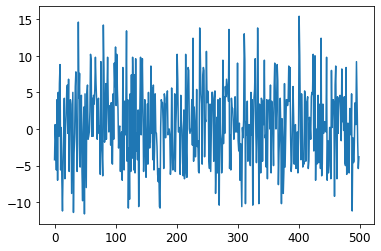

Iter: 3801, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 3802, curr rwd: -6.6, current losses: 3.0, mean rwd over last 100 trials: 0.3
Iter: 3803, curr rwd: 0.0, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 3804, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 3805, curr rwd: -6.2, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 3806, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.1
Iter: 3807, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: 0.1
Iter: 3808, curr rwd: 8.8, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 3809, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: 0.2
Iter: 3810, curr rwd: 2.2, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 3811, curr rwd: -2.2, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 3812, curr rwd: -3.8, current losses: 2.5, mean rwd over last 100 trials: 0

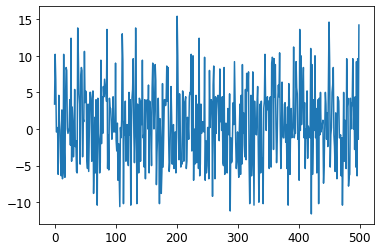

Iter: 4001, curr rwd: -4.8, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 4002, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 4003, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 4004, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 4005, curr rwd: 4.6, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 4006, curr rwd: 8.2, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 4007, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 4008, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 4009, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 4010, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 4011, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 4012, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.

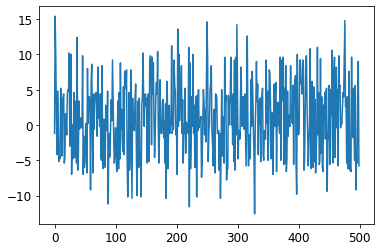

Iter: 4201, curr rwd: -10.4, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 4202, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 4203, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 4204, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 4205, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 4206, curr rwd: -0.8, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 4207, curr rwd: 9.8, current losses: 2.3, mean rwd over last 100 trials: 0.7
Iter: 4208, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 4209, curr rwd: -10.6, current losses: 3.4, mean rwd over last 100 trials: 0.7
Iter: 4210, curr rwd: 3.6, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 4211, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 4212, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials

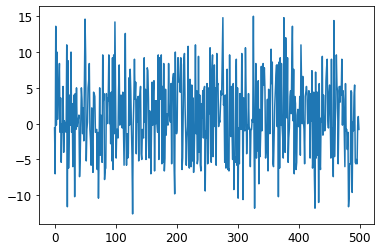

Iter: 4401, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 4402, curr rwd: 0.6, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 4403, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 4404, curr rwd: -1.6, current losses: 2.9, mean rwd over last 100 trials: 0.8
Iter: 4405, curr rwd: 1.4, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 4406, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 4407, curr rwd: 5.6, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 4408, curr rwd: -4.0, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 4409, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 4410, curr rwd: 0.8, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 4411, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 4412, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.7
I

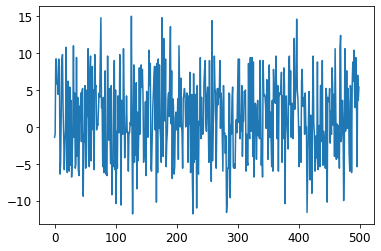

Iter: 4601, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 4602, curr rwd: 3.2, current losses: 2.9, mean rwd over last 100 trials: 1.1
Iter: 4603, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 4604, curr rwd: 2.6, current losses: 2.8, mean rwd over last 100 trials: 1.1
Iter: 4605, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 4606, curr rwd: -1.4, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 4607, curr rwd: 7.0, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 4608, curr rwd: 1.4, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 4609, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 4610, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 4611, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 4612, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: 1.1
I

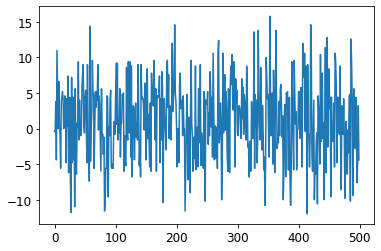

Iter: 4801, curr rwd: -5.8, current losses: 2.9, mean rwd over last 100 trials: 0.7
Iter: 4802, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 4803, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 4804, curr rwd: 1.2, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 4805, curr rwd: -4.6, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 4806, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 4807, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 4808, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 4809, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 4810, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 4811, curr rwd: 0.6, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 4812, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.3


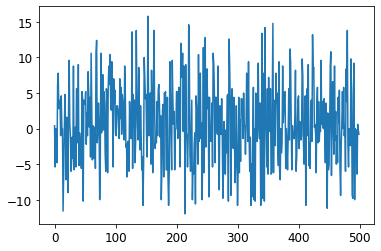

Iter: 5001, curr rwd: -4.2, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 5002, curr rwd: 9.8, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 5003, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 5004, curr rwd: 2.4, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 5005, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 5006, curr rwd: 10.6, current losses: 2.3, mean rwd over last 100 trials: 0.6
Iter: 5007, curr rwd: 0.8, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 5008, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 5009, curr rwd: -10.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 5010, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 5011, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 5012, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: 0

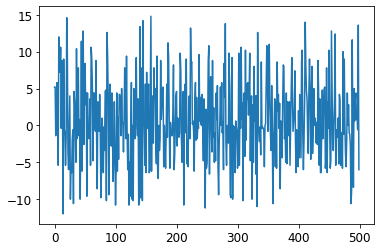

Iter: 5201, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 5202, curr rwd: 3.8, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 5203, curr rwd: -5.0, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 5204, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 5205, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 5206, curr rwd: 0.6, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 5207, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 5208, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 5209, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 5210, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 5211, curr rwd: -3.0, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 5212, curr rwd: -6.6, current losses: 2.8, mean rwd over last 100 trials: 0.

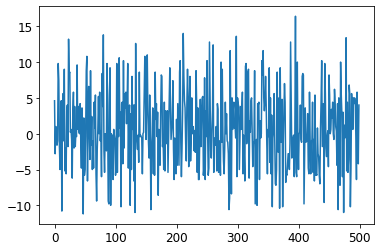

Iter: 5401, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 5402, curr rwd: 14.8, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 5403, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 5404, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 5405, curr rwd: -5.4, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 5406, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 5407, curr rwd: 0.4, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 5408, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 5409, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 5410, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 5411, curr rwd: -3.4, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 5412, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: 0

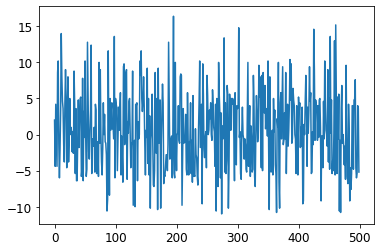

Iter: 5601, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 5602, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 5603, curr rwd: 7.4, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 5604, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 5605, curr rwd: 0.4, current losses: 3.0, mean rwd over last 100 trials: 0.7
Iter: 5606, curr rwd: 11.0, current losses: 2.3, mean rwd over last 100 trials: 0.8
Iter: 5607, curr rwd: 2.4, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 5608, curr rwd: -2.2, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 5609, curr rwd: 7.8, current losses: 2.3, mean rwd over last 100 trials: 1.0
Iter: 5610, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 5611, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 1.1
Iter: 5612, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 1

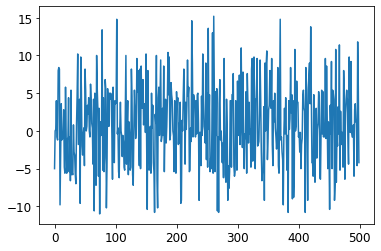

Iter: 5801, curr rwd: 10.2, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 5802, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 5803, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 5804, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 5805, curr rwd: -4.6, current losses: 2.8, mean rwd over last 100 trials: 1.3
Iter: 5806, curr rwd: 0.6, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 5807, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 5808, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 5809, curr rwd: -5.4, current losses: 2.8, mean rwd over last 100 trials: 1.1
Iter: 5810, curr rwd: 0.6, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 5811, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 5812, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 trials: 1.2


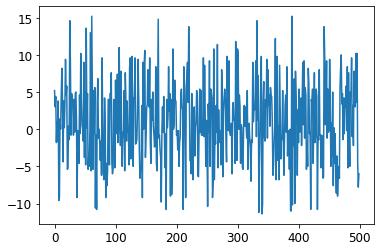

Iter: 6001, curr rwd: -1.2, current losses: 2.8, mean rwd over last 100 trials: 1.1
Iter: 6002, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 6003, curr rwd: -6.2, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 6004, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 6005, curr rwd: -5.4, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 6006, curr rwd: -11.4, current losses: 3.0, mean rwd over last 100 trials: 1.0
Iter: 6007, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 6008, curr rwd: -5.6, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 6009, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 6010, curr rwd: 4.4, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 6011, curr rwd: -6.2, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 6012, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials:

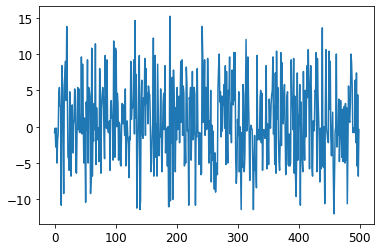

Iter: 6201, curr rwd: -4.4, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 6202, curr rwd: 6.2, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 6203, curr rwd: 9.8, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 6204, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 6205, curr rwd: -4.4, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 6206, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 6207, curr rwd: 3.0, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 6208, curr rwd: 10.0, current losses: 2.2, mean rwd over last 100 trials: 0.7
Iter: 6209, curr rwd: -5.2, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 6210, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 6211, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 6212, curr rwd: 1.2, current losses: 2.6, mean rwd over last 100 trials: 

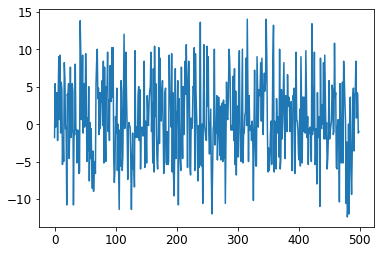

Iter: 6401, curr rwd: 0.6, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 6402, curr rwd: 14.4, current losses: 2.3, mean rwd over last 100 trials: 0.2
Iter: 6403, curr rwd: 9.0, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 6404, curr rwd: 1.2, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 6405, curr rwd: 8.2, current losses: 2.3, mean rwd over last 100 trials: 0.4
Iter: 6406, curr rwd: 5.8, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 6407, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 6408, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 6409, curr rwd: 7.6, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 6410, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 6411, curr rwd: -6.8, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 6412, curr rwd: 10.8, current losses: 2.4, mean rwd over last 100 trials: 0.6


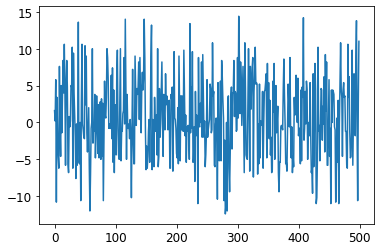

Iter: 6601, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 6602, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 6603, curr rwd: 1.2, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 6604, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 6605, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 6606, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 6607, curr rwd: 2.2, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 6608, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 6609, curr rwd: -1.2, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 6610, curr rwd: 10.4, current losses: 2.3, mean rwd over last 100 trials: 0.5
Iter: 6611, curr rwd: 1.8, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 6612, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: 0.

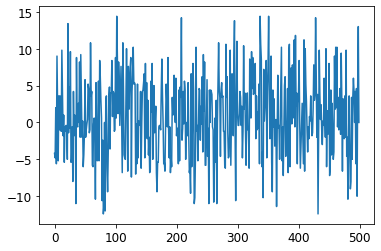

Iter: 6801, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 6802, curr rwd: 2.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 6803, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 6804, curr rwd: -11.0, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 6805, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 6806, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 6807, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 6808, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 6809, curr rwd: -9.6, current losses: 2.9, mean rwd over last 100 trials: 0.7
Iter: 6810, curr rwd: 4.2, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 6811, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 6812, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: 

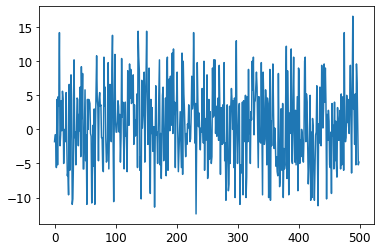

Iter: 7001, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 7002, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 7003, curr rwd: 10.8, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 7004, curr rwd: -1.0, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 7005, curr rwd: 1.0, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 7006, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 7007, curr rwd: 1.2, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 7008, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 7009, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 7010, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 7011, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 7012, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 0.4

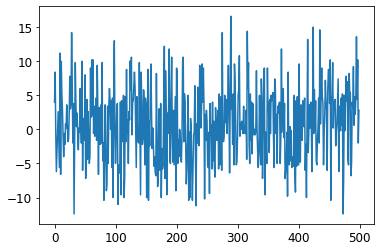

Iter: 7201, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 2.1
Iter: 7202, curr rwd: 10.0, current losses: 2.4, mean rwd over last 100 trials: 2.0
Iter: 7203, curr rwd: 0.6, current losses: 2.7, mean rwd over last 100 trials: 2.2
Iter: 7204, curr rwd: 14.2, current losses: 2.4, mean rwd over last 100 trials: 2.2
Iter: 7205, curr rwd: -1.2, current losses: 2.5, mean rwd over last 100 trials: 2.3
Iter: 7206, curr rwd: 8.2, current losses: 2.4, mean rwd over last 100 trials: 2.3
Iter: 7207, curr rwd: 9.6, current losses: 2.4, mean rwd over last 100 trials: 2.4
Iter: 7208, curr rwd: 2.0, current losses: 2.8, mean rwd over last 100 trials: 2.4
Iter: 7209, curr rwd: 10.2, current losses: 2.5, mean rwd over last 100 trials: 2.4
Iter: 7210, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 2.5
Iter: 7211, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: 2.5
Iter: 7212, curr rwd: 9.2, current losses: 2.2, mean rwd over last 100 trials: 2

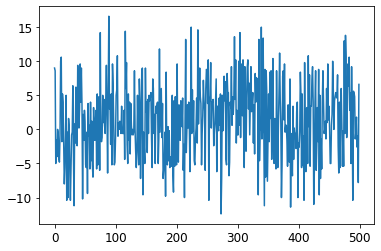

Iter: 7401, curr rwd: 5.2, current losses: 2.7, mean rwd over last 100 trials: 1.6
Iter: 7402, curr rwd: 0.6, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 7403, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 7404, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 7405, curr rwd: -5.8, current losses: 2.9, mean rwd over last 100 trials: 1.6
Iter: 7406, curr rwd: 1.2, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 7407, curr rwd: 6.2, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 7408, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 7409, curr rwd: 10.8, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 7410, curr rwd: 8.4, current losses: 2.4, mean rwd over last 100 trials: 1.8
Iter: 7411, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 1.8
Iter: 7412, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 1.9

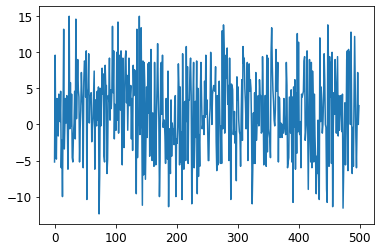

Iter: 7601, curr rwd: -4.4, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 7602, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 7603, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 7604, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 7605, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 7606, curr rwd: -4.8, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 7607, curr rwd: 2.0, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 7608, curr rwd: -6.6, current losses: 3.0, mean rwd over last 100 trials: 1.3
Iter: 7609, curr rwd: 4.6, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 7610, curr rwd: 1.4, current losses: 2.4, mean rwd over last 100 trials: 1.1
Iter: 7611, curr rwd: 11.4, current losses: 2.3, mean rwd over last 100 trials: 1.1
Iter: 7612, curr rwd: 7.8, current losses: 2.4, mean rwd over last 100 trials: 1.2

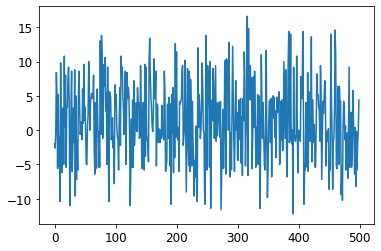

Iter: 7801, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 7802, curr rwd: 3.0, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 7803, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 7804, curr rwd: -3.6, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 7805, curr rwd: 8.8, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 7806, curr rwd: 8.0, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 7807, curr rwd: 0.8, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 7808, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 7809, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 7810, curr rwd: 0.8, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 7811, curr rwd: -2.6, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 7812, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: 0.3


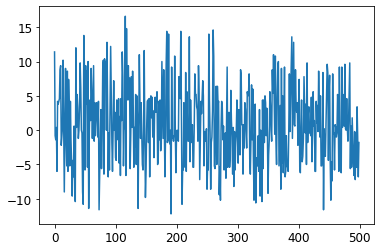

Iter: 8001, curr rwd: -3.8, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 8002, curr rwd: -1.2, current losses: 2.8, mean rwd over last 100 trials: 0.2
Iter: 8003, curr rwd: -10.8, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 8004, curr rwd: 8.8, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 8005, curr rwd: 2.8, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 8006, curr rwd: 7.4, current losses: 2.3, mean rwd over last 100 trials: 0.2
Iter: 8007, curr rwd: 0.2, current losses: 2.9, mean rwd over last 100 trials: 0.4
Iter: 8008, curr rwd: 7.0, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 8009, curr rwd: 7.4, current losses: 2.3, mean rwd over last 100 trials: 0.5
Iter: 8010, curr rwd: 3.8, current losses: 2.9, mean rwd over last 100 trials: 0.5
Iter: 8011, curr rwd: 1.6, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 8012, curr rwd: 9.2, current losses: 2.5, mean rwd over last 100 trials: 0.5


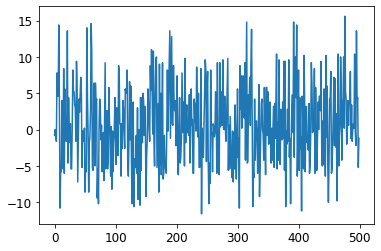

Iter: 8201, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 8202, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 8203, curr rwd: -2.0, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 8204, curr rwd: 7.6, current losses: 2.4, mean rwd over last 100 trials: 1.3
Iter: 8205, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 8206, curr rwd: -0.8, current losses: 2.9, mean rwd over last 100 trials: 1.5
Iter: 8207, curr rwd: 9.2, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 8208, curr rwd: -12.0, current losses: 2.7, mean rwd over last 100 trials: 1.5
Iter: 8209, curr rwd: 3.8, current losses: 2.4, mean rwd over last 100 trials: 1.4
Iter: 8210, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 8211, curr rwd: 10.2, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 8212, curr rwd: 2.2, current losses: 2.7, mean rwd over last 100 trials: 1

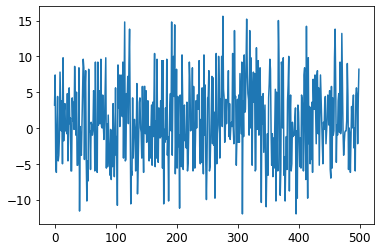

Iter: 8401, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 8402, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 1.4
Iter: 8403, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: 1.6
Iter: 8404, curr rwd: 4.4, current losses: 2.7, mean rwd over last 100 trials: 1.6
Iter: 8405, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 8406, curr rwd: 7.8, current losses: 2.4, mean rwd over last 100 trials: 1.7
Iter: 8407, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 8408, curr rwd: -3.8, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 8409, curr rwd: 2.8, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 8410, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 8411, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 8412, curr rwd: 2.2, current losses: 2.5, mean rwd over last 100 trials: 1.6
It

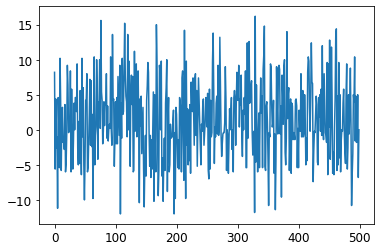

Iter: 8601, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 8602, curr rwd: -8.0, current losses: 2.8, mean rwd over last 100 trials: 1.7
Iter: 8603, curr rwd: 4.2, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 8604, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 1.6
Iter: 8605, curr rwd: 1.2, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 8606, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 8607, curr rwd: 0.6, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 8608, curr rwd: 5.4, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 8609, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 8610, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: 1.6
Iter: 8611, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 8612, curr rwd: -11.2, current losses: 2.8, mean rwd over last 100 trials: 1.

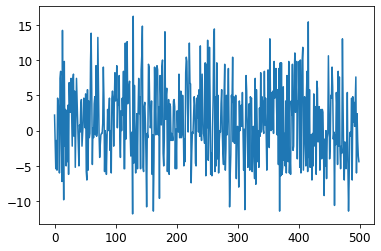

Iter: 8801, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: 0.2
Iter: 8802, curr rwd: 0.8, current losses: 2.4, mean rwd over last 100 trials: 0.1
Iter: 8803, curr rwd: -6.0, current losses: 2.9, mean rwd over last 100 trials: 0.2
Iter: 8804, curr rwd: 3.0, current losses: 2.5, mean rwd over last 100 trials: 0.0
Iter: 8805, curr rwd: -10.0, current losses: 2.8, mean rwd over last 100 trials: 0.1
Iter: 8806, curr rwd: 5.6, current losses: 2.4, mean rwd over last 100 trials: -0.0
Iter: 8807, curr rwd: 9.4, current losses: 2.4, mean rwd over last 100 trials: -0.1
Iter: 8808, curr rwd: -9.4, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 8809, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 8810, curr rwd: 0.6, current losses: 2.7, mean rwd over last 100 trials: -0.1
Iter: 8811, curr rwd: -4.0, current losses: 2.7, mean rwd over last 100 trials: -0.2
Iter: 8812, curr rwd: 4.2, current losses: 2.3, mean rwd over last 100 tria

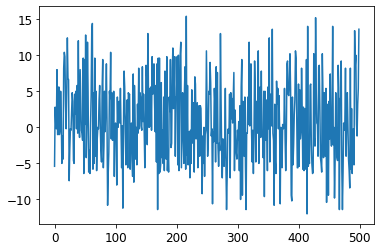

Iter: 9001, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: 0.3
Iter: 9002, curr rwd: 5.2, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 9003, curr rwd: 10.2, current losses: 2.3, mean rwd over last 100 trials: 0.3
Iter: 9004, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 9005, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 9006, curr rwd: -5.4, current losses: 2.9, mean rwd over last 100 trials: 0.4
Iter: 9007, curr rwd: 5.6, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 9008, curr rwd: 5.0, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 9009, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 9010, curr rwd: -1.8, current losses: 2.8, mean rwd over last 100 trials: 0.5
Iter: 9011, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 9012, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.

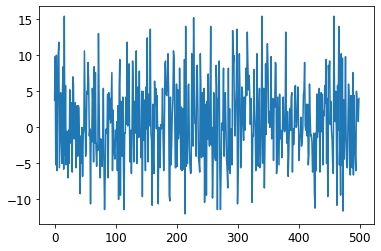

Iter: 9201, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 9202, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 9203, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 9204, curr rwd: -8.8, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 9205, curr rwd: 5.4, current losses: 2.6, mean rwd over last 100 trials: 0.4
Iter: 9206, curr rwd: 3.8, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 9207, curr rwd: 6.0, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 9208, curr rwd: 7.8, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 9209, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 9210, curr rwd: 10.0, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 9211, curr rwd: 4.6, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 9212, curr rwd: -6.6, current losses: 3.0, mean rwd over last 100 trials: 0.7


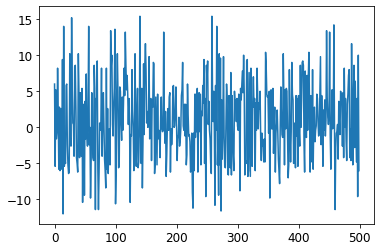

Iter: 9401, curr rwd: 11.2, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 9402, curr rwd: -6.8, current losses: 2.7, mean rwd over last 100 trials: 1.7
Iter: 9403, curr rwd: 3.4, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 9404, curr rwd: 1.2, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 9405, curr rwd: 5.8, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 9406, curr rwd: 11.2, current losses: 2.3, mean rwd over last 100 trials: 1.7
Iter: 9407, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 9408, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 9409, curr rwd: -5.4, current losses: 2.9, mean rwd over last 100 trials: 1.5
Iter: 9410, curr rwd: -6.0, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 9411, curr rwd: -4.8, current losses: 2.8, mean rwd over last 100 trials: 1.5
Iter: 9412, curr rwd: 8.2, current losses: 2.6, mean rwd over last 100 trials: 1.

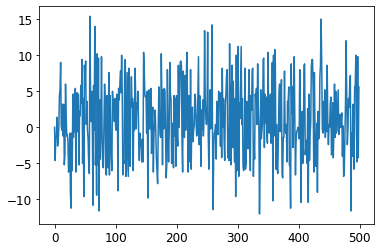

Iter: 9601, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 9602, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 9603, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 9604, curr rwd: -4.0, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 9605, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 9606, curr rwd: 8.6, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 9607, curr rwd: 3.6, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 9608, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 1.2
Iter: 9609, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 9610, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 9611, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 9612, curr rwd: -6.8, current losses: 3.1, mean rwd over last 100 trials: 1

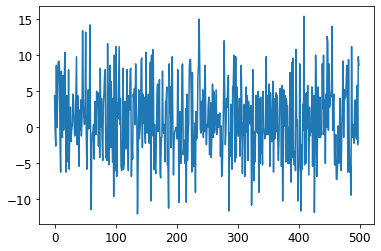

Iter: 9801, curr rwd: -1.6, current losses: 2.8, mean rwd over last 100 trials: 1.1
Iter: 9802, curr rwd: 2.8, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 9803, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 9804, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 9805, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 9806, curr rwd: 5.2, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 9807, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 9808, curr rwd: 10.2, current losses: 2.3, mean rwd over last 100 trials: 1.3
Iter: 9809, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 9810, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 1.2
Iter: 9811, curr rwd: -1.8, current losses: 2.8, mean rwd over last 100 trials: 1.3
Iter: 9812, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: 

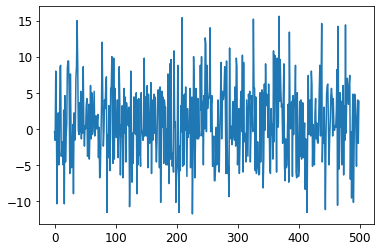

Iter: 10001, curr rwd: 4.0, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 10002, curr rwd: 9.2, current losses: 2.3, mean rwd over last 100 trials: 0.7
Iter: 10003, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 10004, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 10005, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 10006, curr rwd: -1.8, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 10007, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 10008, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 10009, curr rwd: 4.2, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 10010, curr rwd: 4.8, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 10011, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 10012, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 

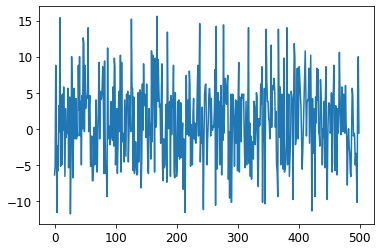

Iter: 10201, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 10202, curr rwd: -5.2, current losses: 3.0, mean rwd over last 100 trials: 0.9
Iter: 10203, curr rwd: -1.4, current losses: 2.9, mean rwd over last 100 trials: 0.8
Iter: 10204, curr rwd: 5.0, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 10205, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 10206, curr rwd: 2.4, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 10207, curr rwd: -7.0, current losses: 3.1, mean rwd over last 100 trials: 0.9
Iter: 10208, curr rwd: -0.8, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 10209, curr rwd: 10.2, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 10210, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 10211, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 10212, curr rwd: 4.8, current losses: 2.6, mean rwd over last 1

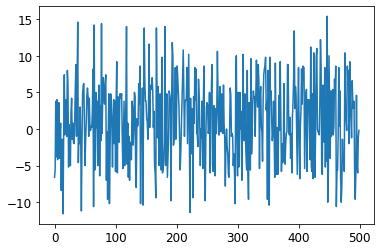

Iter: 10401, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 10402, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 10403, curr rwd: 6.4, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 10404, curr rwd: 11.6, current losses: 2.3, mean rwd over last 100 trials: 1.3
Iter: 10405, curr rwd: -6.6, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 10406, curr rwd: -11.4, current losses: 3.0, mean rwd over last 100 trials: 1.3
Iter: 10407, curr rwd: -2.6, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 10408, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 10409, curr rwd: 8.4, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 10410, curr rwd: -5.8, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 10411, curr rwd: -6.4, current losses: 3.0, mean rwd over last 100 trials: 0.9
Iter: 10412, curr rwd: 0.4, current losses: 2.5, mean rwd over last

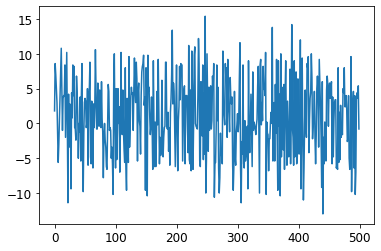

Iter: 10601, curr rwd: 10.2, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 10602, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 10603, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 10604, curr rwd: 7.4, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 10605, curr rwd: 4.6, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 10606, curr rwd: 1.4, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 10607, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 10608, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 10609, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 10610, curr rwd: 2.6, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 10611, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 10612, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100

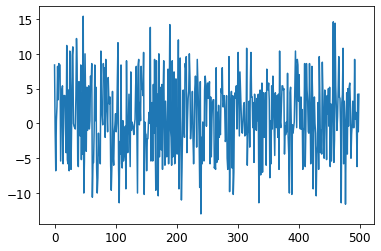

Iter: 10801, curr rwd: 4.4, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 10802, curr rwd: -0.8, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 10803, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 10804, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 10805, curr rwd: -6.8, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 10806, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 10807, curr rwd: -4.2, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 10808, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 10809, curr rwd: 9.8, current losses: 2.3, mean rwd over last 100 trials: 0.9
Iter: 10810, curr rwd: 9.8, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 10811, curr rwd: -6.6, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 10812, curr rwd: -5.0, current losses: 2.8, mean rwd over last 10

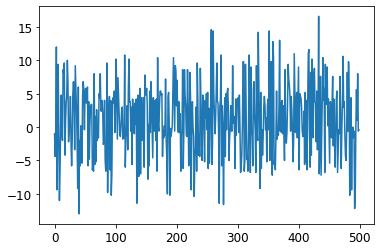

Iter: 11001, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 11002, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 11003, curr rwd: -5.4, current losses: 3.0, mean rwd over last 100 trials: 1.4
Iter: 11004, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 11005, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 11006, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: 1.2
Iter: 11007, curr rwd: 6.2, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 11008, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 1.3
Iter: 11009, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 11010, curr rwd: 9.4, current losses: 2.4, mean rwd over last 100 trials: 1.3
Iter: 11011, curr rwd: -11.2, current losses: 2.9, mean rwd over last 100 trials: 1.5
Iter: 11012, curr rwd: 3.6, current losses: 2.5, mean rwd over last 1

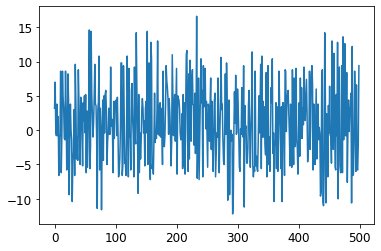

Iter: 11201, curr rwd: 6.6, current losses: 2.3, mean rwd over last 100 trials: 1.0
Iter: 11202, curr rwd: -10.2, current losses: 3.1, mean rwd over last 100 trials: 1.0
Iter: 11203, curr rwd: -6.2, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 11204, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 11205, curr rwd: 2.2, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 11206, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 11207, curr rwd: 3.2, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 11208, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 11209, curr rwd: -9.4, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 11210, curr rwd: 9.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 11211, curr rwd: 1.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 11212, curr rwd: -5.8, current losses: 2.6, mean rwd over last 100

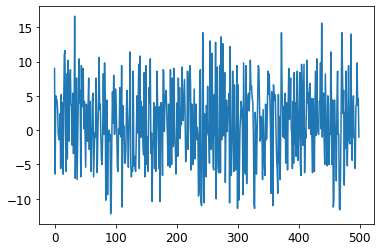

Iter: 11401, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 1.6
Iter: 11402, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: 1.5
Iter: 11403, curr rwd: -3.6, current losses: 2.7, mean rwd over last 100 trials: 1.5
Iter: 11404, curr rwd: 10.6, current losses: 2.3, mean rwd over last 100 trials: 1.5
Iter: 11405, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 11406, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: 1.5
Iter: 11407, curr rwd: 1.2, current losses: 2.4, mean rwd over last 100 trials: 1.4
Iter: 11408, curr rwd: -1.4, current losses: 2.5, mean rwd over last 100 trials: 1.5
Iter: 11409, curr rwd: 1.8, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 11410, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 11411, curr rwd: 8.8, current losses: 2.4, mean rwd over last 100 trials: 1.4
Iter: 11412, curr rwd: -0.8, current losses: 2.5, mean rwd over last

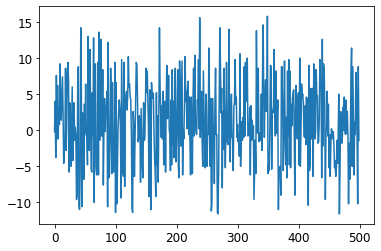

Iter: 11601, curr rwd: 3.6, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 11602, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 11603, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 11604, curr rwd: 0.2, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 11605, curr rwd: 10.4, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 11606, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 11607, curr rwd: 2.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 11608, curr rwd: 0.6, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 11609, curr rwd: 5.0, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 11610, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 11611, curr rwd: 3.4, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 11612, curr rwd: 8.4, current losses: 2.5, mean rwd over last 100 

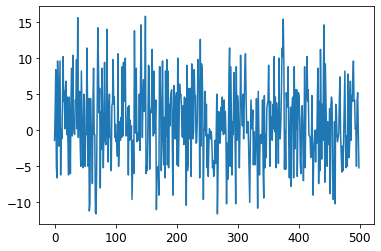

Iter: 11801, curr rwd: -5.4, current losses: 3.0, mean rwd over last 100 trials: 0.5
Iter: 11802, curr rwd: -1.2, current losses: 2.8, mean rwd over last 100 trials: 0.4
Iter: 11803, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 11804, curr rwd: 0.2, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 11805, curr rwd: -0.8, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 11806, curr rwd: -2.2, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 11807, curr rwd: 10.0, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 11808, curr rwd: -1.8, current losses: 2.5, mean rwd over last 100 trials: 0.5
Iter: 11809, curr rwd: -6.8, current losses: 2.9, mean rwd over last 100 trials: 0.5
Iter: 11810, curr rwd: -1.8, current losses: 2.7, mean rwd over last 100 trials: 0.5
Iter: 11811, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 11812, curr rwd: 6.4, current losses: 2.5, mean rwd over last

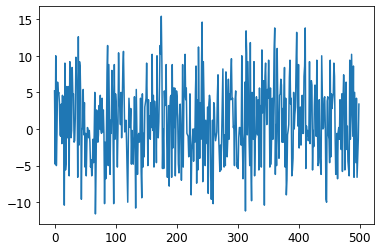

Iter: 12001, curr rwd: -5.2, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 12002, curr rwd: 7.8, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 12003, curr rwd: -1.6, current losses: 2.9, mean rwd over last 100 trials: 0.8
Iter: 12004, curr rwd: -11.0, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 12005, curr rwd: 2.2, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 12006, curr rwd: -6.2, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 12007, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 12008, curr rwd: 14.2, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 12009, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 12010, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 12011, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 12012, curr rwd: -7.0, current losses: 2.9, mean rwd over last

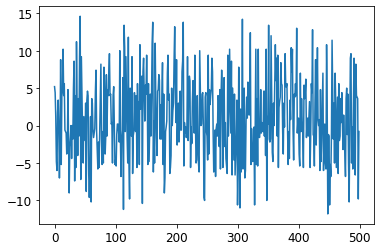

Iter: 12201, curr rwd: 0.4, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 12202, curr rwd: 9.0, current losses: 2.4, mean rwd over last 100 trials: 0.4
Iter: 12203, curr rwd: 10.8, current losses: 2.4, mean rwd over last 100 trials: 0.5
Iter: 12204, curr rwd: 9.4, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 12205, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 12206, curr rwd: 6.6, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 12207, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 12208, curr rwd: -1.8, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 12209, curr rwd: 6.2, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 12210, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 12211, curr rwd: 5.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 12212, curr rwd: 4.8, current losses: 2.4, mean rwd over last 100 t

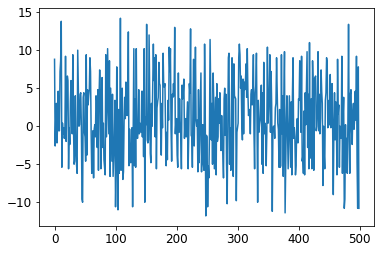

Iter: 12401, curr rwd: -10.8, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 12402, curr rwd: 1.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 12403, curr rwd: -6.4, current losses: 2.9, mean rwd over last 100 trials: 0.7
Iter: 12404, curr rwd: 10.2, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 12405, curr rwd: 9.6, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 12406, curr rwd: 3.2, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 12407, curr rwd: -3.6, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 12408, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 12409, curr rwd: 4.6, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 12410, curr rwd: 0.2, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 12411, curr rwd: 9.6, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 12412, curr rwd: -2.0, current losses: 2.9, mean rwd over last 10

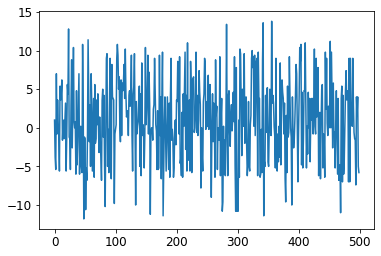

Iter: 12601, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 12602, curr rwd: -6.4, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 12603, curr rwd: -1.6, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 12604, curr rwd: -5.8, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 12605, curr rwd: -6.6, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 12606, curr rwd: -2.4, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 12607, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 12608, curr rwd: 9.0, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 12609, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 12610, curr rwd: 6.6, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 12611, curr rwd: -2.4, current losses: 2.9, mean rwd over last 100 trials: 0.9
Iter: 12612, curr rwd: -0.2, current losses: 2.5, mean rwd over last 

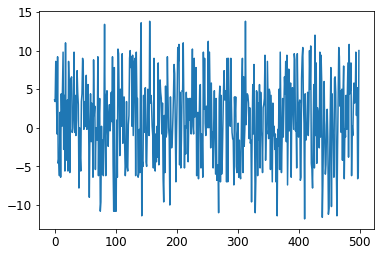

Iter: 12801, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 12802, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 12803, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 12804, curr rwd: 8.4, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 12805, curr rwd: 5.2, current losses: 2.4, mean rwd over last 100 trials: 1.4
Iter: 12806, curr rwd: 4.6, current losses: 2.9, mean rwd over last 100 trials: 1.4
Iter: 12807, curr rwd: 1.6, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 12808, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 12809, curr rwd: 0.6, current losses: 2.4, mean rwd over last 100 trials: 1.2
Iter: 12810, curr rwd: -1.6, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 12811, curr rwd: -1.4, current losses: 2.8, mean rwd over last 100 trials: 1.3
Iter: 12812, curr rwd: 11.2, current losses: 2.4, mean rwd over last 10

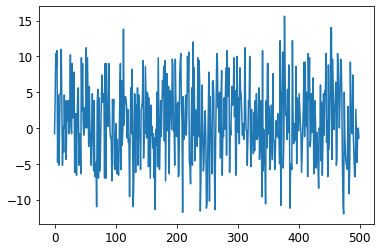

Iter: 13001, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 13002, curr rwd: 5.2, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 13003, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 13004, curr rwd: 3.6, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 13005, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 13006, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 13007, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 13008, curr rwd: -2.6, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 13009, curr rwd: 3.2, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 13010, curr rwd: 9.4, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 13011, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 13012, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 

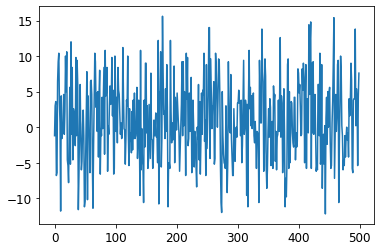

Iter: 13201, curr rwd: -8.8, current losses: 2.9, mean rwd over last 100 trials: 1.7
Iter: 13202, curr rwd: -1.6, current losses: 2.9, mean rwd over last 100 trials: 1.5
Iter: 13203, curr rwd: -6.2, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 13204, curr rwd: -4.4, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 13205, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 13206, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 1.3
Iter: 13207, curr rwd: 4.8, current losses: 2.4, mean rwd over last 100 trials: 1.2
Iter: 13208, curr rwd: 2.0, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 13209, curr rwd: 6.8, current losses: 2.4, mean rwd over last 100 trials: 1.1
Iter: 13210, curr rwd: -2.2, current losses: 2.9, mean rwd over last 100 trials: 1.1
Iter: 13211, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 13212, curr rwd: 10.6, current losses: 2.7, mean rwd over last

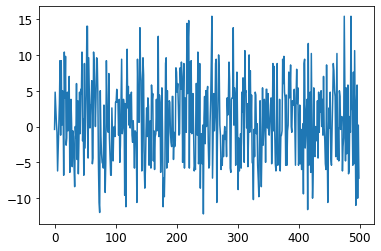

Iter: 13401, curr rwd: 11.0, current losses: 2.2, mean rwd over last 100 trials: 0.4
Iter: 13402, curr rwd: 7.0, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 13403, curr rwd: -3.6, current losses: 2.7, mean rwd over last 100 trials: 0.6
Iter: 13404, curr rwd: -1.2, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 13405, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 13406, curr rwd: -3.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 13407, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 13408, curr rwd: 4.6, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 13409, curr rwd: 8.0, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 13410, curr rwd: 4.6, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 13411, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 13412, curr rwd: 2.4, current losses: 2.5, mean rwd over last 100

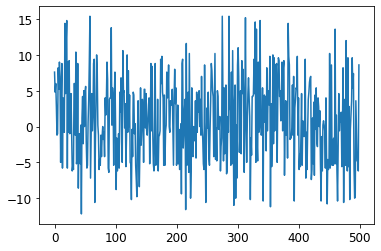

Iter: 13601, curr rwd: -0.6, current losses: 2.5, mean rwd over last 100 trials: -0.8
Iter: 13602, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: -0.7
Iter: 13603, curr rwd: 3.0, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 13604, curr rwd: 0.0, current losses: 3.0, mean rwd over last 100 trials: -0.5
Iter: 13605, curr rwd: 8.2, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 13606, curr rwd: 9.4, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 13607, curr rwd: 3.4, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 13608, curr rwd: 0.6, current losses: 2.4, mean rwd over last 100 trials: -0.3
Iter: 13609, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: -0.3
Iter: 13610, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: -0.3
Iter: 13611, curr rwd: 12.0, current losses: 2.3, mean rwd over last 100 trials: -0.3
Iter: 13612, curr rwd: -1.4, current losses: 2.5, mean rwd ov

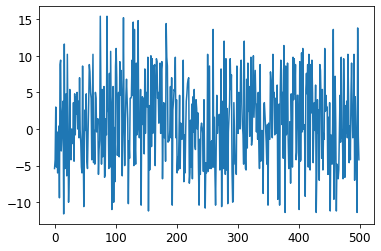

Iter: 13801, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 13802, curr rwd: 6.6, current losses: 2.3, mean rwd over last 100 trials: 0.8
Iter: 13803, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 13804, curr rwd: -1.0, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 13805, curr rwd: -5.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 13806, curr rwd: 10.0, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 13807, curr rwd: 9.0, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 13808, curr rwd: 10.2, current losses: 2.2, mean rwd over last 100 trials: 0.7
Iter: 13809, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 13810, curr rwd: -1.8, current losses: 3.0, mean rwd over last 100 trials: 0.9
Iter: 13811, curr rwd: 8.6, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 13812, curr rwd: 4.4, current losses: 2.4, mean rwd over last 10

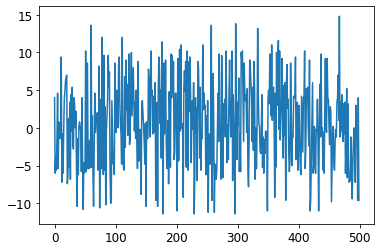

Iter: 14001, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: -0.7
Iter: 14002, curr rwd: -1.4, current losses: 2.7, mean rwd over last 100 trials: -0.7
Iter: 14003, curr rwd: 7.8, current losses: 2.6, mean rwd over last 100 trials: -0.7
Iter: 14004, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: -0.6
Iter: 14005, curr rwd: 9.8, current losses: 2.5, mean rwd over last 100 trials: -0.5
Iter: 14006, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 14007, curr rwd: 0.2, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 14008, curr rwd: 3.6, current losses: 2.5, mean rwd over last 100 trials: -0.4
Iter: 14009, curr rwd: -0.2, current losses: 2.8, mean rwd over last 100 trials: -0.4
Iter: 14010, curr rwd: -2.2, current losses: 2.6, mean rwd over last 100 trials: -0.4
Iter: 14011, curr rwd: -6.0, current losses: 2.7, mean rwd over last 100 trials: -0.5
Iter: 14012, curr rwd: -1.0, current losses: 2.8, mean rwd ov

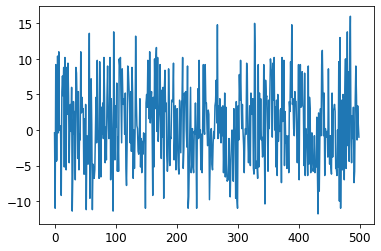

Iter: 14201, curr rwd: 0.8, current losses: 2.7, mean rwd over last 100 trials: 0.3
Iter: 14202, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 14203, curr rwd: -3.8, current losses: 2.7, mean rwd over last 100 trials: 0.4
Iter: 14204, curr rwd: -4.4, current losses: 2.6, mean rwd over last 100 trials: 0.2
Iter: 14205, curr rwd: -0.8, current losses: 2.8, mean rwd over last 100 trials: 0.2
Iter: 14206, curr rwd: -1.2, current losses: 2.6, mean rwd over last 100 trials: 0.1
Iter: 14207, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: -0.0
Iter: 14208, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 14209, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: -0.0
Iter: 14210, curr rwd: -4.6, current losses: 2.8, mean rwd over last 100 trials: 0.0
Iter: 14211, curr rwd: 10.2, current losses: 2.5, mean rwd over last 100 trials: -0.1
Iter: 14212, curr rwd: -5.2, current losses: 2.6, mean rwd over la

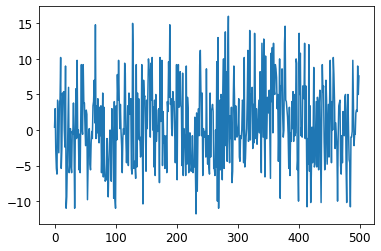

Iter: 14401, curr rwd: -11.0, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 14402, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 14403, curr rwd: 5.4, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 14404, curr rwd: 9.8, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 14405, curr rwd: 4.2, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 14406, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 14407, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 14408, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 14409, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 0.6
Iter: 14410, curr rwd: 7.4, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 14411, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: 0.6
Iter: 14412, curr rwd: 1.4, current losses: 2.7, mean rwd over last 100 

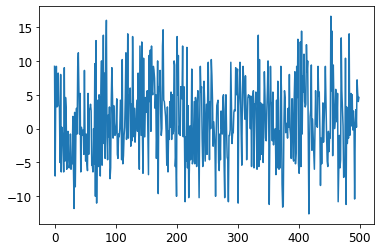

Iter: 14601, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 14602, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 1.5
Iter: 14603, curr rwd: -0.6, current losses: 2.8, mean rwd over last 100 trials: 1.5
Iter: 14604, curr rwd: 9.4, current losses: 2.4, mean rwd over last 100 trials: 1.4
Iter: 14605, curr rwd: -4.6, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 14606, curr rwd: 0.0, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 14607, curr rwd: 5.4, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 14608, curr rwd: -10.8, current losses: 2.9, mean rwd over last 100 trials: 1.3
Iter: 14609, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 1.2
Iter: 14610, curr rwd: 5.6, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 14611, curr rwd: 3.0, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 14612, curr rwd: -1.0, current losses: 2.8, mean rwd over last 1

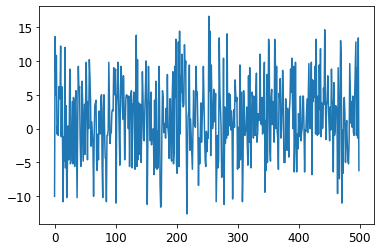

Iter: 14801, curr rwd: 7.2, current losses: 2.7, mean rwd over last 100 trials: 2.4
Iter: 14802, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: 2.5
Iter: 14803, curr rwd: 2.2, current losses: 2.5, mean rwd over last 100 trials: 2.5
Iter: 14804, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 2.5
Iter: 14805, curr rwd: 3.2, current losses: 2.6, mean rwd over last 100 trials: 2.4
Iter: 14806, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: 2.5
Iter: 14807, curr rwd: -0.2, current losses: 2.5, mean rwd over last 100 trials: 2.4
Iter: 14808, curr rwd: -5.6, current losses: 2.7, mean rwd over last 100 trials: 2.4
Iter: 14809, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 2.3
Iter: 14810, curr rwd: -1.2, current losses: 2.7, mean rwd over last 100 trials: 2.3
Iter: 14811, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 2.3
Iter: 14812, curr rwd: 5.2, current losses: 2.4, mean rwd over last 1

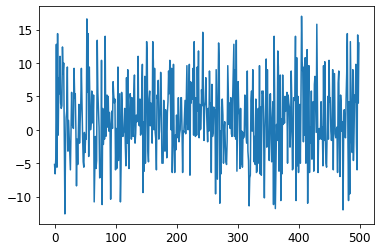

Iter: 15001, curr rwd: -1.6, current losses: 2.5, mean rwd over last 100 trials: 2.1
Iter: 15002, curr rwd: 9.0, current losses: 2.4, mean rwd over last 100 trials: 2.1
Iter: 15003, curr rwd: 5.0, current losses: 2.6, mean rwd over last 100 trials: 2.2
Iter: 15004, curr rwd: -5.6, current losses: 2.8, mean rwd over last 100 trials: 2.3
Iter: 15005, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 2.2
Iter: 15006, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: 2.0
Iter: 15007, curr rwd: 4.6, current losses: 2.4, mean rwd over last 100 trials: 1.9
Iter: 15008, curr rwd: -2.8, current losses: 2.6, mean rwd over last 100 trials: 1.8
Iter: 15009, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 1.8
Iter: 15010, curr rwd: 5.4, current losses: 2.4, mean rwd over last 100 trials: 1.7
Iter: 15011, curr rwd: -8.0, current losses: 3.1, mean rwd over last 100 trials: 1.8
Iter: 15012, curr rwd: -1.0, current losses: 2.5, mean rwd over last 1

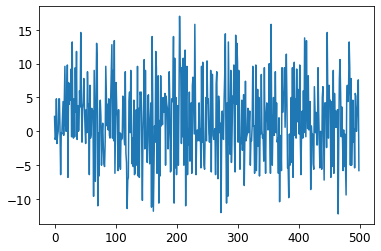

Iter: 15201, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 15202, curr rwd: 6.4, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 15203, curr rwd: 9.2, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 15204, curr rwd: 5.6, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 15205, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 1.8
Iter: 15206, curr rwd: 8.2, current losses: 2.4, mean rwd over last 100 trials: 1.8
Iter: 15207, curr rwd: -3.8, current losses: 2.6, mean rwd over last 100 trials: 1.8
Iter: 15208, curr rwd: 9.4, current losses: 2.6, mean rwd over last 100 trials: 1.8
Iter: 15209, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 1.8
Iter: 15210, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 trials: 1.9
Iter: 15211, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 15212, curr rwd: 11.2, current losses: 2.4, mean rwd over last 100 tr

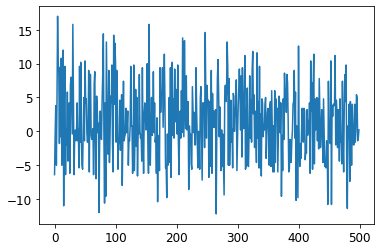

Iter: 15401, curr rwd: -0.8, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 15402, curr rwd: 3.0, current losses: 2.7, mean rwd over last 100 trials: 0.7
Iter: 15403, curr rwd: -5.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 15404, curr rwd: 4.4, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 15405, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 15406, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 15407, curr rwd: 4.8, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 15408, curr rwd: -4.4, current losses: 2.8, mean rwd over last 100 trials: 0.9
Iter: 15409, curr rwd: 0.4, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 15410, curr rwd: 10.8, current losses: 2.3, mean rwd over last 100 trials: 0.8
Iter: 15411, curr rwd: 5.6, current losses: 2.4, mean rwd over last 100 trials: 0.9
Iter: 15412, curr rwd: 1.0, current losses: 2.5, mean rwd over last 10

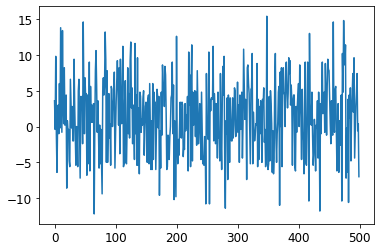

Iter: 15601, curr rwd: 10.0, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 15602, curr rwd: 6.4, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 15603, curr rwd: 14.4, current losses: 2.3, mean rwd over last 100 trials: 1.6
Iter: 15604, curr rwd: 3.8, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 15605, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 15606, curr rwd: 9.6, current losses: 2.2, mean rwd over last 100 trials: 1.8
Iter: 15607, curr rwd: 5.6, current losses: 2.5, mean rwd over last 100 trials: 1.9
Iter: 15608, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 1.9
Iter: 15609, curr rwd: -4.2, current losses: 2.6, mean rwd over last 100 trials: 1.9
Iter: 15610, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 2.0
Iter: 15611, curr rwd: 9.4, current losses: 2.3, mean rwd over last 100 trials: 1.9
Iter: 15612, curr rwd: 9.4, current losses: 2.5, mean rwd over last 100

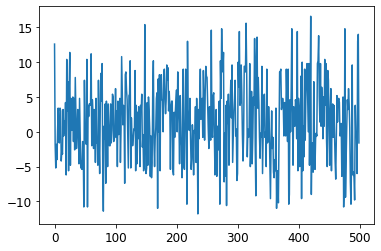

Iter: 15801, curr rwd: 8.4, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 15802, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 1.5
Iter: 15803, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 15804, curr rwd: 7.6, current losses: 2.5, mean rwd over last 100 trials: 1.5
Iter: 15805, curr rwd: -6.8, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 15806, curr rwd: 3.0, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 15807, curr rwd: 3.2, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 15808, curr rwd: -0.2, current losses: 2.6, mean rwd over last 100 trials: 1.5
Iter: 15809, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 1.5
Iter: 15810, curr rwd: 8.8, current losses: 2.4, mean rwd over last 100 trials: 1.5
Iter: 15811, curr rwd: 0.6, current losses: 2.5, mean rwd over last 100 trials: 1.5
Iter: 15812, curr rwd: -2.2, current losses: 2.6, mean rwd over last 10

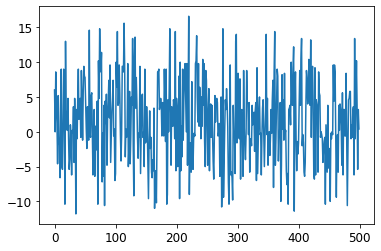

Iter: 16001, curr rwd: 3.4, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 16002, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 16003, curr rwd: 2.6, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 16004, curr rwd: -6.0, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 16005, curr rwd: 12.2, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 16006, curr rwd: 3.8, current losses: 2.5, mean rwd over last 100 trials: 1.1
Iter: 16007, curr rwd: -1.4, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 16008, curr rwd: 9.4, current losses: 2.3, mean rwd over last 100 trials: 1.2
Iter: 16009, curr rwd: -5.4, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 16010, curr rwd: 3.6, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 16011, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 16012, curr rwd: 1.2, current losses: 2.6, mean rwd over last 100 

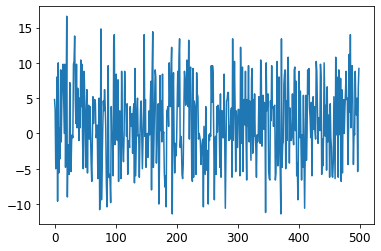

Iter: 16201, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 2.1
Iter: 16202, curr rwd: 6.4, current losses: 2.4, mean rwd over last 100 trials: 2.0
Iter: 16203, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: 2.1
Iter: 16204, curr rwd: -6.2, current losses: 2.8, mean rwd over last 100 trials: 2.0
Iter: 16205, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 2.0
Iter: 16206, curr rwd: -10.6, current losses: 2.9, mean rwd over last 100 trials: 2.0
Iter: 16207, curr rwd: -1.6, current losses: 2.7, mean rwd over last 100 trials: 1.9
Iter: 16208, curr rwd: 9.6, current losses: 2.3, mean rwd over last 100 trials: 1.9
Iter: 16209, curr rwd: 3.6, current losses: 2.7, mean rwd over last 100 trials: 2.0
Iter: 16210, curr rwd: -0.6, current losses: 2.6, mean rwd over last 100 trials: 2.0
Iter: 16211, curr rwd: 4.2, current losses: 2.3, mean rwd over last 100 trials: 2.1
Iter: 16212, curr rwd: 5.0, current losses: 2.8, mean rwd over last 1

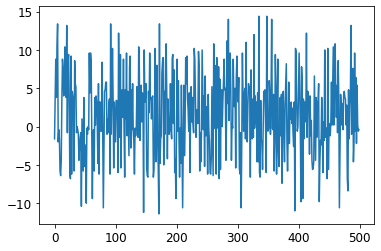

Iter: 16401, curr rwd: 0.8, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 16402, curr rwd: 9.4, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 16403, curr rwd: -3.0, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 16404, curr rwd: -7.2, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 16405, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 1.1
Iter: 16406, curr rwd: 4.2, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 16407, curr rwd: 9.0, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 16408, curr rwd: -7.6, current losses: 3.0, mean rwd over last 100 trials: 1.1
Iter: 16409, curr rwd: 5.2, current losses: 2.9, mean rwd over last 100 trials: 1.0
Iter: 16410, curr rwd: -8.2, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 16411, curr rwd: 8.2, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 16412, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 

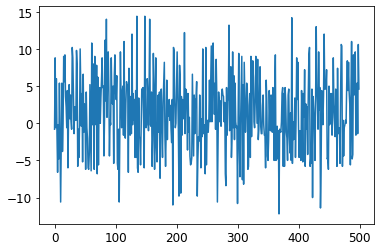

Iter: 16601, curr rwd: -5.2, current losses: 2.6, mean rwd over last 100 trials: 1.6
Iter: 16602, curr rwd: 8.2, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 16603, curr rwd: 5.6, current losses: 2.6, mean rwd over last 100 trials: 1.7
Iter: 16604, curr rwd: -2.4, current losses: 2.7, mean rwd over last 100 trials: 1.8
Iter: 16605, curr rwd: -5.8, current losses: 2.6, mean rwd over last 100 trials: 1.8
Iter: 16606, curr rwd: 3.2, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 16607, curr rwd: -11.0, current losses: 2.9, mean rwd over last 100 trials: 1.7
Iter: 16608, curr rwd: -0.8, current losses: 2.8, mean rwd over last 100 trials: 1.7
Iter: 16609, curr rwd: 4.6, current losses: 2.4, mean rwd over last 100 trials: 1.6
Iter: 16610, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 1.7
Iter: 16611, curr rwd: 5.6, current losses: 2.5, mean rwd over last 100 trials: 1.6
Iter: 16612, curr rwd: -1.6, current losses: 2.7, mean rwd over last 1

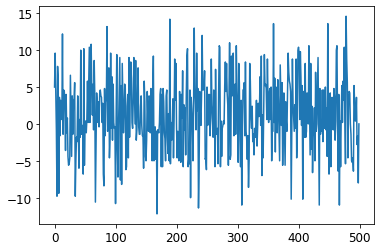

Iter: 16801, curr rwd: 0.6, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 16802, curr rwd: 4.0, current losses: 2.6, mean rwd over last 100 trials: 1.1
Iter: 16803, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 1.2
Iter: 16804, curr rwd: 4.8, current losses: 2.5, mean rwd over last 100 trials: 1.0
Iter: 16805, curr rwd: -6.0, current losses: 2.8, mean rwd over last 100 trials: 1.0
Iter: 16806, curr rwd: -0.4, current losses: 2.7, mean rwd over last 100 trials: 0.9
Iter: 16807, curr rwd: 5.0, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 16808, curr rwd: -0.8, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 16809, curr rwd: 0.4, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 16810, curr rwd: 0.0, current losses: 2.6, mean rwd over last 100 trials: 1.0
Iter: 16811, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 1.0
Iter: 16812, curr rwd: -0.2, current losses: 2.8, mean rwd over last 100

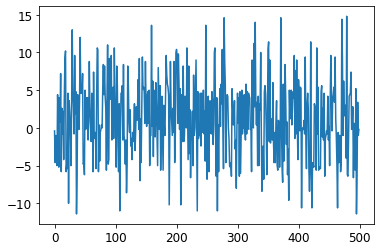

Iter: 17001, curr rwd: -0.8, current losses: 2.5, mean rwd over last 100 trials: 0.3
Iter: 17002, curr rwd: 9.8, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 17003, curr rwd: -0.4, current losses: 2.5, mean rwd over last 100 trials: 0.4
Iter: 17004, curr rwd: -6.2, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 17005, curr rwd: 2.4, current losses: 2.5, mean rwd over last 100 trials: 0.2
Iter: 17006, curr rwd: -6.0, current losses: 2.9, mean rwd over last 100 trials: 0.3
Iter: 17007, curr rwd: -11.2, current losses: 2.9, mean rwd over last 100 trials: 0.3
Iter: 17008, curr rwd: 4.0, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 17009, curr rwd: 8.6, current losses: 2.4, mean rwd over last 100 trials: 0.2
Iter: 17010, curr rwd: -1.0, current losses: 2.4, mean rwd over last 100 trials: 0.3
Iter: 17011, curr rwd: -2.0, current losses: 2.6, mean rwd over last 100 trials: 0.3
Iter: 17012, curr rwd: 8.8, current losses: 2.5, mean rwd over last 

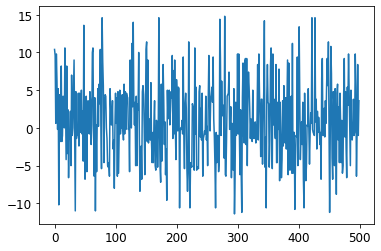

Iter: 17201, curr rwd: -9.8, current losses: 2.7, mean rwd over last 100 trials: 1.0
Iter: 17202, curr rwd: -1.0, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 17203, curr rwd: 0.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 17204, curr rwd: 11.4, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 17205, curr rwd: 4.4, current losses: 2.4, mean rwd over last 100 trials: 0.8
Iter: 17206, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 0.9
Iter: 17207, curr rwd: 5.2, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 17208, curr rwd: 9.4, current losses: 2.5, mean rwd over last 100 trials: 0.9
Iter: 17209, curr rwd: -6.2, current losses: 2.9, mean rwd over last 100 trials: 1.1
Iter: 17210, curr rwd: 11.0, current losses: 2.4, mean rwd over last 100 trials: 1.1
Iter: 17211, curr rwd: 15.2, current losses: 2.4, mean rwd over last 100 trials: 1.2
Iter: 17212, curr rwd: 10.0, current losses: 2.5, mean rwd over last 

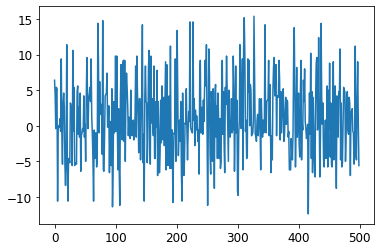

Iter: 17401, curr rwd: -2.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 17402, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 17403, curr rwd: 8.6, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 17404, curr rwd: 8.0, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 17405, curr rwd: -5.8, current losses: 3.0, mean rwd over last 100 trials: 0.8
Iter: 17406, curr rwd: -4.6, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 17407, curr rwd: 8.2, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 17408, curr rwd: 9.6, current losses: 2.5, mean rwd over last 100 trials: 0.8
Iter: 17409, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 0.8
Iter: 17410, curr rwd: -1.0, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 17411, curr rwd: 0.4, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 17412, curr rwd: 9.8, current losses: 2.4, mean rwd over last 100

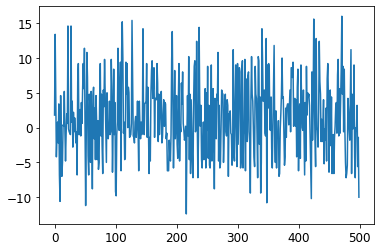

Iter: 17601, curr rwd: 9.4, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 17602, curr rwd: 0.0, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 17603, curr rwd: 4.4, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 17604, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 1.4
Iter: 17605, curr rwd: -0.4, current losses: 2.6, mean rwd over last 100 trials: 1.4
Iter: 17606, curr rwd: 4.2, current losses: 2.5, mean rwd over last 100 trials: 1.3
Iter: 17607, curr rwd: -4.8, current losses: 2.7, mean rwd over last 100 trials: 1.4
Iter: 17608, curr rwd: -0.6, current losses: 2.7, mean rwd over last 100 trials: 1.3
Iter: 17609, curr rwd: -10.4, current losses: 2.6, mean rwd over last 100 trials: 1.3
Iter: 17610, curr rwd: -4.0, current losses: 2.5, mean rwd over last 100 trials: 1.2
Iter: 17611, curr rwd: 3.4, current losses: 2.6, mean rwd over last 100 trials: 1.2
Iter: 17612, curr rwd: 6.6, current losses: 2.4, mean rwd over last 10

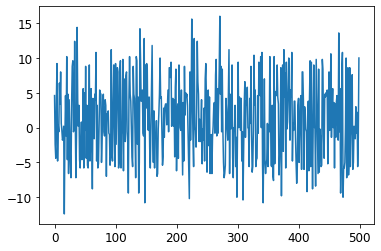

Iter: 17801, curr rwd: 6.4, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 17802, curr rwd: -5.8, current losses: 2.7, mean rwd over last 100 trials: 0.8
Iter: 17803, curr rwd: -5.4, current losses: 2.6, mean rwd over last 100 trials: 0.8
Iter: 17804, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 0.7
Iter: 17805, curr rwd: 9.0, current losses: 2.5, mean rwd over last 100 trials: 0.6
Iter: 17806, curr rwd: 8.0, current losses: 2.4, mean rwd over last 100 trials: 0.7
Iter: 17807, curr rwd: 4.6, current losses: 2.5, mean rwd over last 100 trials: 0.7
Iter: 17808, curr rwd: -1.8, current losses: 2.6, mean rwd over last 100 trials: 0.7
Iter: 17809, curr rwd: -5.0, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 17810, curr rwd: -6.4, current losses: 2.8, mean rwd over last 100 trials: 0.6
Iter: 17811, curr rwd: 0.2, current losses: 2.6, mean rwd over last 100 trials: 0.5
Iter: 17812, curr rwd: -0.4, current losses: 2.8, mean rwd over last 1

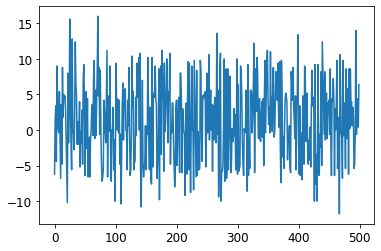

Iter: 18001, curr rwd: -5.8, current losses: 2.8, mean rwd over last 100 trials: 1.3


KeyboardInterrupt: ignored

In [ ]:
env = Hangman('words_250000_train.txt' , max_lives = 6, verbose = False)
#env.seed(42);
rwds_list=[]

for iteration in range(n_iterations):
    
    all_rewards, all_grads, all_losses = play_multiple_episodes(env, n_episodes_per_update, n_max_steps, full_model, loss_fn)

    total_rewards = sum(map(sum, all_rewards)) 
    mean_rewards=total_rewards / n_episodes_per_update
    rwds_list.append(mean_rewards)

    print("\rIter: {}, curr rwd: {:.1f}, current losses: {:.1f}, mean rwd over last 100 trials: {:.1f}".format(iteration,\
                                        mean_rewards, np.mean(all_losses),np.mean(rwds_list[-101:-1])))
    
    all_final_rewards = discount_and_normalize_rewards(all_rewards,discount_rate)
    
    all_mean_grads = []
    for var_index in range(len(full_model.trainable_variables)):

        # Standard gradient:
        mean_grads = tf.reduce_mean([tf.convert_to_tensor(all_grads[episode_index][step][var_index])
             for episode_index, final_rewards in enumerate(all_final_rewards)
                 for step, final_reward in enumerate(final_rewards)], axis=0)
        
        # Policy gradient:
        # mean_grads = tf.reduce_mean(
        #     [final_reward * all_grads[episode_index][step][var_index]
        #      for episode_index, final_rewards in enumerate(all_final_rewards)
        #          for step, final_reward in enumerate(final_rewards)], axis=0)

        all_mean_grads.append(mean_grads)
    optimizer.apply_gradients(zip(all_mean_grads, full_model.trainable_variables))
    if iteration>0 and iteration % save_episode == 0 :

#        full_model.save('Hangman_PG.h5',include_optimizer=True)

        xx=LinearRegression().fit(pd.DataFrame(np.arange(len(rwds_list))),pd.DataFrame(rwds_list))
        print('Overall mean reward after {} iterations: {:.1f}. Mean reward for last 500 instances: {:.1f},'\
              ' slope of LinReg: {:.10f}'.format(iteration, np.mean(rwds_list),\
                                                np.mean(rwds_list[-501:-1]),xx.coef_[0][0]))
        full_model.save('./drive/MyDrive/Hangman_PG.h5', include_optimizer=True)
        plt.plot(rwds_list[-501:-1])
        plt.show()

# Some random testing:

In [ ]:
# Train accuracy:

wins,losses,games=0,0,0

env = Hangman('words_250000_train.txt'\
              , max_lives = 6, verbose = False)
remguess=[]
totwin=[]
words=[]
overall_rwd=0
tot_trials=100
for i in range(tot_trials):
    done = False
    obs = env.reset()
    j=0
    tot_rwd=0
    while not done and j<40:
        j+=1
        inp1=np.array([state_to_input(obs)])
        inp2=np.array([guess_to_input(env.guessed)])
        action_proba = full_model([inp1,inp2])
        action_guess=chr(97+np.argmax(action_proba))
        obs, rwd , done , wrd = env.step(action_guess)
        tot_rwd+=rwd
    if rwd==10: wins+=1
    if rwd==-10: losses+=1
    games+=1

print('Games: {}, Wins: {}, Losses: {}, Win percentage: {:.3f}    '.format(games,wins,losses,wins/games))

Games: 100, Wins: 53, Losses: 47, Win percentage: 0.530    


In [ ]:
# Test accuracy:

wins,losses,games=0,0,0

env = Hangman('test_words.txt'\
              , max_lives = 6, verbose = False)
remguess=[]
totwin=[]
words=[]
overall_rwd=0
tot_trials=100

for i in range(tot_trials):
    done = False
    obs = env.reset()
    j=0
    tot_rwd=0
    while not done and j<40:
        j+=1
        inp1=np.array([state_to_input(obs)])
        inp2=np.array([guess_to_input(env.guessed)])
        action_proba = full_model([inp1,inp2])
        action_guess=chr(97+np.argmax(action_proba))
        obs, rwd , done , wrd = env.step(action_guess)
        tot_rwd+=rwd
#        print('Guessing:', action_guess,obs,'      reward:', rwd)
#    print('total reward:',tot_rwd)
    if rwd==10: wins+=1
    if rwd==-10: losses+=1
    games+=1
    print('Games: {}, Wins: {}, Losses: {}, Win percentage: {:.3f}    '.format(games,wins,losses,wins/games))
#    overall_rwd+=tot_rwd
#    totwin.append(rwd)
#    words.append(wrd)
#    remguess.append(env.curr_live)
#print('Mean Reward over all {} trials: {:.1f}'.format(tot_trials,\
#overall_rwd/tot_trials), end='\r')
#    print(i+1,sum(item//30 for item in totwin),sum(item//30 for item in totwin)/(i+1),'',end = "\r")

Games: 1, Wins: 0, Losses: 1, Win percentage: 0.000    
Games: 2, Wins: 1, Losses: 1, Win percentage: 0.500    
Games: 3, Wins: 1, Losses: 2, Win percentage: 0.333    
Games: 4, Wins: 2, Losses: 2, Win percentage: 0.500    
Games: 5, Wins: 2, Losses: 2, Win percentage: 0.400    
Games: 6, Wins: 3, Losses: 2, Win percentage: 0.500    
Games: 7, Wins: 3, Losses: 3, Win percentage: 0.429    
Games: 8, Wins: 3, Losses: 4, Win percentage: 0.375    
Games: 9, Wins: 3, Losses: 5, Win percentage: 0.333    
Games: 10, Wins: 3, Losses: 6, Win percentage: 0.300    
Games: 11, Wins: 3, Losses: 7, Win percentage: 0.273    
Games: 12, Wins: 4, Losses: 7, Win percentage: 0.333    
Games: 13, Wins: 4, Losses: 8, Win percentage: 0.308    
Games: 14, Wins: 5, Losses: 8, Win percentage: 0.357    
Games: 15, Wins: 6, Losses: 8, Win percentage: 0.400    
Games: 16, Wins: 6, Losses: 9, Win percentage: 0.375    
Games: 17, Wins: 7, Losses: 9, Win percentage: 0.412    
Games: 18, Wins: 8, Losses: 9, Win perce